[-0.34851914040913634, 0.2493473969668556, 0.3826375717626691, 0.414177989813882, 0.7984553359435091, 1.1676329317091176, 1.9635628048675757, 2.195579169859413, 2.406976700758169, 2.5107730053744697, 3.070972562073792, 3.2732285241017243, 3.5022820423304757, 4.19667495308959, 4.615399378765759, 16.408499359144596, 17.662830129255752, 18.006422880700487, 18.03927585906597, 19.7885251348833, 20.07065907953699, 21.748300805871878, 22.236715115420605, 22.904943421711934, 23.473903643039094, 24.27671054331932, 25.779130345903845, 27.853688811580582, 36.016532179904104]


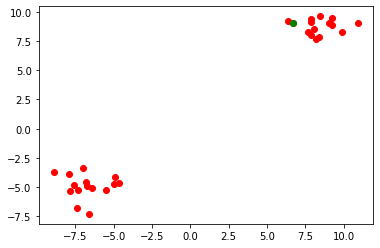

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
import random
import math
import matplotlib.pyplot as plt
from no_cluster import get_cluster
import copy

In [2]:
#random.seed(15)
P=2 #signal power threshold
#stream = BitStream()
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 30
        self.rounds = 200
        self.epochs = 2
        self.local_batches = 64
        self.lr = 0.01
        self.C = 0.9 #fraction of clients used in the round
        self.drop_rate = 0.1 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1
 
args = Arguments()

In [4]:
#checking if gpu is available
use_cuda = False
#print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
clients = []

#generating virtual clients
for i in range(int(args.clients)):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
    
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

/home/iiitd/anaconda3/envs/FL/lib/python3.8/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [5]:
for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average

#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=True, download=True, transform=transform)
global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [6]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50)  #10 iid 50 non iid
        self.fc2 = nn.Linear(50, 10) 

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

In [7]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data,target=data,target
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get() 
    #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [8]:
def test(args, model, device, test_loader, name):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))


In [9]:
torch.manual_seed(args.torch_seed)
#global_model = Net() #redundant code as we don't use it for training: assigns a CNN to the global model

for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    

accuracy=[]
rc=1

[6.317984667002558, 6.715411813088494, 6.847301661198481, 6.950971410077244, 7.176047369880534, 7.275378717720197, 7.831999635556276, 8.421372706862233, 8.61932164591158, 9.136500235240014, 9.194348752720689, 9.498608257827389, 9.955274802216527, 10.280330976182563, 10.411933500835378, 14.654755750867812, 16.459249330209847, 17.21454893540461, 17.504737475531517, 18.399316840386064, 18.466004201593638, 18.59439562181027, 20.661219281690492, 21.02351324341178, 22.767890625530775, 24.47514988548019, 24.645371045212794, 24.960295367778798, 27.755199344119323]


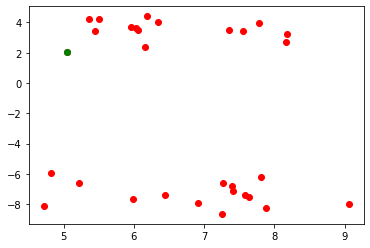

Power Allocated= 3.9603861700152834
CSI= 0.9559111861186935
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.338628
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.644971


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.063633248676008
CSI= 0.2536220260977248
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8443805004639175
CSI= 0.8604904399159895
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8854109698121486
CSI= 0.891983086092571
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0579234948526848
CSI= 0.5131929155634348
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.925297505545566
CSI= 0.9248888895877785
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.101219145456272
CSI= 0.344199799534593
SNR= 7.831999635556276
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.114424311561159
CSI= 0.34577140

/tmp/ipykernel_245397/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client13 Train Epoch: 1 [0/320 (0%)]	Loss: 2.321808
Model client13 Train Epoch: 2 [0/320 (0%)]	Loss: 2.063563

Power Allocated= 3.5581178321763467
CSI= 0.6904214789158557
SNR= 10.280330976182563
Client: client14
Model client14 Train Epoch: 1 [0/320 (0%)]	Loss: 2.323667
Model client14 Train Epoch: 2 [0/320 (0%)]	Loss: 2.054085

Power Allocated= 0
CSI= 0.18786999801225368
SNR= 10.411933500835378
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3662210929631469
CSI= 0.2747035876289624
SNR= 14.654755750867812
Client: client16
Model client16 Train Epoch: 1 [0/320 (0%)]	Loss: 2.549332
Model client16 Train Epoch: 2 [0/320 (0%)]	Loss: 2.104692

Power Allocated= 1.4625189879413312
CSI= 0.28216788102845625
SNR= 16.459249330209847
Client: client17
Model client17 Train Epoch: 1 [0/320 (0%)]	Loss: 2.376023
Model client17 Train Epoch: 2 [0/320 (0%)]	Loss: 1.599732

Power Allocated= 0
CSI= 0.03286973602569443
SNR= 17.21454893540461
Client: client18

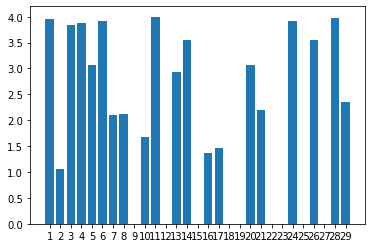

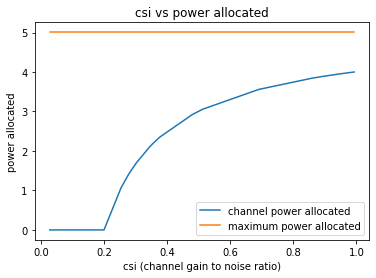

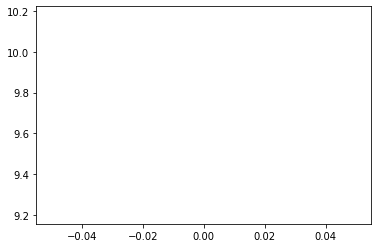

1
Power Allocated= 2.3940486016051628
CSI= 0.42991345074065723
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6984511317702227
CSI= 0.9788116195791722
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4940076631940826
CSI= 0.8156004698590043
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.294538
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.264474

Power Allocated= 2.8289806517258063
CSI= 0.5287878654203538
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.958273895360273
CSI= 0.5675934937606897
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3643785623011384
CSI= 0.7376156458820539
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2

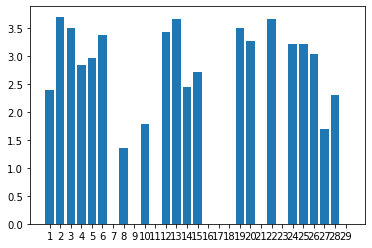

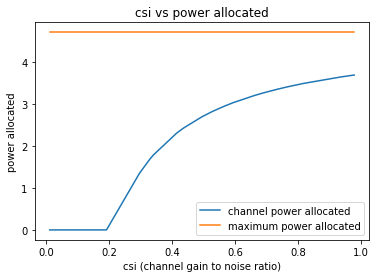

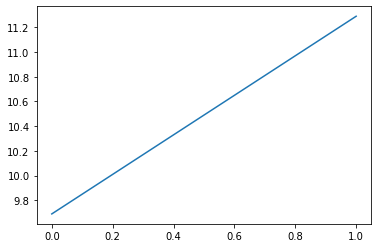

2
Power Allocated= 2.461269457140201
CSI= 0.5261522835198081
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2220659830706343
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7372950132623837
CSI= 0.6155494372511923
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7043743417825694
CSI= 0.6033235081993202
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.311234
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 2.235267

Power Allocated= 3.219606799232133
CSI= 0.8754627165390524
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7224176963473568
CSI= 0.6099635592916833
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.290714
Model clien

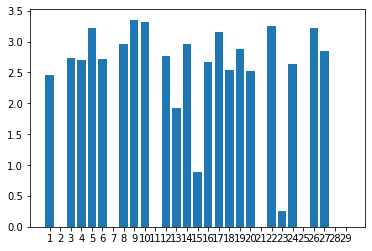

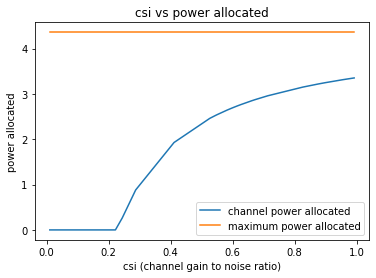

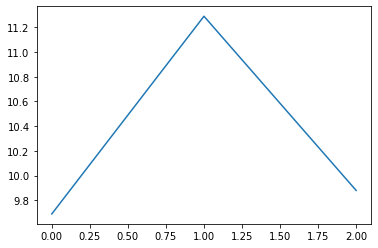

3
Power Allocated= 1.100810440100453
CSI= 0.2997829459213386
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.026720204208178222
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7611408869392258
CSI= 0.37377360050890207
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7938028947700895
CSI= 0.6087337452638346
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.453315954341434
CSI= 0.5042250841955029
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7405280577380355
CSI= 0.589612499252946
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4142495120772214
CSI= 0.24861349994411985


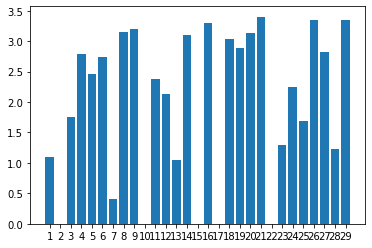

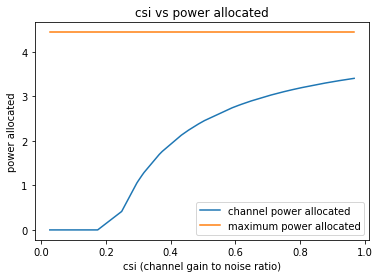

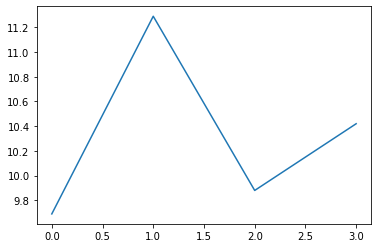

4
Power Allocated= 0
CSI= 0.07816173408985605
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2133530874994487
CSI= 0.27946905034453173
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6954425700489173
CSI= 0.9123053154307118
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5559360893977985
CSI= 0.8093032628108955
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7460935818126453
CSI= 0.9565046163673018
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15864356101710286
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.46111507454735
CSI= 0.7516243911988868
SNR= 7.8319996355

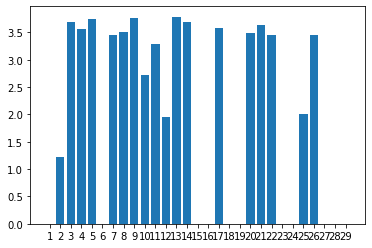

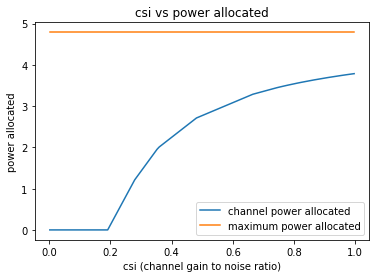

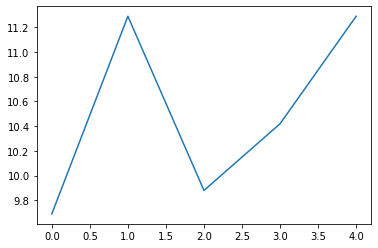

5
Power Allocated= 3.075270928723214
CSI= 0.923588537745058
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4986962758230282
CSI= 0.6026609110572289
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.293108
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 2.222912

Power Allocated= 3.0401322080221314
CSI= 0.8945568408042291
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6460947668293984
CSI= 0.3981035317249797
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7748400224141143
CSI= 0.7229799951204452
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1501573721315936
CSI= 0.498045969959402
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this

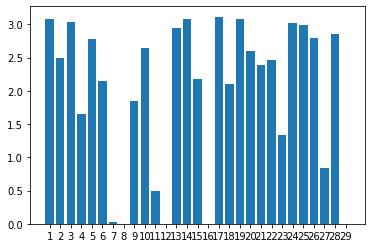

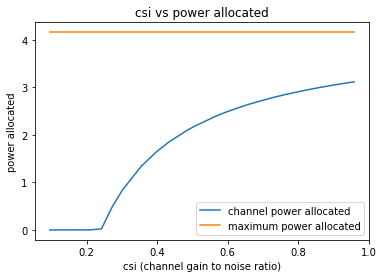

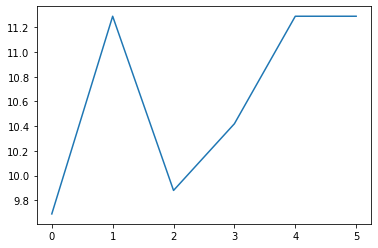

6
Power Allocated= 2.6330733604028573
CSI= 0.5788225210845418
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22718617936796026
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9400636360090413
CSI= 0.7039006603730779
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08722180269757152
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0559883782477969
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.06962689408707323
CSI= 0.2330409270445497
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.359585
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.147787

Power Allocated= 2.5645877338394794
C

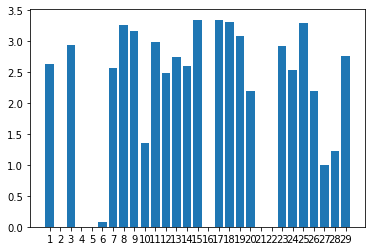

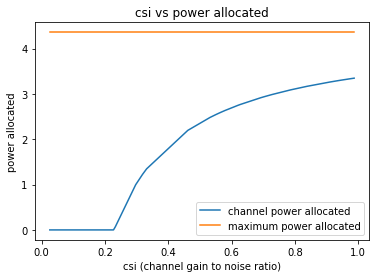

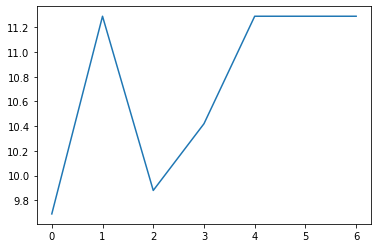

7
Power Allocated= 1.6762449503159225
CSI= 0.3113501063185571
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.329063
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.759726

Power Allocated= 2.137150165611698
CSI= 0.3635156521583739
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.828155528849389
CSI= 0.9434782730196453
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.305434
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.133562

Power Allocated= 3.6775791159917035
CSI= 0.826115675431705
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.363334
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 2.017553

Power Allocated= 0.8096688523606916
CSI= 0.24519452464692715
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.330309
Model client5 Train Epoch: 2 [0/320 (0%)]	L

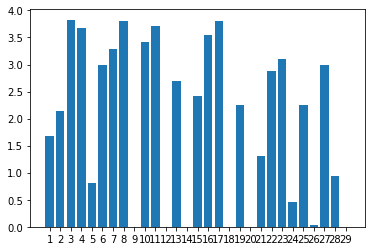

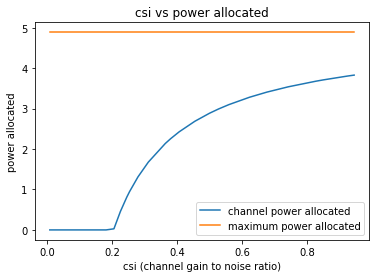

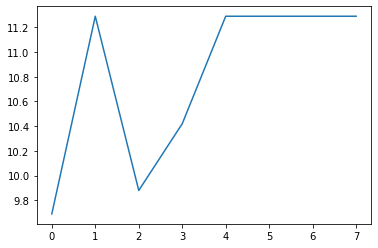

8
Power Allocated= 3.2800691020704593
CSI= 0.8292938930562817
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.066879198170742
CSI= 0.7047042377733793
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.374966
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 2.045005

Power Allocated= 2.6791946431688816
CSI= 0.5534893226735463
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4370309536365093
CSI= 0.9533949326706925
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2814080978303473
CSI= 0.8302157821006566
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.832289680434249
CSI= 0.6047321930928138
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.3

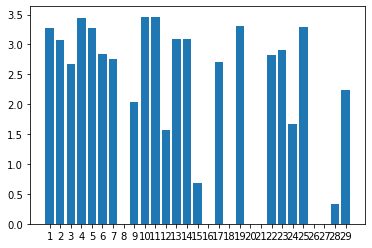

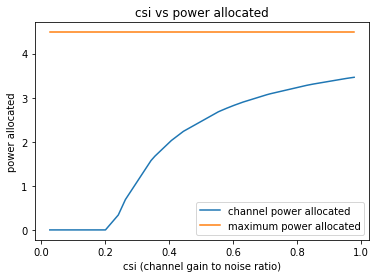

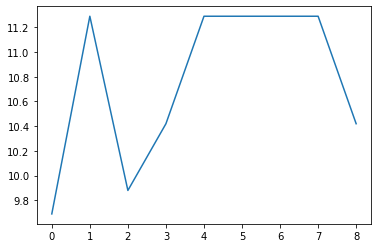

9
Power Allocated= 2.6864074917710954
CSI= 0.5604548974098444
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.225225779856106
CSI= 0.44534570355443837
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2114492073678687
CSI= 0.7941403990056964
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.530007142720188
CSI= 0.3400591077891806
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3129034162677393
CSI= 0.46344164392843257
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.332140
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.176571

Power Allocated= 2.176425443207272
CSI= 0.43587286964821337
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in t

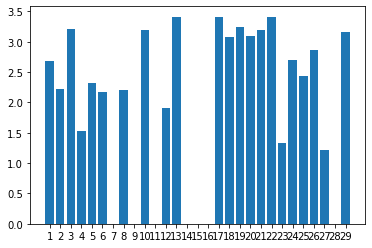

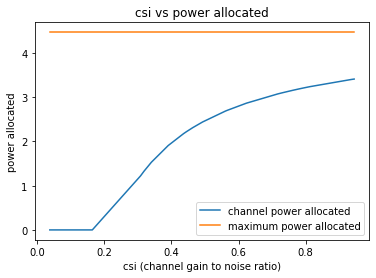

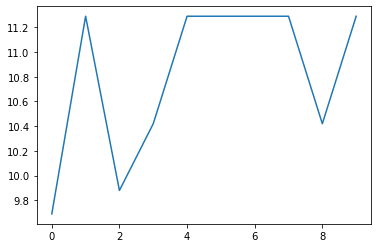

10
Power Allocated= 2.442924031716978
CSI= 0.4338464136918483
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6616085712095585
CSI= 0.920574134956946
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08345334671765514
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.313774448532212
CSI= 0.6972952480964418
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.344818
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.808771

Power Allocated= 2.768736031704419
CSI= 0.5052671170198932
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7748706238212022
CSI= 0.33635870425632575
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power A

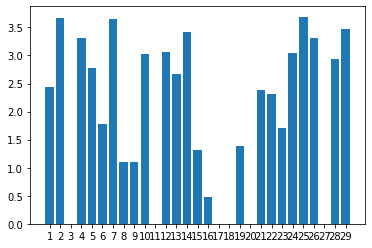

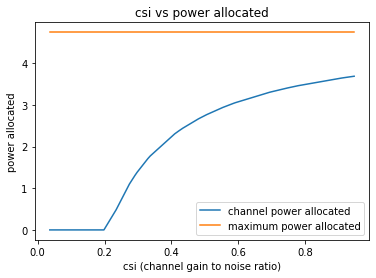

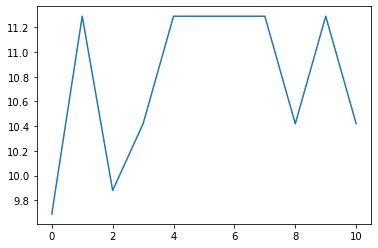

11
Power Allocated= 0
CSI= 0.0002508475677024391
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.019998804318473118
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.11458509381161
CSI= 0.9364732740679382
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.379745592510689
CSI= 0.5547309680999242
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.011550191403678078
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.064695337264232
CSI= 0.8946737379945979
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.055759235246873096
SNR= 7.831999635556276
Client: client7
Poor Ch

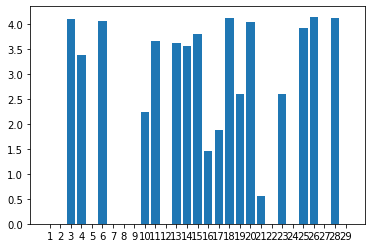

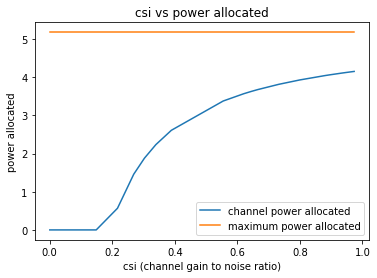

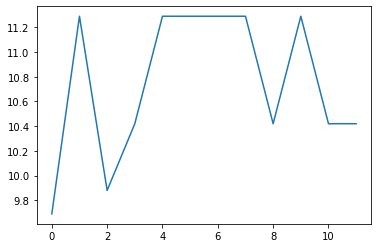

12
Power Allocated= 0
CSI= 0.03839954465009343
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19782508140538468
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7136361402558604
CSI= 0.23542342297341978
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8973099468055583
CSI= 0.9398567800457427
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6326739560790253
CSI= 0.7526561860425026
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5305584993515007
CSI= 0.698937375888461
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.037903671427142904
SNR= 7.831999635556276
Client:

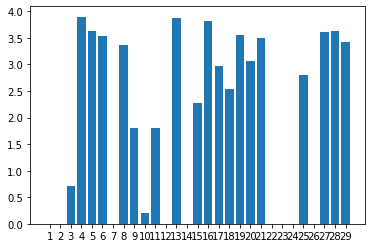

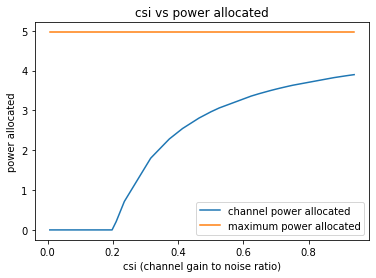

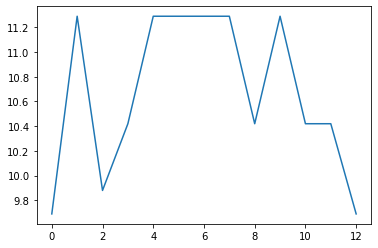

13
Power Allocated= 3.135355619887088
CSI= 0.5284584195216926
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.345766
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 2.019956

Power Allocated= 3.5680617549434777
CSI= 0.6851237490386157
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.585272652698047
CSI= 0.6932988481268262
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.08865870775651175
CSI= 0.20247040708916453
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.155211
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.426462

Power Allocated= 3.8341723385408875
CSI= 0.8378860233952315
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9795152595894923
CSI= 0.9540739093870119
SNR= 7.275378717720197
Client: c

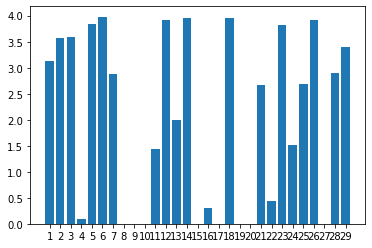

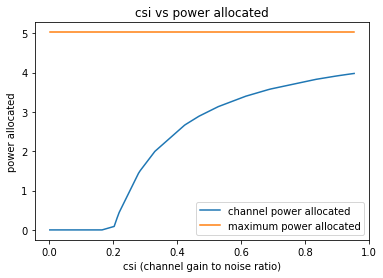

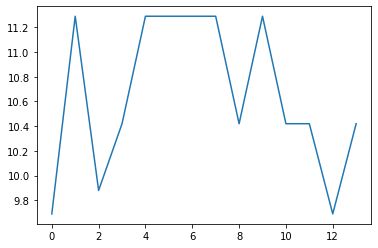

14
Power Allocated= 2.8741755117442374
CSI= 0.7390535943319707
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.974334191151943
CSI= 0.7981335396393623
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.323120
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.792023

Power Allocated= 2.279243609447754
CSI= 0.5133434002010434
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339360
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 2.060222

Power Allocated= 2.402521906132745
CSI= 0.5480246467432196
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.353153
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.499324

Power Allocated= 0
CSI= 0.17273084421668872
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8580590823208167
CSI= 0.7303544122433

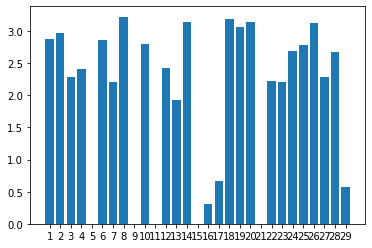

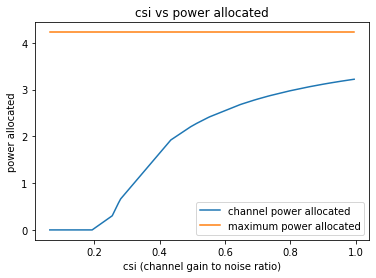

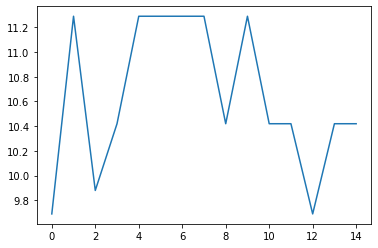

15
Power Allocated= 1.0310222319422628
CSI= 0.29991617307347973
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.423886
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.665496

Power Allocated= 2.5234449372036325
CSI= 0.5429346479378223
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.253098
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.308537

Power Allocated= 2.7222631258189183
CSI= 0.6086337953679308
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3000049160317366
CSI= 0.48419530365394325
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.093793460573936
CSI= 0.786476520298439
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04299069866412397
SNR= 7.275378717720197
Client: client6
Poor Chan

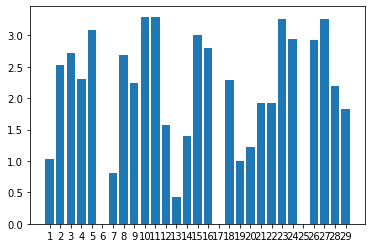

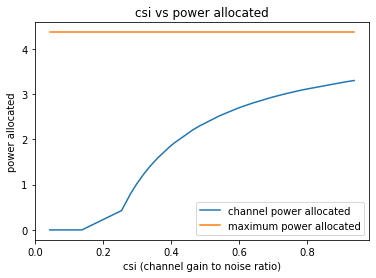

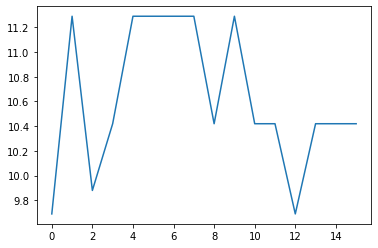

16
Power Allocated= 0
CSI= 0.202870725755516
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6118733069086324
CSI= 0.5232952639832484
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.245510
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.660183

Power Allocated= 0.8675011776383998
CSI= 0.27357242503642076
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1380616556685133
CSI= 0.4193261223791981
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.437682
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.253347

Power Allocated= 3.4998945284844476
CSI= 0.9775688849695671
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3136540168321393
CSI= 0.3116054657270999
SNR= 7.275378717720197
Client: client6
Poor Chann

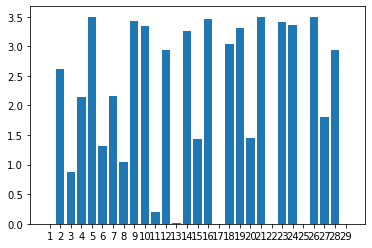

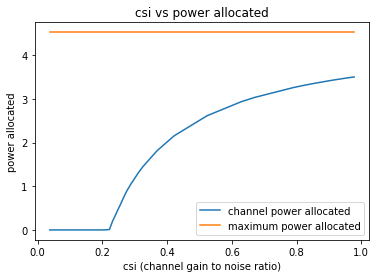

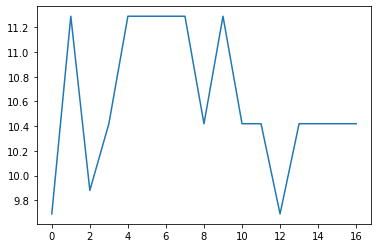

17
Power Allocated= 1.9035769141456163
CSI= 0.4124259086881725
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.744629819589162
CSI= 0.631462614118394
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.305207
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.578549

Power Allocated= 0.7496212035474947
CSI= 0.2794362596040334
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.313004
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.845370

Power Allocated= 2.42215086944737
CSI= 0.524630351459171
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9051528809289011
CSI= 0.4126941473102307
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6341965071185163
CSI= 0.3711872103720869
SNR= 7.275378717720197
Client: client

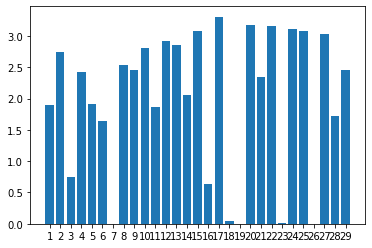

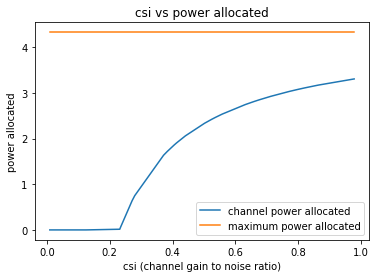

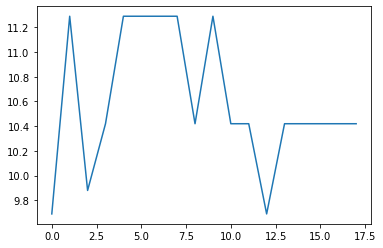

18
Power Allocated= 3.38290040685209
CSI= 0.939924117608932
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.500093
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.926984

Power Allocated= 2.3833658207814272
CSI= 0.4846252027079222
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.264416548687983
CSI= 0.8457378185483488
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.245264
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.323370

Power Allocated= 3.3737942140197363
CSI= 0.9319474579185897
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.575416
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.089903

Power Allocated= 1.2974467594540715
CSI= 0.31752389075979404
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9266380336215176
CSI=

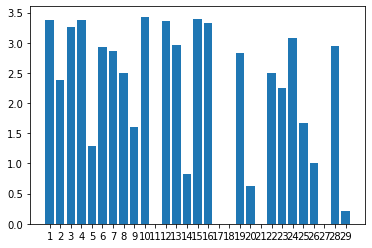

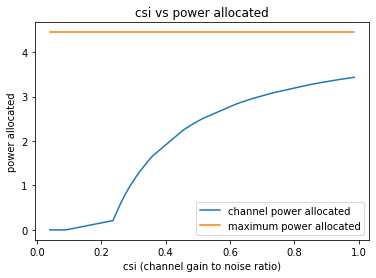

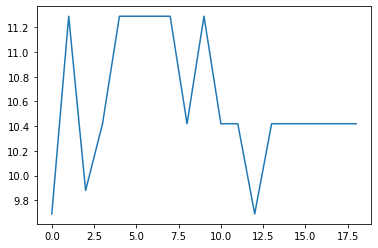

19
Power Allocated= 3.295847812104462
CSI= 0.7531321550389597
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9271784294580314
CSI= 0.5894635982823643
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1792680585533165
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05377844551851352
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0914401006545824
CSI= 0.6526580462475247
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.517361894662137
CSI= 0.4747720082918605
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6051492818625803
CSI= 0.9818488109038023
SNR= 7.83199963555

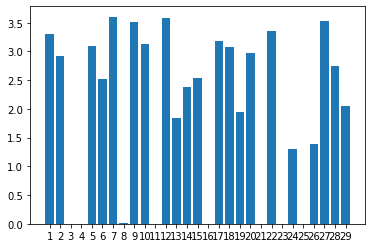

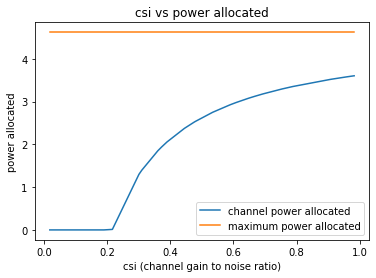

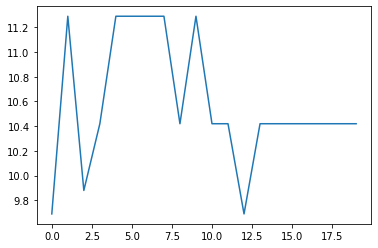

20
Power Allocated= 3.5169160958077548
CSI= 0.9564399169982564
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9234753788658252
CSI= 0.37893361039501683
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341337
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.400838

Power Allocated= 1.6923696814209106
CSI= 0.3484210814497417
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.391900127929142
CSI= 0.8542919989137968
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.458409
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.724976

Power Allocated= 1.6230056116881588
CSI= 0.34019918025578944
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.358907
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 2.059801

Power Allocated= 2.8068249526401168


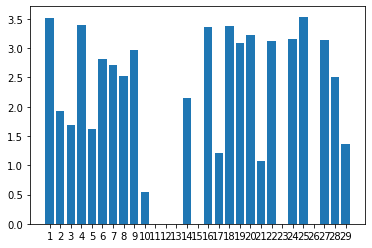

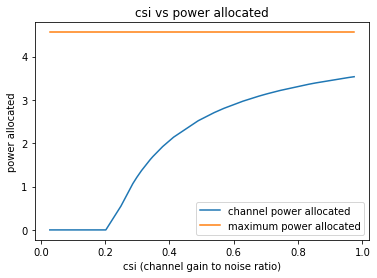

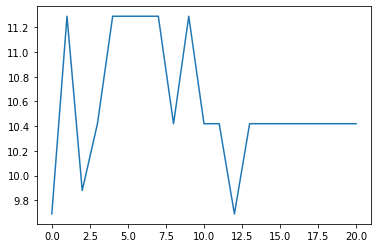

21
Power Allocated= 1.0733634035837727
CSI= 0.3246594638848854
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0940484325894095
CSI= 0.9438722228267143
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5463705103397127
CSI= 0.6222220266078067
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.293383218696915
CSI= 0.5375966456056039
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.313894
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.610675

Power Allocated= 0.7593420160739073
CSI= 0.29462267741009074
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.293326
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.887356

Power Allocated= 3.1458330133851433
CSI= 0.9923776865657665
SNR= 7.275378717720197
Client: c

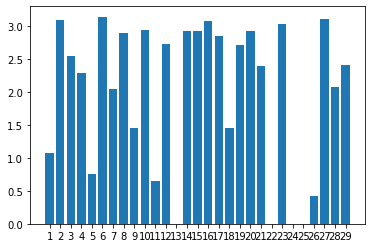

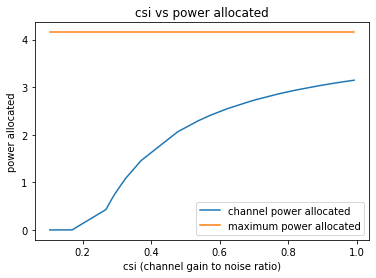

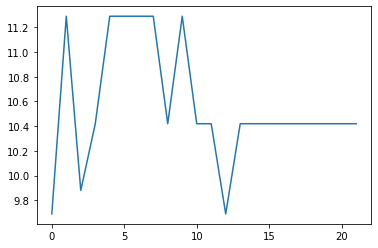

22
Power Allocated= 3.3824032479471953
CSI= 0.7709779624427308
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.428889136347427
CSI= 0.30763853752881987
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.052274722740496715
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5502862123663754
CSI= 0.8856054805128077
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0725484465894075
CSI= 0.3835960906669442
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6029463675951425
CSI= 0.48157707274973016
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.868382712870499
CSI= 0.552158410110348

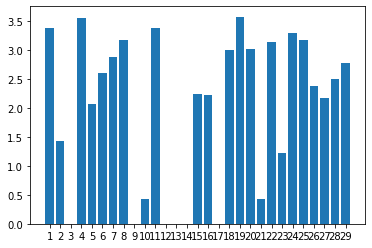

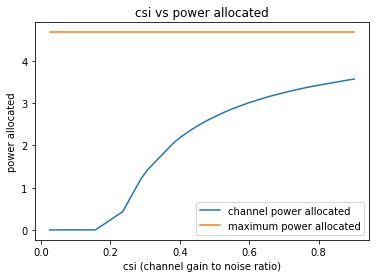

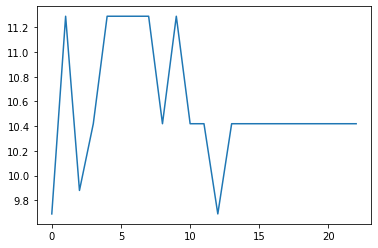

23
Power Allocated= 2.679455340757963
CSI= 0.6084352014262204
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7235504494303964
CSI= 0.2778190426764151
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2006642081028
CSI= 0.8909864470640682
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.266292
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.396692

Power Allocated= 2.1304362149553615
CSI= 0.4560838001555988
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3706367603314717
CSI= 0.33870990422185
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.404718
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.856875

Power Allocated= 1.1125240770142533
CSI= 0.31147877219066067
SNR= 7.275378717720197
Client: client

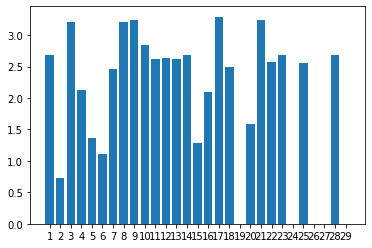

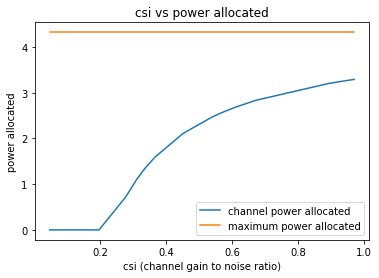

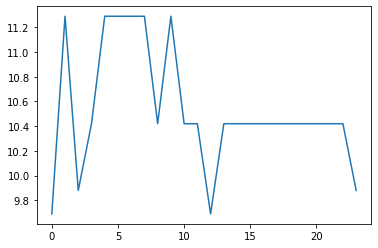

24
Power Allocated= 2.4012879975068677
CSI= 0.49515282708744557
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.304818
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.622760

Power Allocated= 3.319585833175638
CSI= 0.9080337459442455
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.397017
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.219959

Power Allocated= 2.1846845061159508
CSI= 0.44719079541908635
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2023660052573183
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05814061274659954
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.160892081429087
CSI= 0.7936669136536024
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch:

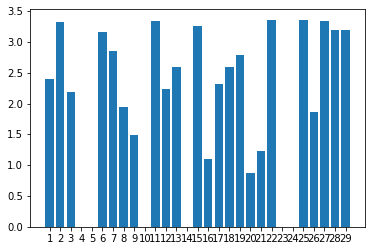

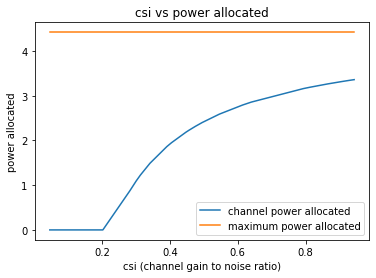

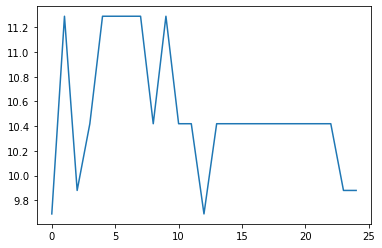

25
Power Allocated= 3.0013357045086133
CSI= 0.6483122765334376
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17269858716628272
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5365621384752437
CSI= 0.49819649996130144
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1041357197738697
CSI= 0.6946052967242455
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.458838
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.955897

Power Allocated= 3.195013917506264
CSI= 0.7414061740795314
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0708803092481548
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.12

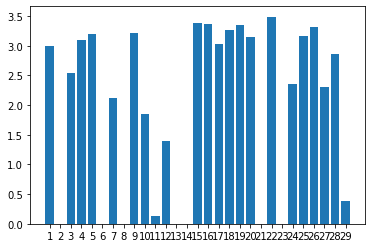

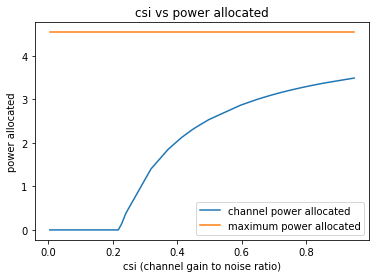

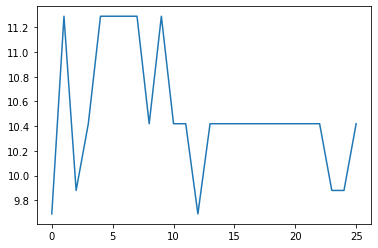

26
Power Allocated= 2.8082122816904875
CSI= 0.777734447715436
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5807668125110768
CSI= 0.39789412368424004
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.429044
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.961595

Power Allocated= 0
CSI= 0.1919464176483543
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5245254948712286
CSI= 0.38918490884637846
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8771446576308524
CSI= 0.8217915848522327
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.016250920841806
CSI= 0.9278613090462121
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power

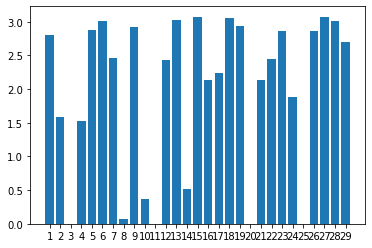

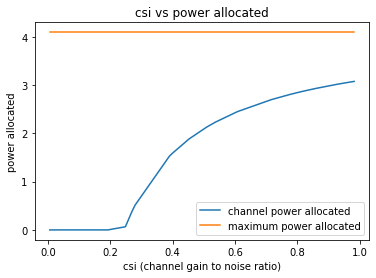

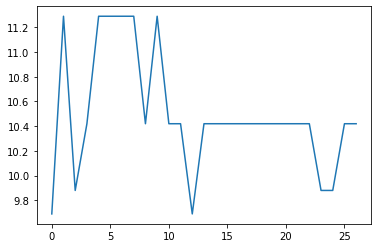

27
Power Allocated= 3.101368257872081
CSI= 0.72499493773391
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09388428410026195
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4403194709859077
CSI= 0.32890747078423643
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5983426736072985
CSI= 0.53125208314237
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.133322844718748
CSI= 0.7421891701896685
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8101816771252057
CSI= 0.27244195987204556
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.424157
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.452348

Power Al

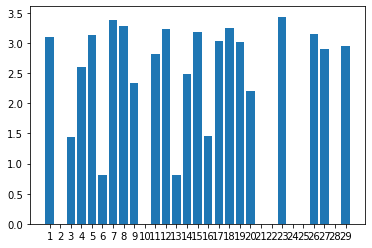

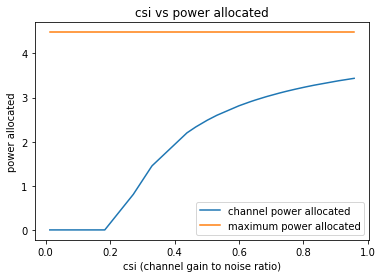

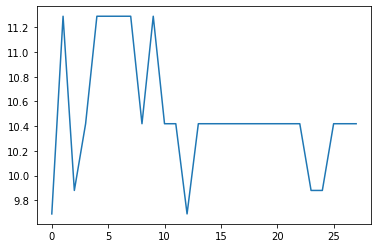

28
Power Allocated= 2.161992304906665
CSI= 0.37481368398626647
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.386153
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.358494

Power Allocated= 0
CSI= 0.15965405332408344
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1294580015817006
CSI= 0.5880531559058387
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13044833286664248
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6520159791234241
CSI= 0.3146664227697207
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.709602408100854
CSI= 0.8925526103225762
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.98

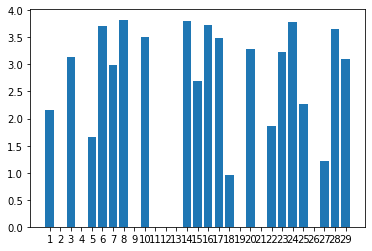

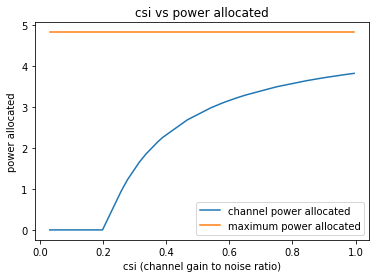

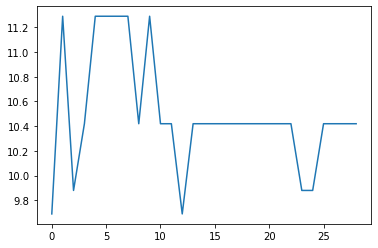

29
Power Allocated= 3.160858740500145
CSI= 0.6692538638924557
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.363947946009898
CSI= 0.7745260823568733
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.474343
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.248092

Power Allocated= 3.5580276824796093
CSI= 0.9115501322988293
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2411610540820797
CSI= 0.7072640992691841
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4303304069719878
CSI= 0.310103515833259
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.495152
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.829772

Power Allocated= 3.4657862019606744
CSI= 0.8408492303243578
SNR= 7.275378717720197
Client: clie

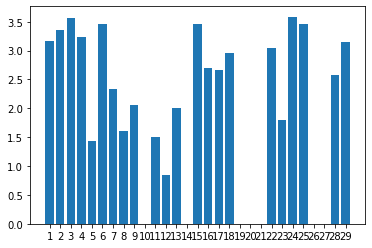

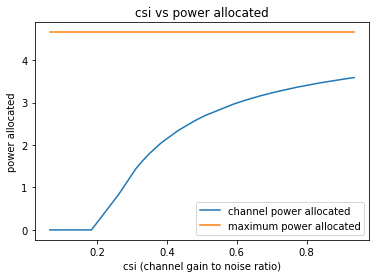

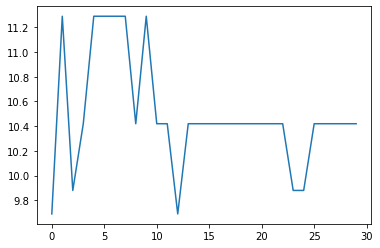

30
Power Allocated= 2.608637289269905
CSI= 0.6137344618716126
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8185888406936237
CSI= 0.704514301669577
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.412463473653422
CSI= 0.547782231075926
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6037199300333214
CSI= 0.6118878133168948
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9581395925696876
CSI= 0.7813312772532799
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.05147992786369748
CSI= 0.23886149930694622
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.489868
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 

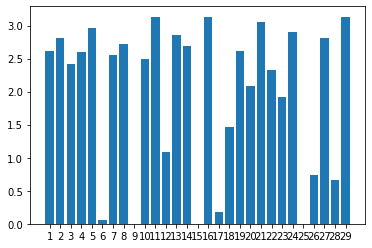

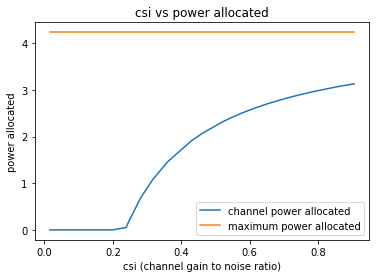

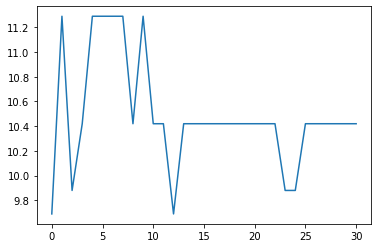

31
Power Allocated= 2.827888286670474
CSI= 0.5830603687144827
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.650844
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.361403

Power Allocated= 3.029108671425809
CSI= 0.6605596226124624
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.45945566169478
CSI= 0.9229171335663476
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.288077
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.535724

Power Allocated= 0
CSI= 0.1959797479071662
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.006750497725982574
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3215587472697585
CSI= 0.8187206630010887
SNR= 7.275378717720197
Client: client6
Poor Channel, client not take

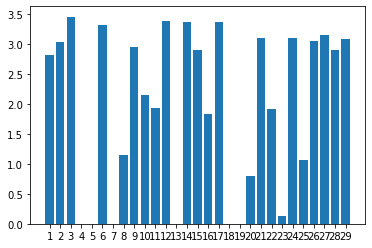

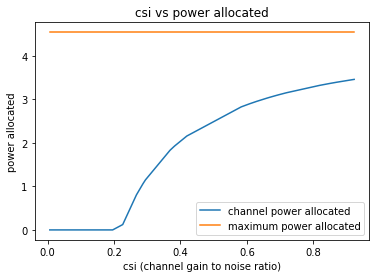

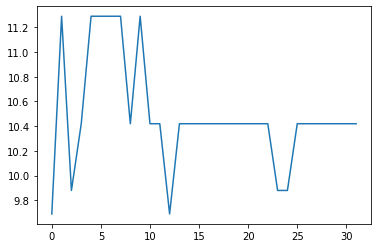

32
Power Allocated= 0
CSI= 0.2116520626449313
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6198119308673764
CSI= 0.9121762435181584
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.527789173612476
CSI= 0.8415368236957543
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2115572503745566
CSI= 0.6646576047275552
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.010265747174331
CSI= 0.5862264146971642
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2575644964672694
CSI= 0.6856233256454436
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1651986523622124
CSI= 0.6447899532235966
SN

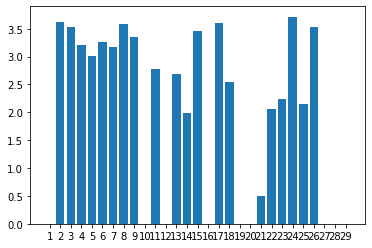

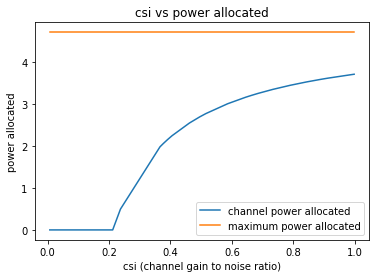

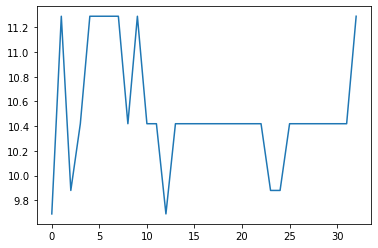

33
Power Allocated= 3.394539232239497
CSI= 0.9316740619943171
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6371504469244527
CSI= 0.26104715504043696
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.83533913872076
CSI= 0.379861731637846
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.376599
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.640369

Power Allocated= 3.357242816078836
CSI= 0.9003873105009179
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8028684957338985
CSI= 0.6005979038512516
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19340969294219168
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

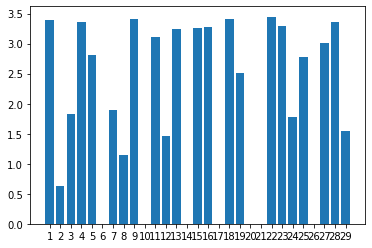

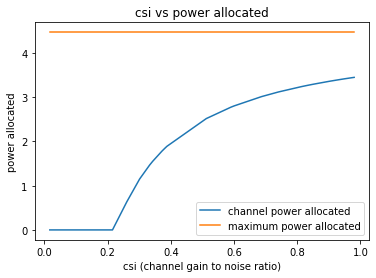

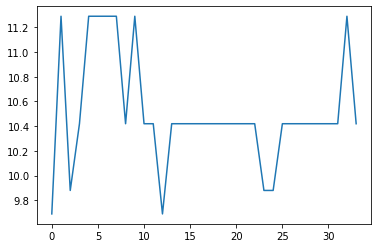

34
Power Allocated= 2.8818776004204594
CSI= 0.8518393178284147
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8712578923742536
CSI= 0.8442024222393472
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.424998
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.034398

Power Allocated= 0
CSI= 0.11579669603425358
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.834954938162981
CSI= 0.8190994471781218
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9629972646166447
CSI= 0.9150716072141316
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8227582018071997
CSI= 0.8109973083236949
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power

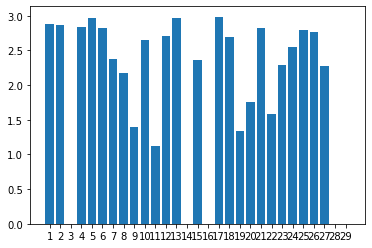

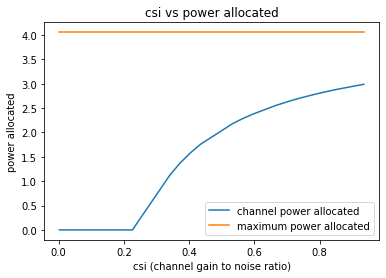

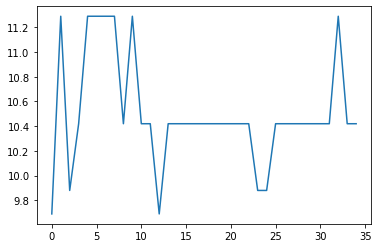

35
Power Allocated= 2.5564615331043017
CSI= 0.469868084441726
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3834936911225166
CSI= 0.30291787852038077
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.389478
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.000025

Power Allocated= 0.3617274388861107
CSI= 0.23132132308261477
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.678312
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.232743

Power Allocated= 3.677672851952291
CSI= 0.9930036966607867
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.502435
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.027271

Power Allocated= 1.7748126555858423
CSI= 0.34365373699107904
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4851301641522237


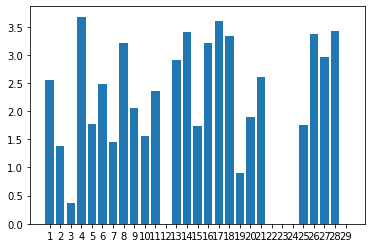

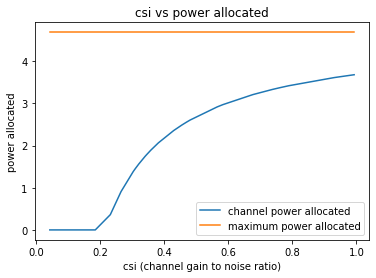

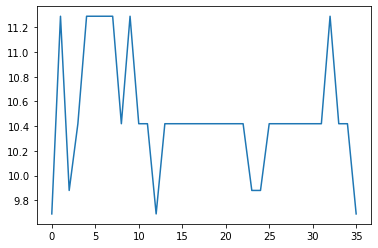

36
Power Allocated= 1.4567299255900727
CSI= 0.3924529967984608
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.254385
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.305037

Power Allocated= 1.2434700212292031
CSI= 0.36214357546352827
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7486473265000093
CSI= 0.7960779212413877
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.491066
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.464796

Power Allocated= 2.041593468327884
CSI= 0.5093692621611678
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18041309889386103
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2381687260705099
CSI= 0.36144965358110936
SNR= 7.275378717720197
Client: client6
Model cl

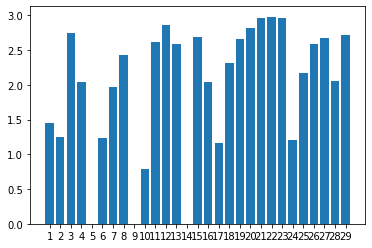

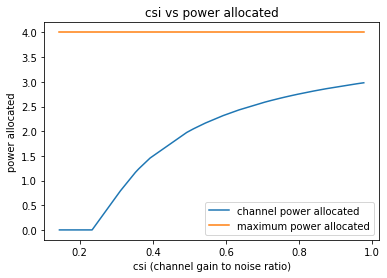

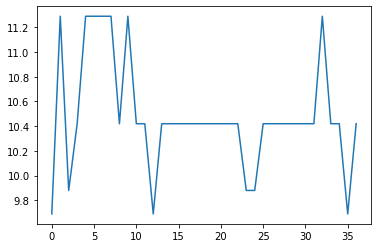

37
Power Allocated= 2.214852862958425
CSI= 0.46026709239935937
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.167127047192571
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.913678375342936
CSI= 0.6785061409882126
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6445232879020497
CSI= 0.26716672443420275
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.971558976500881
CSI= 0.7062419159867066
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2111082143396295
CSI= 0.31482219014372215
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7867937349573815
CSI= 0.6247225245915393
S

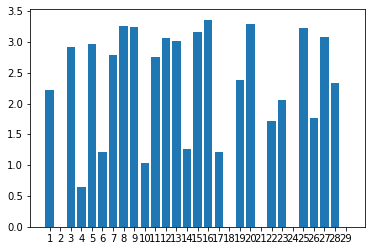

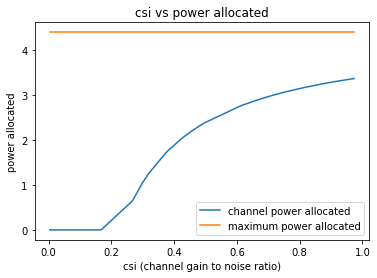

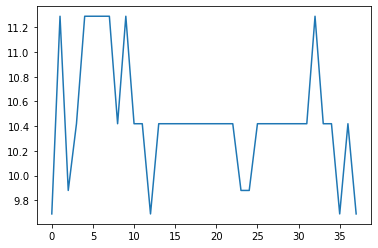

38
Power Allocated= 0
CSI= 0.14390388002744703
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.014431091567928322
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.690833425438158
CSI= 0.8664551595706057
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06900727168329002
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6545211159485205
CSI= 0.45652925586875925
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2201419691518725
CSI= 0.6154530646888393
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7077239560321944
CSI= 0.8793239667961588
SNR= 7.831999635556276
Client:

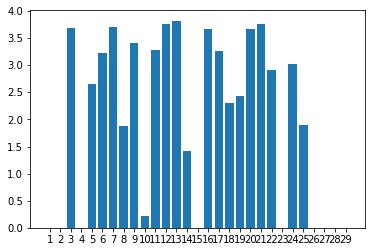

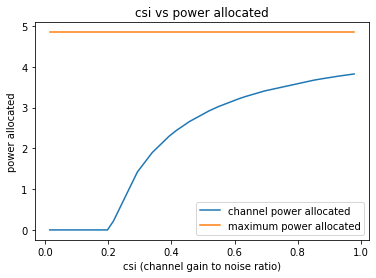

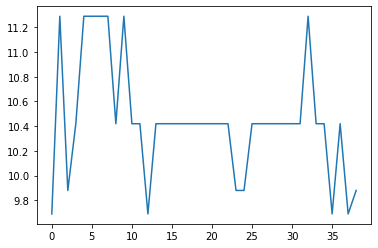

39
Power Allocated= 3.559637495917733
CSI= 0.91288973010669
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.64544030706947
CSI= 0.49760657625949667
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.394748925262703
CSI= 0.7934548701141008
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9351224966029141
CSI= 0.36765549953524923
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.377019
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.983867

Power Allocated= 0
CSI= 0.021286717576194825
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09476733330162246
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3971

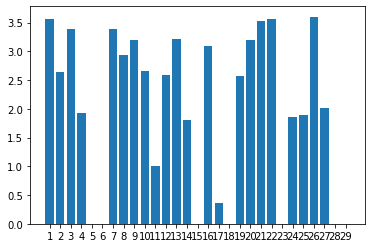

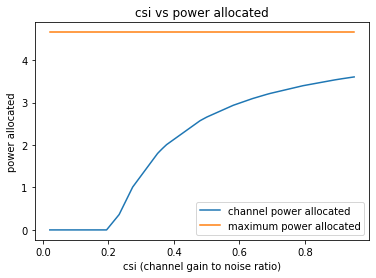

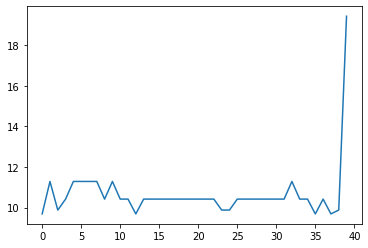

40
Power Allocated= 2.6006631872964254
CSI= 0.6210340266382348
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2753385557868802
CSI= 0.3406525531552008
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.64327568223755
CSI= 0.6379157062496298
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1957955147835282
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05064377479779403
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.047791666287976
CSI= 0.8597792473792162
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8332561592863934
CSI= 0.7258870711472922
SNR= 7.831999635556

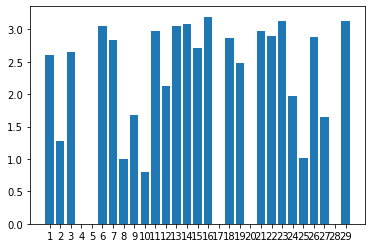

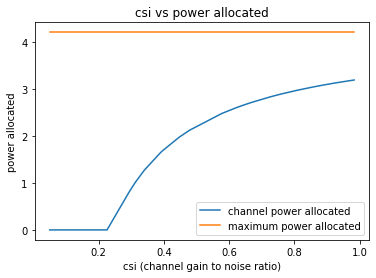

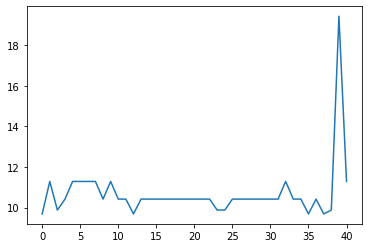

41
Power Allocated= 0.7240459442635956
CSI= 0.27184807966484936
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20886750039949742
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.794198385071113
CSI= 0.6217464333799354
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3339741355008865
CSI= 0.24578497412033673
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.388086549081182
CSI= 0.9857222543136275
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06236228282427725
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.384852764847352
CSI= 0.9825901371353674
SNR= 7.831999635

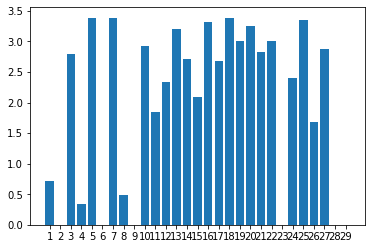

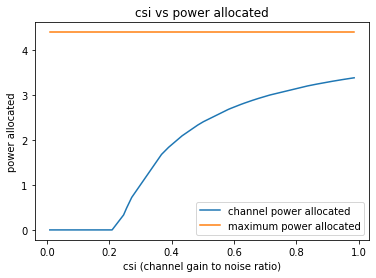

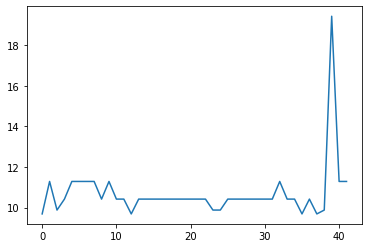

42
Power Allocated= 2.786875944508939
CSI= 0.6292835916066883
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9486997644329604
CSI= 0.41198296416417746
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.748245
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.940830

Power Allocated= 0
CSI= 0.01162740630343606
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.35087045652597
CSI= 0.9755011280905139
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9113811557833635
CSI= 0.6827786772691458
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1777060028342436
CSI= 0.8345304716759582
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power 

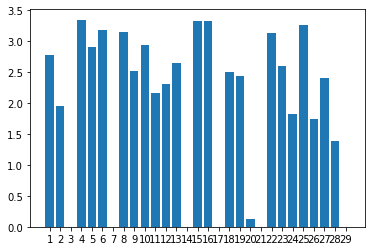

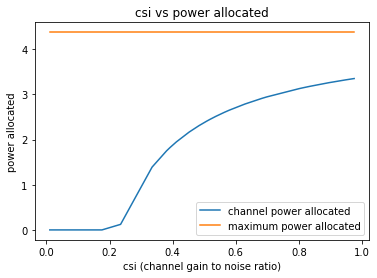

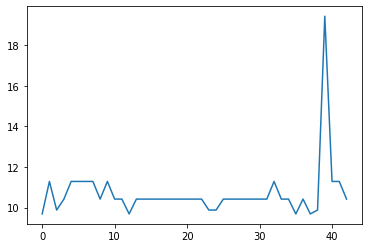

43
Power Allocated= 2.3084707145003387
CSI= 0.39908972254286956
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.572645672452529
CSI= 0.8054595643182026
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.270915893566832
CSI= 0.2822262091355012
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.322737
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.267563

Power Allocated= 1.450233782046678
CSI= 0.2972705383411829
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.526121764673194
CSI= 0.7763666776054227
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7719580104520873
CSI= 0.3287078750379574
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in thi

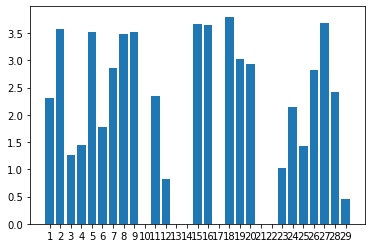

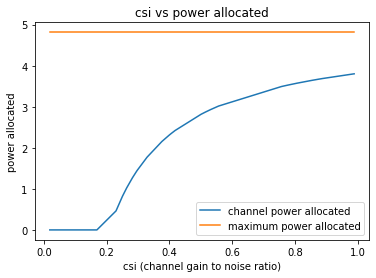

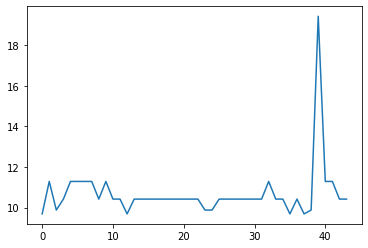

44
Power Allocated= 3.0180861767182146
CSI= 0.9036315650118452
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.03602140054375
CSI= 0.9185178313747829
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.869651771554575
CSI= 0.7967618826633293
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.399837
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.208648

Power Allocated= 3.058354945312412
CSI= 0.9377547055057557
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0186518000150904
CSI= 0.9040936609020696
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.867328
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.544945

Power Allocated= 3.1010292724318385
CSI= 0.9768461860577009
SNR= 7.275378717720197
Client: clien

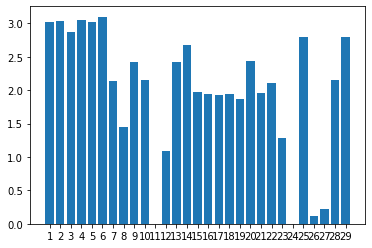

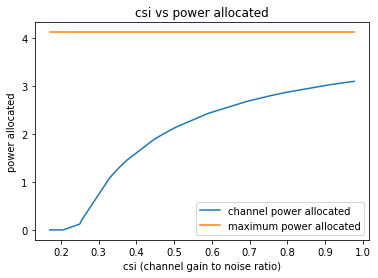

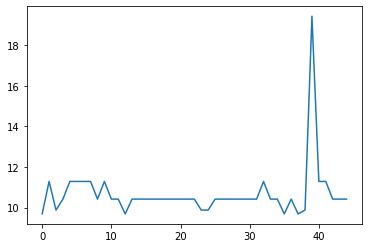

45
Power Allocated= 2.069140907852002
CSI= 0.34359032940301537
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3105956118488185
CSI= 0.2725547137575688
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.010750191024743838
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6484071531230695
CSI= 0.751215154170222
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.624935
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.714738

Power Allocated= 0
CSI= 0.156762632371522
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8930720633589955
CSI= 0.9203766991679668
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.227

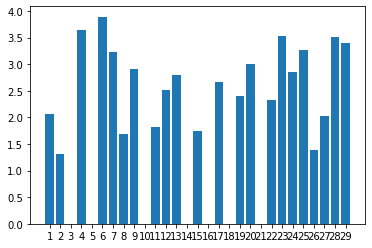

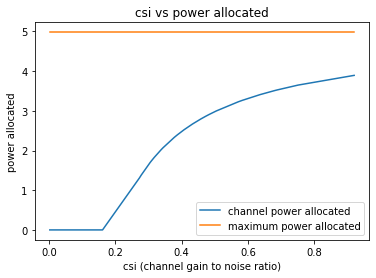

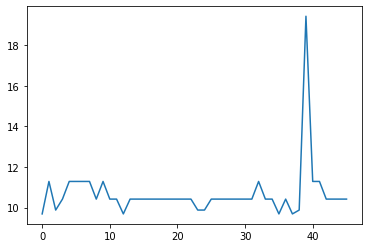

46
Power Allocated= 1.541613906031416
CSI= 0.32141110334471723
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.000298367744737682
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07418535778370161
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3189557961273133
CSI= 0.7496598583299249
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6368945973617794
CSI= 0.9842524501977952
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0198907137545308
CSI= 0.37979442228379756
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.538598
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.219484

Power Allocated= 1

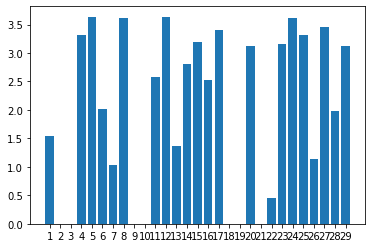

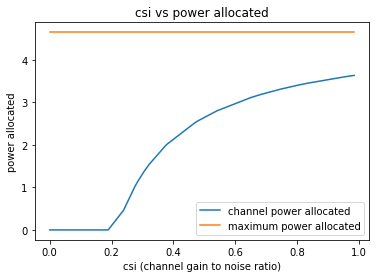

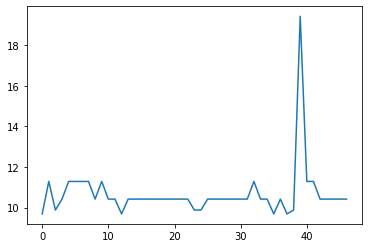

47
Power Allocated= 2.7836837956955454
CSI= 0.4729395065613352
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4583591936120275
CSI= 0.6945602389010082
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.453506455843518
CSI= 0.6922270745987824
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.199313
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.208157

Power Allocated= 3.306569479792844
CSI= 0.6283184472031296
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.833695
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.658123

Power Allocated= 0.8484334130375135
CSI= 0.24693274288503875
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.518032
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.377743

Power Allocated= 2.813083379411549
CSI

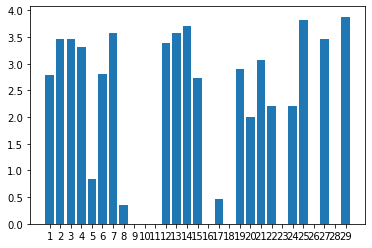

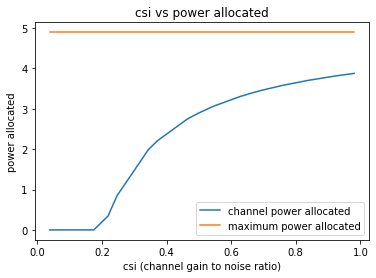

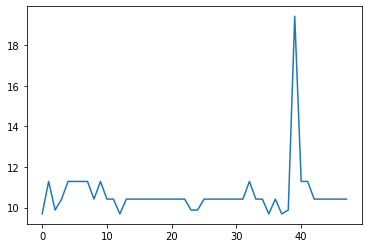

48
Power Allocated= 2.0055479593631858
CSI= 0.4083641096015366
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6512665261661965
CSI= 0.5546076515101773
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.406768846066038
CSI= 0.9545863757009425
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15981173509792967
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9020923806841035
CSI= 0.6442258728065858
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2543073271676333
CSI= 0.4545380874659797
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4893569062328549
CSI= 0.25220769513008867

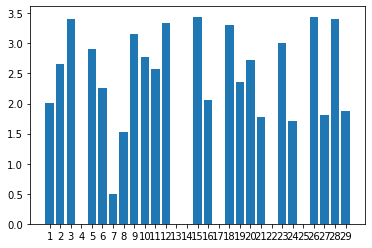

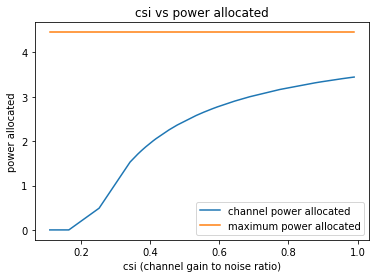

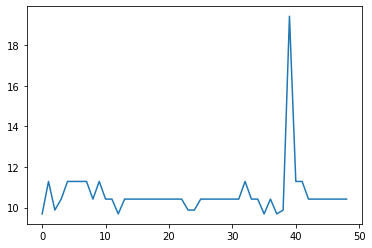

49
Power Allocated= 0.27355352714143333
CSI= 0.2311011826453987
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.774970
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.575920

Power Allocated= 0.4885337401791858
CSI= 0.2431830469146803
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.164677
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.795473

Power Allocated= 3.3306256190561285
CSI= 0.7873787120882516
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.369579
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.136371

Power Allocated= 0.28535318139598775
CSI= 0.23173309888931315
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 6.872994
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.649640

Power Allocated= 0
CSI= 0.026375743266595197
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this r

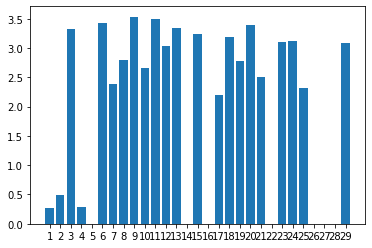

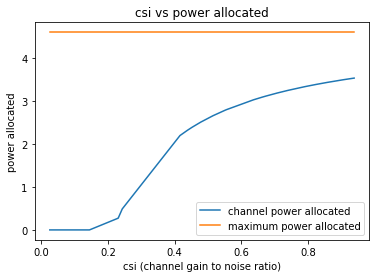

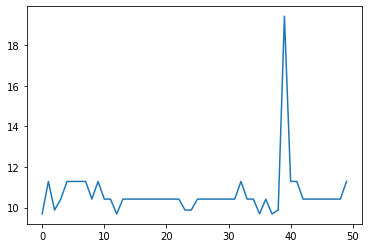

50
Power Allocated= 3.4757887958167073
CSI= 0.9709364999851758
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3274952502231416
CSI= 0.84873287195372
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8556449636516583
CSI= 0.3773474828945228
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8844436575444403
CSI= 0.6167971340614938
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.015939937097008028
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7138620452141149
CSI= 0.2637228013260521
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.174132
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.080275

Power

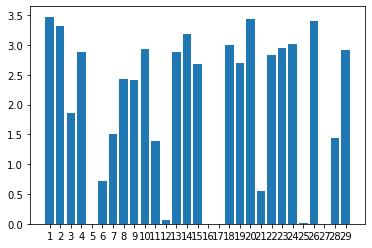

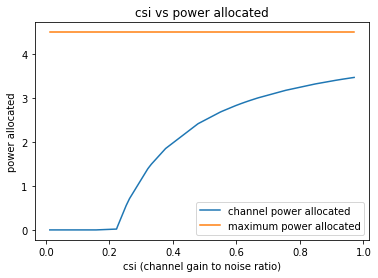

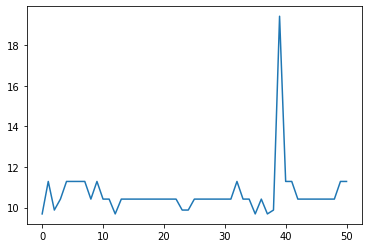

51
Power Allocated= 0.5711079104434935
CSI= 0.2397290915275544
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 3.436785
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.183803

Power Allocated= 2.711850152718124
CSI= 0.49245727531907446
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.735538996515188
CSI= 0.4982699649093909
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8985365718371763
CSI= 0.5423150562764829
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2973501506535663
CSI= 0.40897570580656606
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.030919
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.128503

Power Allocated= 0.4464365003507087
CSI= 0.23277214570743454
SNR= 7.275378717720197
Client: 

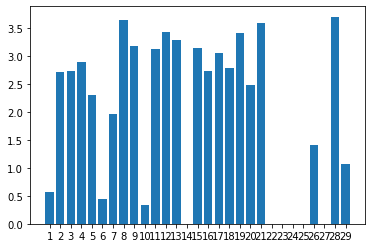

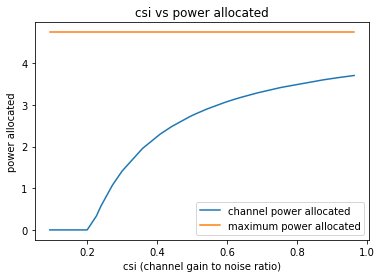

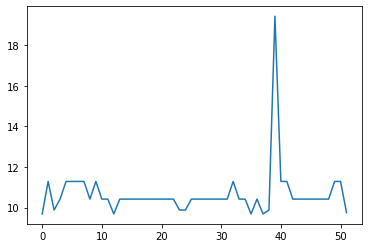

52
Power Allocated= 2.3539257820925457
CSI= 0.4353055415065925
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6223556630211933
CSI= 0.9719994866852278
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.013902838932312145
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4473229900145954
CSI= 0.8306753103131147
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5930764912816708
CSI= 0.32700189010063185
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.057923
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.198321

Power Allocated= 2.6879018923701596
CSI= 0.5093566529296766
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Po

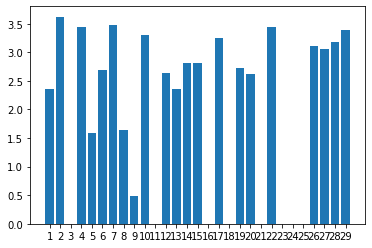

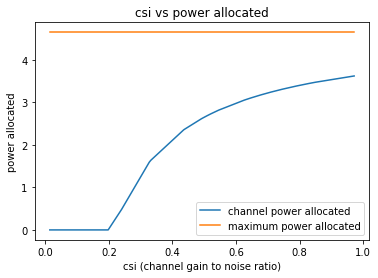

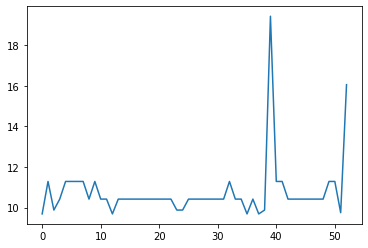

53
Power Allocated= 0
CSI= 0.08415401503245357
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2104498060027884
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7914504947066137
CSI= 0.38274995500132125
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1752141681600303
CSI= 0.8137305042696945
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13484143258682857
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6609633748324377
CSI= 0.5736711721502444
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.349811
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.152461

Power Allocated= 0
CSI= 0.1116110305

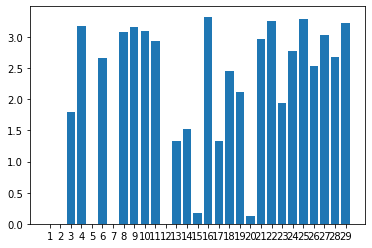

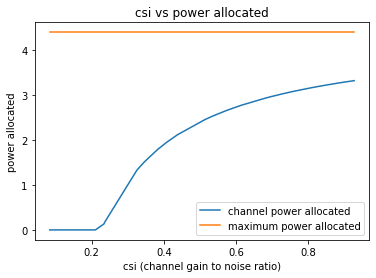

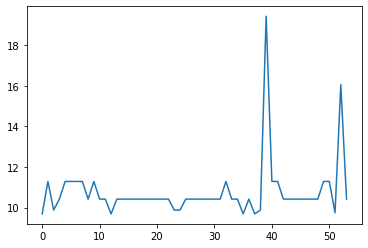

54
Power Allocated= 3.3804509848239306
CSI= 0.965866394321047
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.022485333609242764
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5612203246001206
CSI= 0.5392083916574153
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.94837889618906
CSI= 0.6814718832279586
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2225081011372929
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1141526169226561
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5018355154172194
CSI= 0.2554960161472174
SNR= 7.831999635556276
Client: clie

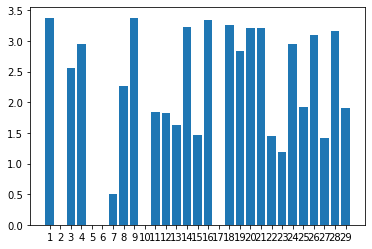

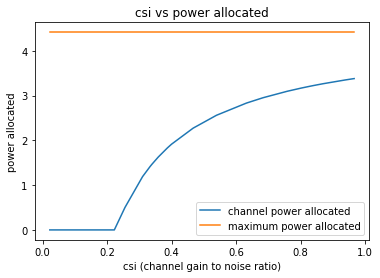

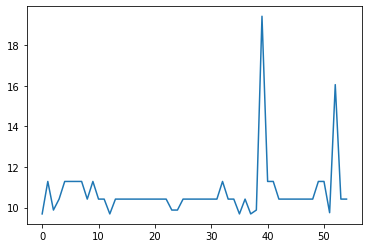

55
Power Allocated= 2.5987556466999564
CSI= 0.6588370715282068
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.530091
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.126441

Power Allocated= 2.440423250809471
CSI= 0.5966023473036408
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.43727774089245974
CSI= 0.27179054539530656
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.341646
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.267652

Power Allocated= 2.010098965182992
CSI= 0.4747250169127031
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.659021
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.593463

Power Allocated= 2.703168289618915
CSI= 0.7075071384089846
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.597024856065019
CSI

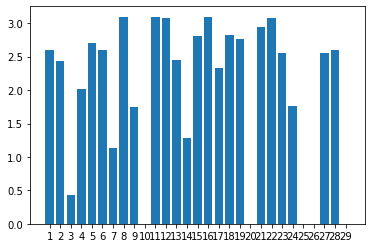

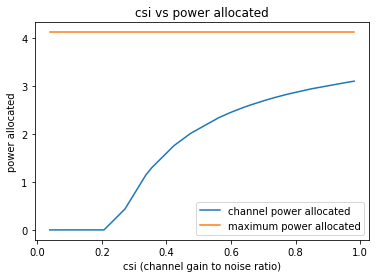

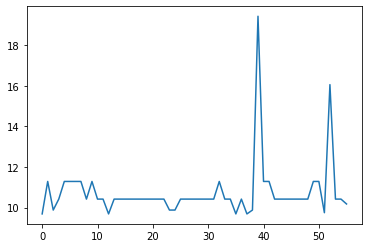

56
Power Allocated= 0
CSI= 0.13648010866476512
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3137429439230548
CSI= 0.27638080374367036
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.853915304636076
CSI= 0.9276231895960768
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16952510252345165
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.322211823124829
CSI= 0.2169325666985641
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030581495691898275
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.789778067138518
CSI= 0.8755331778615828
SNR= 7.831999635556276
Client: c

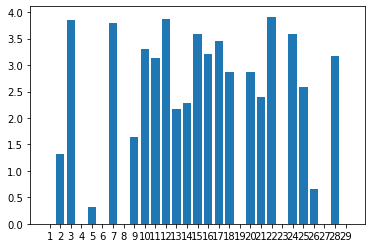

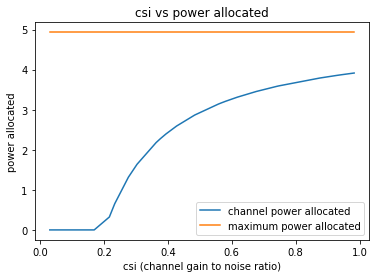

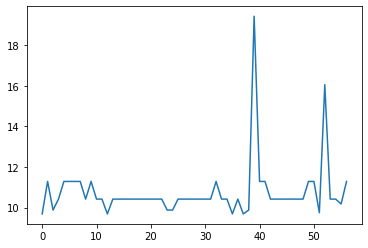

57
Power Allocated= 1.4646372178740394
CSI= 0.3865633196914394
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8629532333377115
CSI= 0.45691679066684265
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8909820874082266
CSI= 0.8616578621935873
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9444954151908536
CSI= 0.9033096315534173
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5527500413465116
CSI= 0.6672068860140498
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1318149106022518
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.502371815635014
CSI= 0.6455095671667781


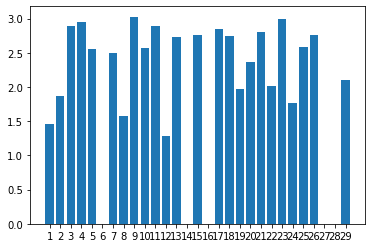

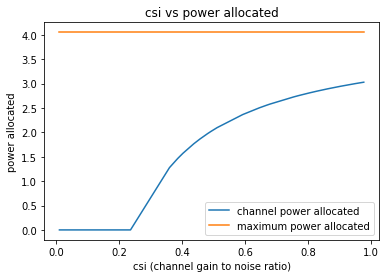

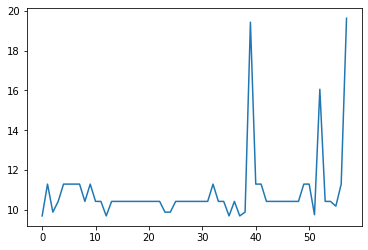

58
Power Allocated= 2.8865517324651204
CSI= 0.7480674011676494
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9528513215613152
CSI= 0.787105107912539
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.555327
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.942537

Power Allocated= 1.9626389462197977
CSI= 0.4423426823064388
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.278545
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.136629

Power Allocated= 1.2338647339408118
CSI= 0.3345080207819159
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.246211
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.681595

Power Allocated= 2.429338305663425
CSI= 0.557416283123302
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1230107133202916
CSI=

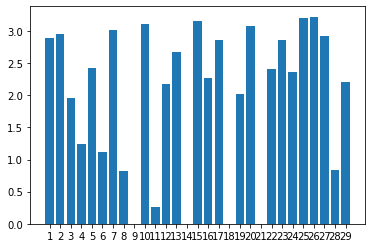

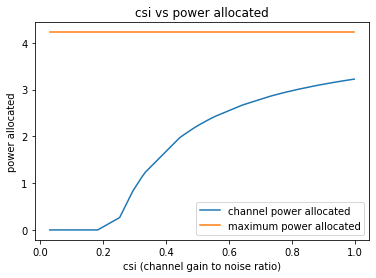

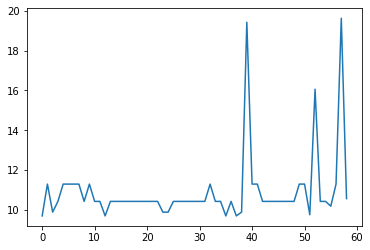

59
Power Allocated= 2.868682583548198
CSI= 0.7125749428938464
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9480268936903409
CSI= 0.4302894788060785
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.412209
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.902331

Power Allocated= 3.135043460018955
CSI= 0.8795072548078008
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1943424640818012
CSI= 0.9279009100482078
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.442435738638173
CSI= 0.35340584190257873
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0638115596875384
CSI= 0.3116981384174865
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in th

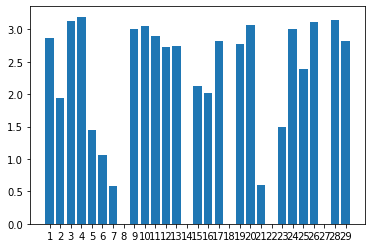

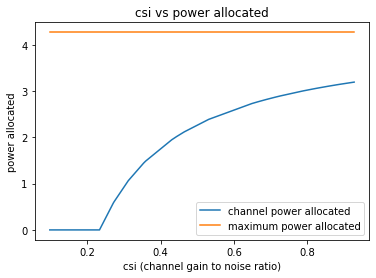

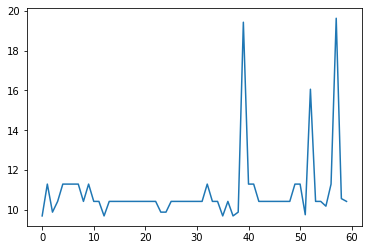

60
Power Allocated= 2.015193507594784
CSI= 0.3597058109898118
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.029127392191572
CSI= 0.5662143113947443
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.982016
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.869855

Power Allocated= 3.570532898468528
CSI= 0.8165196822704264
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.029201741752548194
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.023448666339778934
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2494580895451888
CSI= 0.6469204844511672
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.31

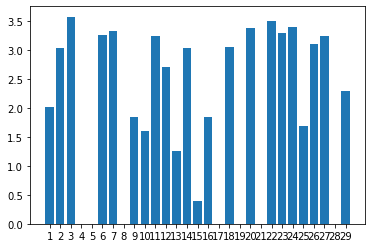

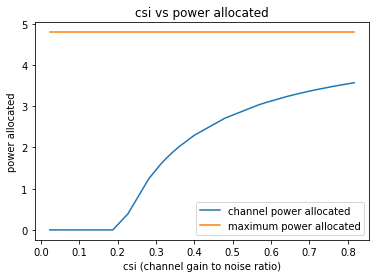

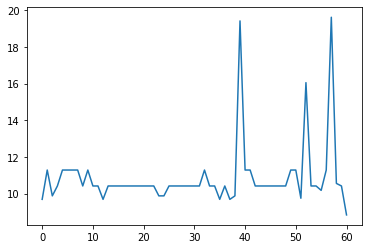

61
Power Allocated= 3.001069092974029
CSI= 0.4015388413415657
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.432218
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.059307

Power Allocated= 0
CSI= 0.11975212934154289
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04961340911134815
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.441386741841893
CSI= 0.9522889418074553
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1343950989798115
CSI= 0.736869124295821
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0985544566802314
CSI= 0.294730188570115
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 

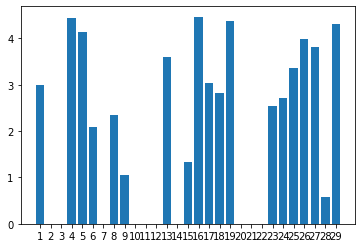

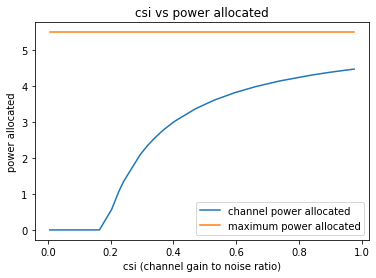

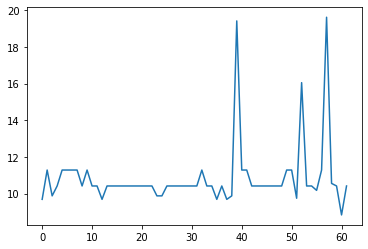

62
Power Allocated= 0
CSI= 0.09295293036410968
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3708191458750663
CSI= 0.3436855671141159
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8819065855102766
CSI= 0.29424323223830695
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.263602274350835
CSI= 0.9834261556435226
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19872089132401416
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6958782738715596
CSI= 0.6310831817382643
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7914569742008197
CSI= 0.6715923640356531
SNR= 7.83199963

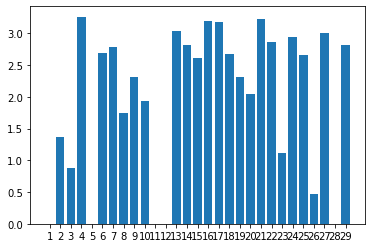

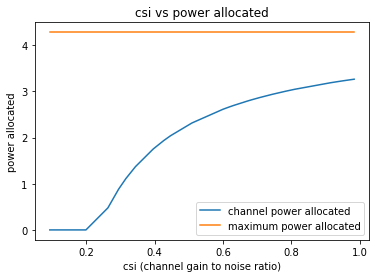

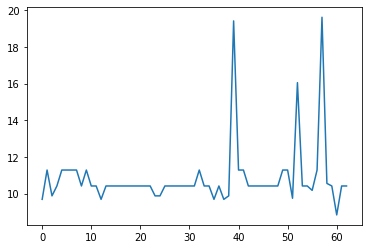

63
Power Allocated= 0
CSI= 0.14089915300366096
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.68722466876571
CSI= 0.5424751623764369
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.026040146028479705
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.540924878089708
CSI= 0.5025877841192978
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8741955086452013
CSI= 0.6037074167002091
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6655729585239145
CSI= 0.5361774817067607
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3152536531301657
CSI= 0.8227924124430404
SNR= 7.8319996355

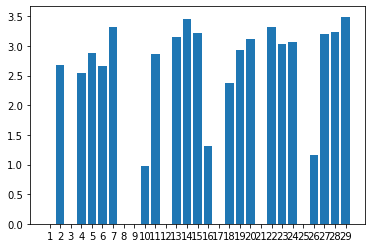

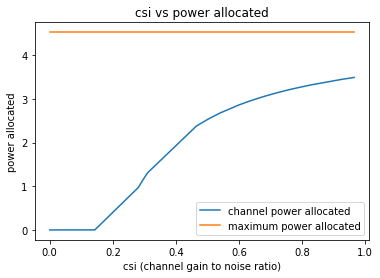

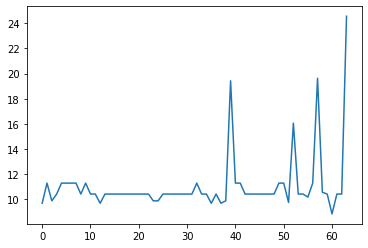

64
Power Allocated= 3.1383001156247987
CSI= 0.5201753577486298
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.746056
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 1.122506

Power Allocated= 3.314389860333982
CSI= 0.5726265439172602
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17036524589562718
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10755794401217011
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1682254111944398
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15615304296946186
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09521543060357474
SNR= 7.831

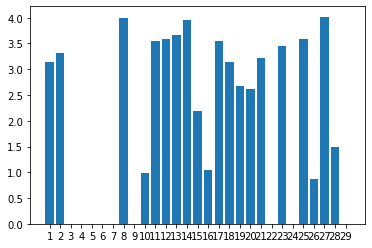

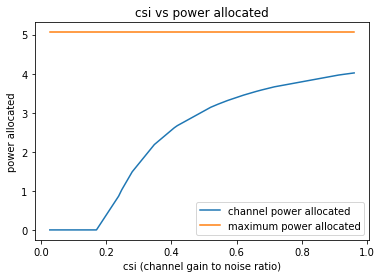

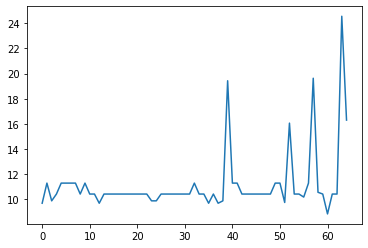

65
Power Allocated= 3.979943598769329
CSI= 0.8048069868546504
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1518388337689025
CSI= 0.9340218983808961
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07972330065820388
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7027373480029144
CSI= 0.39686631258566407
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.422454
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.550979

Power Allocated= 3.232151472846386
CSI= 0.5024302373472845
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.585826
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.300100

Power Allocated= 3.5291825951977938
CSI= 0.5905645682656436
SNR= 7.275378717720197
Client: client6
Model clie

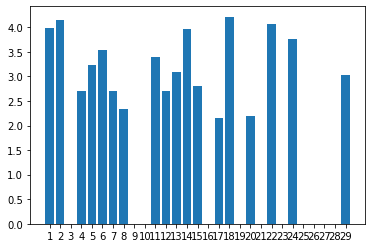

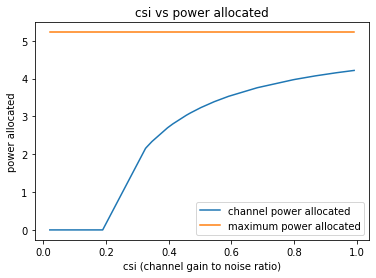

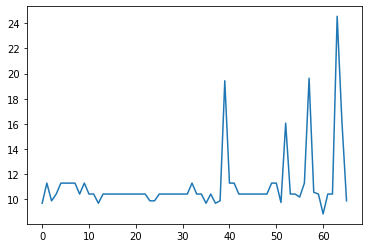

66
Power Allocated= 0.10946925592322554
CSI= 0.22517707675748422
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.356066
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.991892

Power Allocated= 3.469518023008306
CSI= 0.9251544366371802
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3145049434276528
CSI= 0.23607657567710383
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.28284789844715
CSI= 0.7889106054517852
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3945144558465965
CSI= 0.46384250656363557
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12176635537108516
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Pow

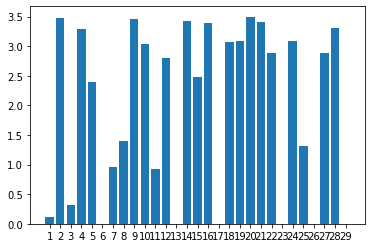

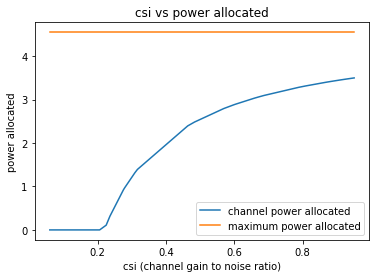

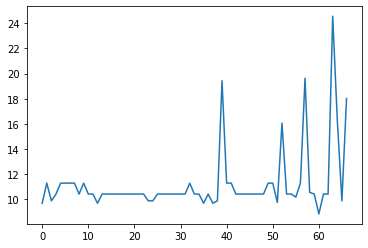

67
Power Allocated= 3.8753677428028466
CSI= 0.9097015277927955
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9713365672661762
CSI= 0.49917814739637745
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.963607839610293
CSI= 0.9890985998320471
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7862594961344267
CSI= 0.8414888369933299
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.650100136321608
CSI= 0.7549852123984989
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2033972153760732
CSI= 0.26516532360417766
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4290529927353322
CSI= 0.

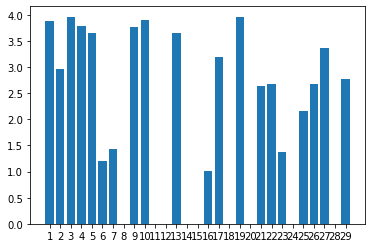

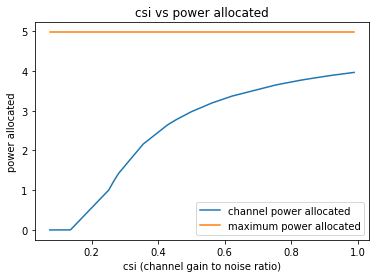

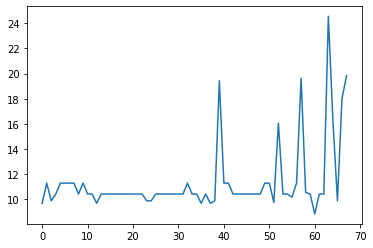

68
Power Allocated= 2.7540839629800073
CSI= 0.8992845708251432
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18489488050265068
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.83366070939928
CSI= 0.968599633656224
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.484406
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.183217

Power Allocated= 2.5345463886951674
CSI= 0.7510142631845953
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.740654028039916
CSI= 0.8885532174816586
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7084959341287043
CSI= 0.4634815712625834
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

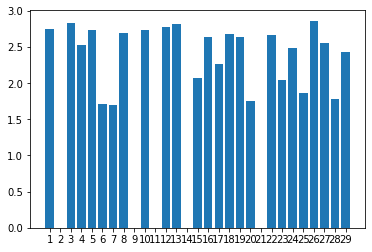

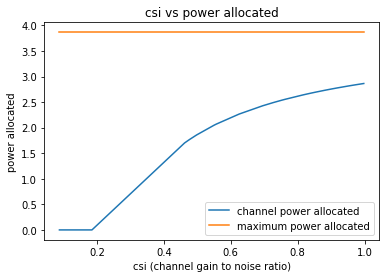

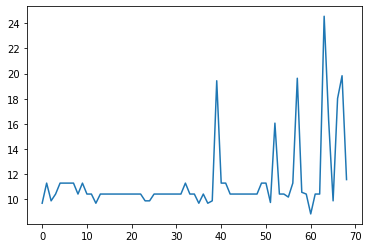

69
Power Allocated= 2.844013622127342
CSI= 0.603410452669438
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.618101366438343
CSI= 0.5310226099811991
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.161601733643371
CSI= 0.746458825872732
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.144570
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.045229

Power Allocated= 3.075763118444898
CSI= 0.7015096036877296
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6928252966142447
CSI= 0.26257504335008275
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07070422135076515
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

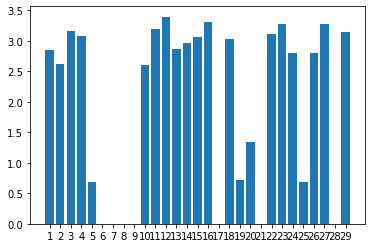

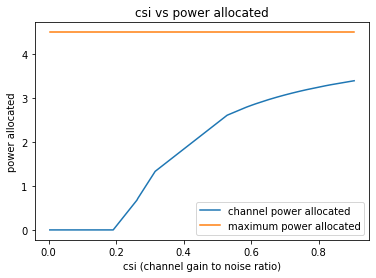

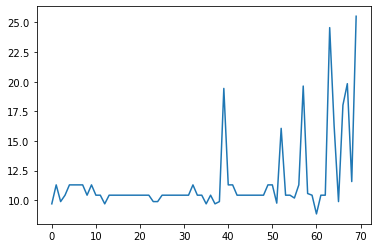

70
Power Allocated= 2.5714874985545726
CSI= 0.5443936461151031
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.387529685017711
CSI= 0.9795625093256681
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.339559
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 1.013624

Power Allocated= 0.801610842760065
CSI= 0.2772554025205318
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02830046098791672
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.188261665196572
CSI= 0.8195835112063294
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.821403
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.116315

Power Allocated= 3.3871573718204067
CSI= 0.9792053891546507
SNR= 7.275378717720197
Client: client6
Poor Channel

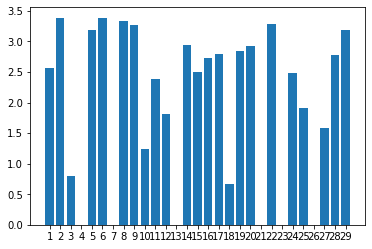

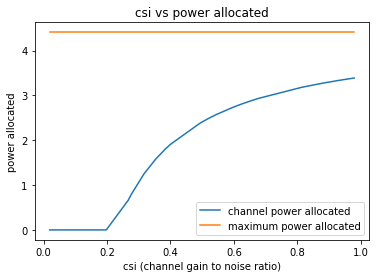

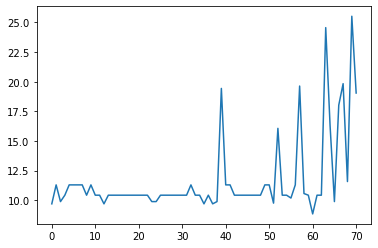

71
Power Allocated= 3.6745180136404922
CSI= 0.6844339891086344
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2856800757423992
CSI= 0.20618985160982717
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.571056
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.599362

Power Allocated= 3.9820271198601804
CSI= 0.8668875348563226
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15592460647931894
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3061769864950765
CSI= 0.20706496093351312
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.543432
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.910631

Power Allocated= 0.45698372297484635
CSI= 0.213739355103306
SNR= 7.275378717720197
Client: client6
Model c

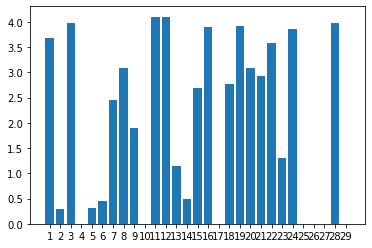

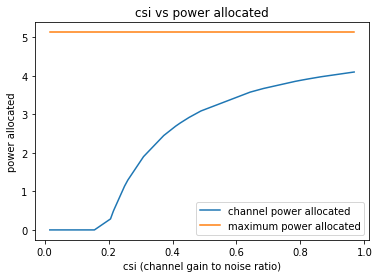

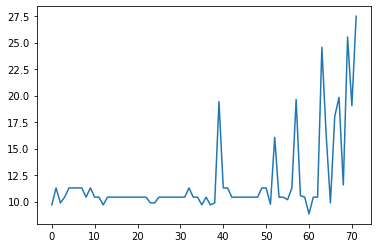

72
Power Allocated= 2.2157502766327064
CSI= 0.44323851085904487
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20684251716956303
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6150203776159042
CSI= 0.35003568901215
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.971270265114208
CSI= 0.6663993692263145
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.350534
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.781107

Power Allocated= 3.358132631421837
CSI= 0.8978761952978157
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.266682
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.797898

Power Allocated= 2.5740040723937447
CSI= 0.5269070753881432
SNR= 7.275378717720197
Client: client6
Model client

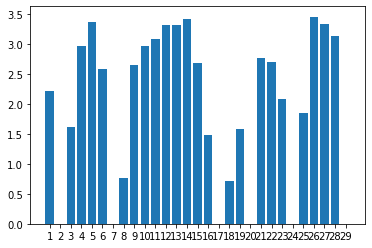

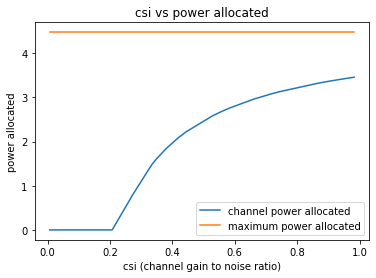

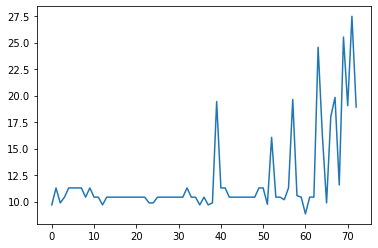

73
Power Allocated= 2.3245051309322795
CSI= 0.5101124218948412
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.225523641937522
CSI= 0.9439896287024206
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4178862531237884
CSI= 0.5356269418529525
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.057817916511624046
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20006848677470745
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.097041250207268
CSI= 0.8418811887380268
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2772082263425095
CSI= 0.4980950137263944
SNR= 7.831999635

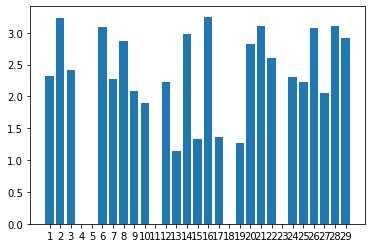

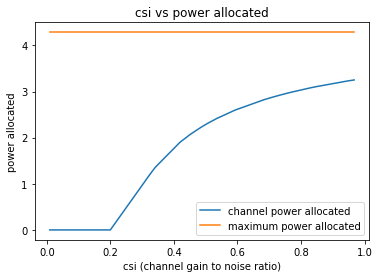

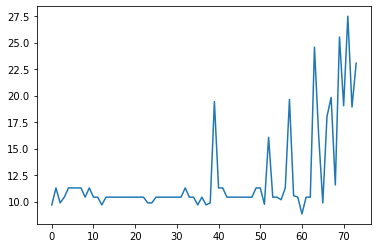

74
Power Allocated= 3.82629071010986
CSI= 0.7435635997457094
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.285423404664227
CSI= 0.5302951870602366
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8646632710411661
CSI= 0.30243438725935423
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.562114
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.312949

Power Allocated= 3.0928190809111364
CSI= 0.48115172330068334
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8254552908933674
CSI= 0.42631010501855404
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.270492888671629
CSI= 0.5261295141359527
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in t

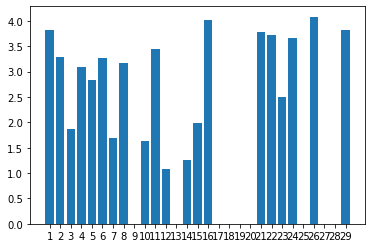

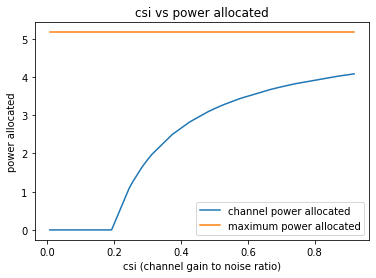

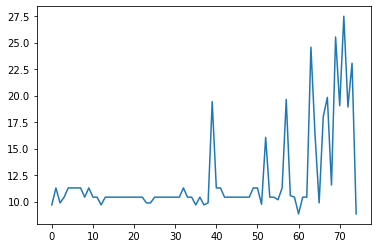

75
Power Allocated= 2.8267108963349186
CSI= 0.7350006024561537
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.572953565677341
CSI= 0.6194633783553316
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9569070129103556
CSI= 0.8127788432416364
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.625567094293034
CSI= 0.640333217302452
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.723490
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 1.084426

Power Allocated= 1.619530606258356
CSI= 0.38945004858924503
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.056125447867828
CSI= 0.8840728130778
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this ro

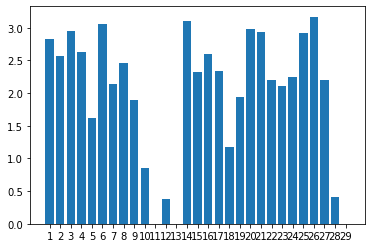

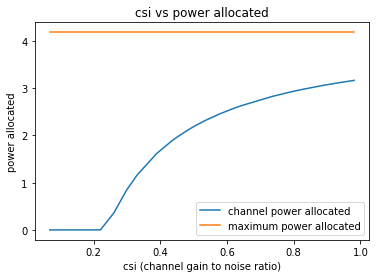

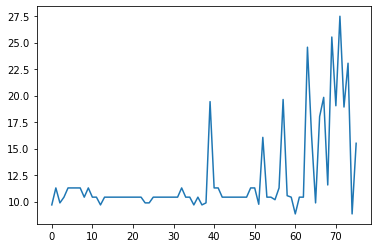

76
Power Allocated= 2.8366490375849276
CSI= 0.6903333615347564
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1211486206298824
CSI= 0.31604804172225354
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4814456427433838
CSI= 0.3566615038445866
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.172635
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.040776

Power Allocated= 0
CSI= 0.0023574507156481905
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4465905223011175
CSI= 0.5438820272210368
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4512206535450902
CSI= 0.26082393970147133
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.213005
Mod

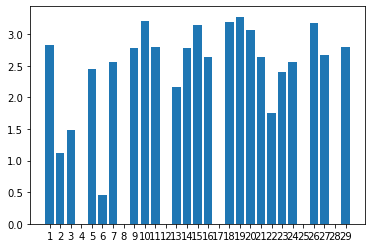

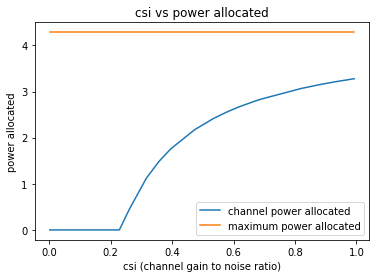

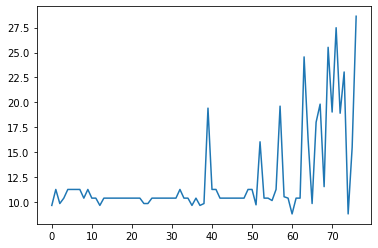

77
Power Allocated= 3.054896378697964
CSI= 0.5479281600342369
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9319658042388514
CSI= 0.5133503566736627
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5441015624811776
CSI= 0.7485861509685394
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2682781078594734
CSI= 0.27687983765254875
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3933314500997263
CSI= 0.40215204389747483
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07214897263725828
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8302589883663374
CSI= 0.952658435395714

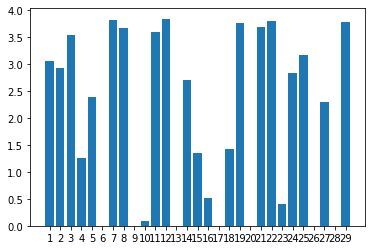

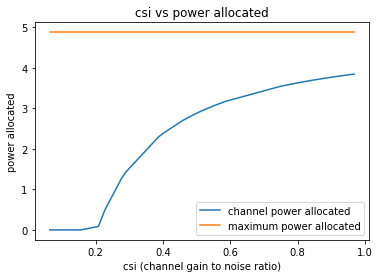

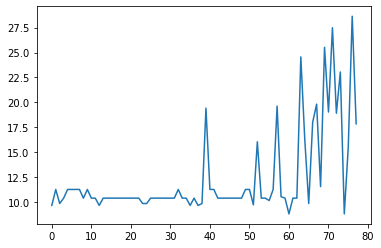

78
Power Allocated= 1.2906510288660016
CSI= 0.34364607611517184
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.363868
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.711502

Power Allocated= 2.9385893111836188
CSI= 0.792372695971957
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.197958
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.788719

Power Allocated= 1.3450915839777249
CSI= 0.35019767334506813
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.806108
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.475879

Power Allocated= 1.9617616869405587
CSI= 0.446655886359716
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.072753433328807
CSI= 0.8866283737504209
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8072642517213153
CS

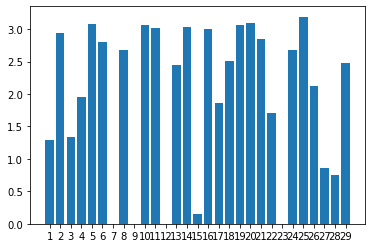

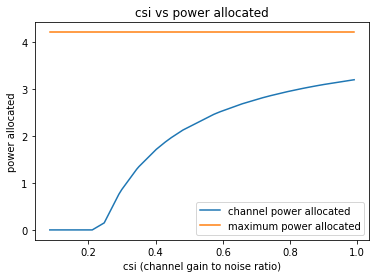

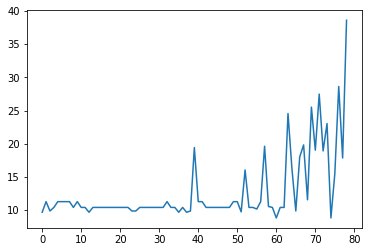

79
Power Allocated= 3.5921909971223203
CSI= 0.78318822147805
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.037016397206530605
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1840334363625216
CSI= 0.593475389408113
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1147626447855985
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.665807781435631
CSI= 0.45388206619187355
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.322974661759858
CSI= 0.6468101922069054
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.303508
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 1.132461

Power Allocated= 2.44819

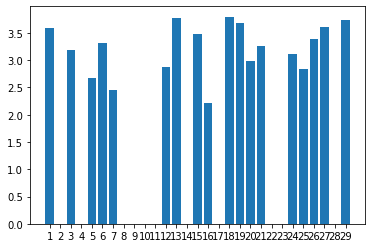

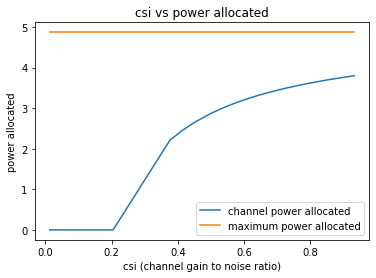

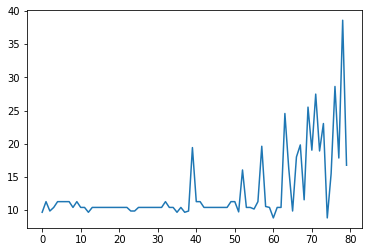

80
Power Allocated= 2.135289747663053
CSI= 0.44000233936339717
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05361761666677789
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0660687667458273
CSI= 0.7451919265548729
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2957295421905579
CSI= 0.24317437525475338
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.796358
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.688974

Power Allocated= 3.1856981892010268
CSI= 0.8181252388801535
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.383097563061218
CSI= 0.975697926916227
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power

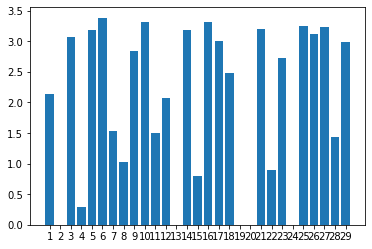

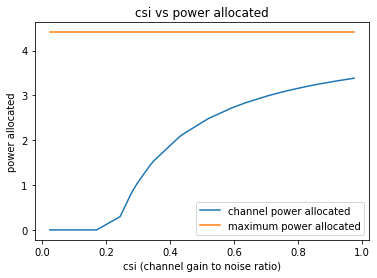

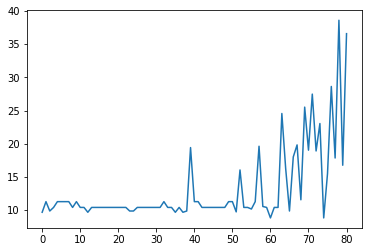

81
Power Allocated= 0
CSI= 0.1309918030187579
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17873062816950525
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6207250096221717
CSI= 0.8907432412405472
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7740293978830142
CSI= 0.2519301894188227
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3477107193289646
CSI= 0.41741936745975583
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10633315981851788
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07399279547472637
SNR= 7.831999635556276
Client: client7
Poor Cha

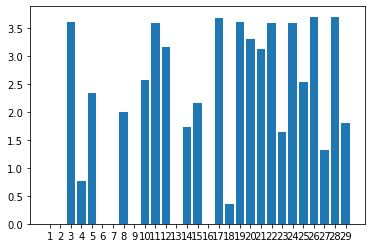

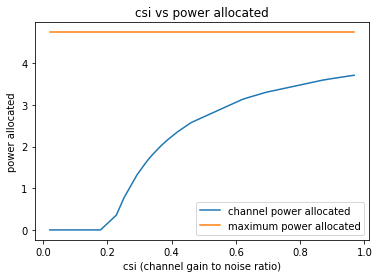

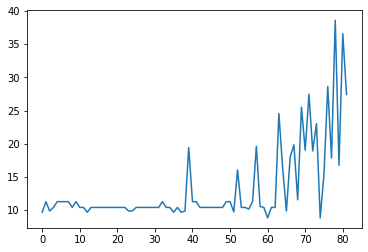

82
Power Allocated= 3.472630928721663
CSI= 0.895551633645404
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.494248
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.410353

Power Allocated= 0
CSI= 0.04310764537245515
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5009698831549896
CSI= 0.918871675074045
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4512650289975486
CSI= 0.878737633665185
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2316612064197745
CSI= 0.7365940314212032
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6142454529667303
CSI= 0.5063250951148943
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

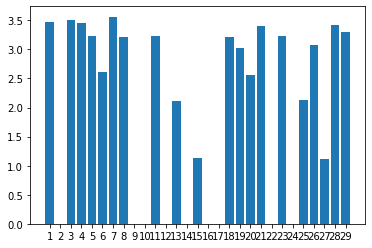

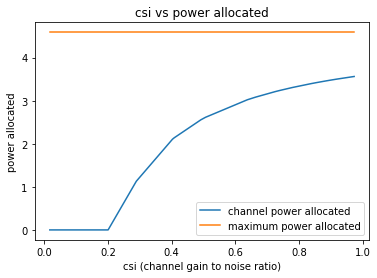

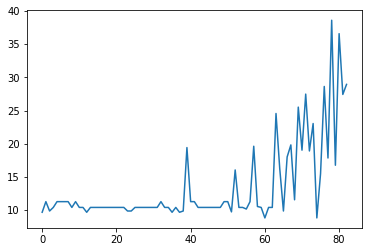

83
Power Allocated= 2.6135791276157434
CSI= 0.6567047074130149
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.086077159011226
CSI= 0.95214845139741
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.93741698309063
CSI= 0.8340863945962524
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.185485
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.817841

Power Allocated= 0
CSI= 0.18523629620494209
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.150467606547454
CSI= 0.5035586623124706
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8363279293625974
CSI= 0.7692274410938904
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.483467
Model client6

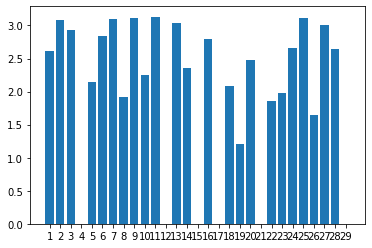

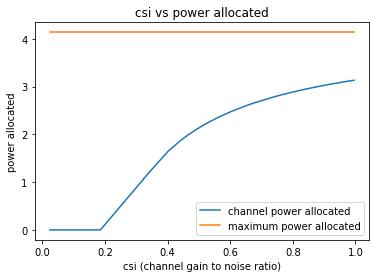

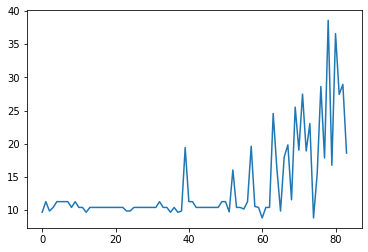

84
Power Allocated= 2.0186270248058054
CSI= 0.41095840459524136
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14805316734671004
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2907560140260337
CSI= 0.8611726764487018
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.744631
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.963602

Power Allocated= 0
CSI= 0.012719936442701307
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0912788958017736
CSI= 0.73492426699839
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.922301468488707
CSI= 0.39530975298295434
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.293731
Model client6 Train Epo

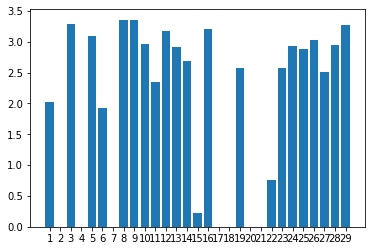

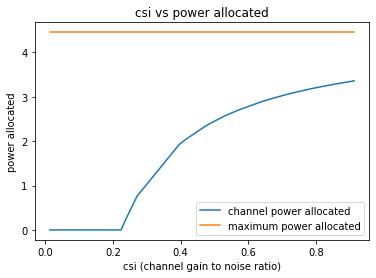

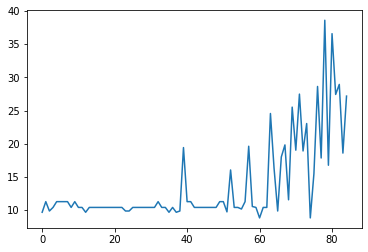

85
Power Allocated= 3.8941389583465025
CSI= 0.617376916493839
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.018515831975769115
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5442436170498377
CSI= 0.5077040540360677
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06952141076844054
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1764451981548848
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.953959794975724
CSI= 0.641052260941323
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.073294
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.338780

Power Allocated= 3.202740292905258
CSI=

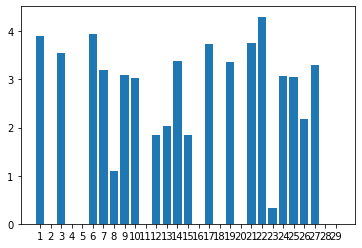

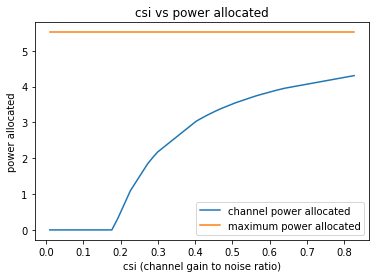

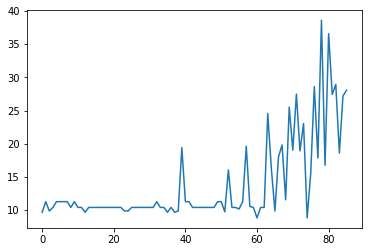

86
Power Allocated= 3.150746219950021
CSI= 0.8377455426815381
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0918039592977697
CSI= 0.7983253420633549
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4792481787854017
CSI= 0.5361418811161698
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5417295922127274
CSI= 0.26297128829687955
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9368458090587986
CSI= 0.7104390460020719
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2766686061380073
CSI= 0.9365422434582201
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.501592122850045
CSI= 0.5

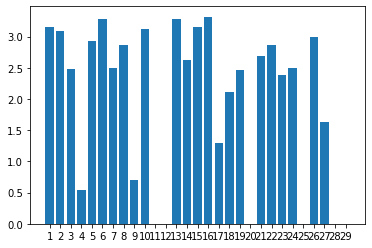

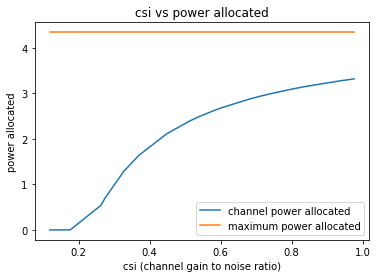

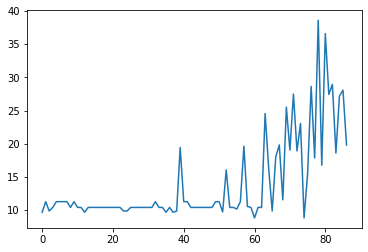

87
Power Allocated= 2.548769060353864
CSI= 0.5260895354953226
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.182228102545777
CSI= 0.7890429793241945
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.008914824361180185
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09908072647461552
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16604716268839215
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.028934565605475693
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4494065001576937
CSI= 0.24998876998402642
SNR= 7.831999635556276
Client: client7
Model c

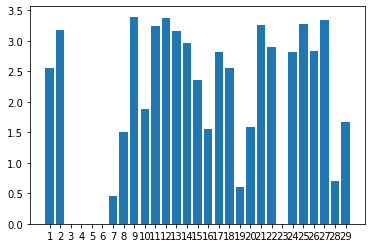

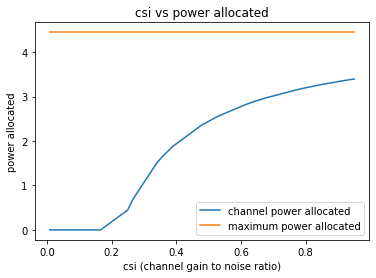

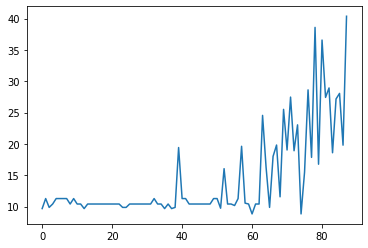

88
Power Allocated= 1.2109095772815288
CSI= 0.3373300458954236
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.610373
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.194989

Power Allocated= 1.9822071372152754
CSI= 0.45596345794524806
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.917949769457529
CSI= 0.7952820212137035
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1611704587645715
CSI= 0.9860037889131296
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.672357
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.674748

Power Allocated= 3.0417836139380654
CSI= 0.8821595947320209
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3464983405002395
CSI= 0.3534984142405305
SNR= 7.275378717720197
Client: c

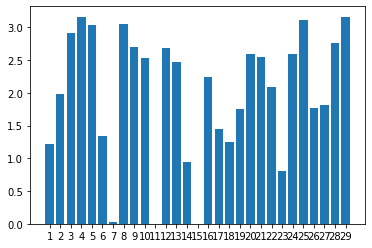

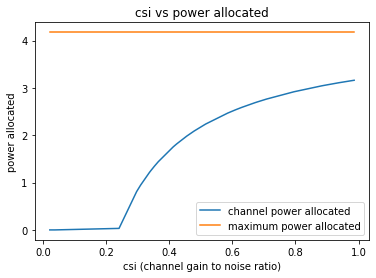

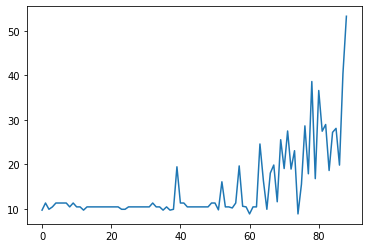

89
Power Allocated= 1.969432396656863
CSI= 0.502506809916383
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.680394754417054
CSI= 0.7818238926055642
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.766938
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.536065

Power Allocated= 0.29099636519865024
CSI= 0.27259403765052737
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.356592
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.702754

Power Allocated= 2.0419899483900847
CSI= 0.5215218425101259
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9107062172964264
CSI= 0.9535170346260028
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.557391834104389
CSI= 0.7132345365589821
SNR= 7.275378717720197
Client: cli

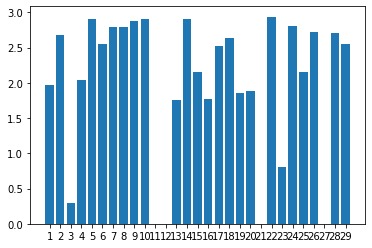

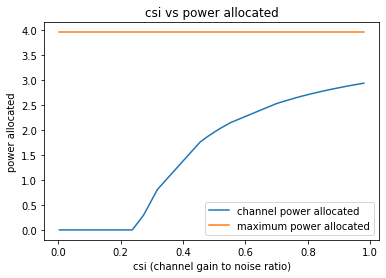

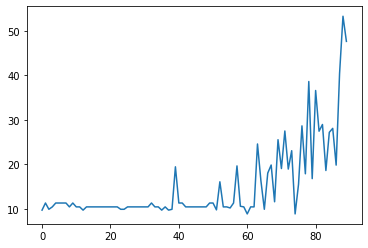

90
Power Allocated= 2.4089789527646137
CSI= 0.4545112443086978
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.532627482841039
CSI= 0.9289216466880533
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07664905990661908
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7332099465599518
CSI= 0.5330676250752957
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8388616246532665
CSI= 0.5648814603385506
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.376643729401182
CSI= 0.8113584909238755
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.928901
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.205297

Power 

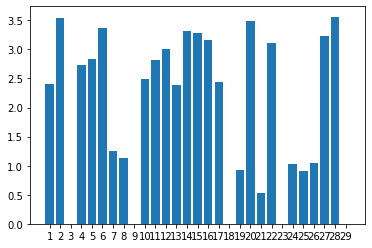

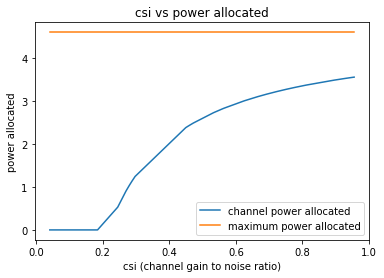

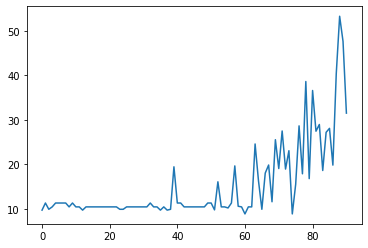

91
Power Allocated= 0
CSI= 0.06198365609008061
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0117808229683156
CSI= 0.5936910637770765
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.932811
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.286775

Power Allocated= 3.3455232065264973
CSI= 0.7403922979831331
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.866873719662597
CSI= 0.5466617268224342
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.549406484776184
CSI= 0.8720280843866011
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05483921851798301
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.327

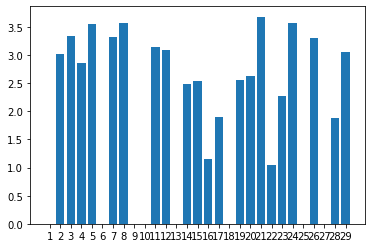

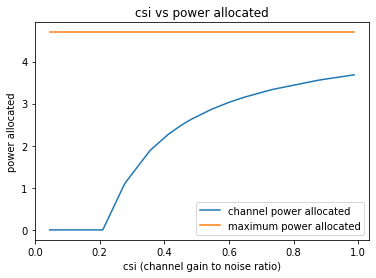

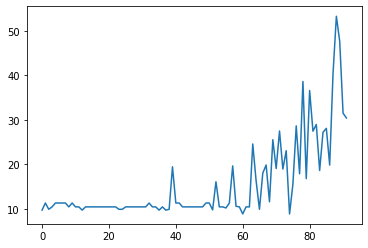

92
Power Allocated= 3.361040693569698
CSI= 0.9938846794513101
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.706394491405496
CSI= 0.6021197686809325
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.499420
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.259087

Power Allocated= 2.903925918936509
CSI= 0.6834019398304981
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12568516746744895
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08469192184449725
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16026428743444443
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1358913007711

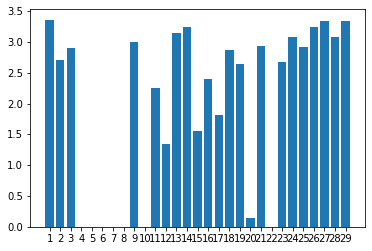

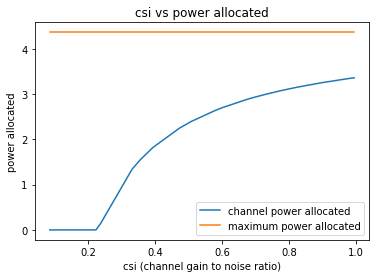

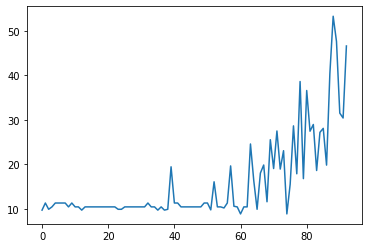

93
Power Allocated= 2.964611727703092
CSI= 0.824743823957223
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.847851578553387
CSI= 0.752299481388999
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2783505234767576
CSI= 0.5266598045475046
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9696464351888534
CSI= 0.8281827234405588
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.773767
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.246359

Power Allocated= 2.9281373894045135
CSI= 0.8006584289126449
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.032441
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.959755

Power Allocated= 2.4692947274280943
CSI= 0.5855436145864037
SNR= 7.275378717720197
Client: clien

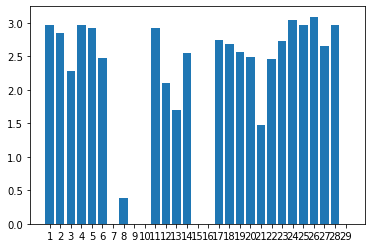

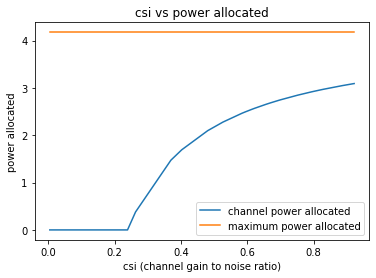

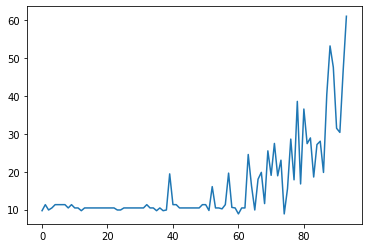

94
Power Allocated= 2.469587540338024
CSI= 0.6052960219061095
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.580627321266075
CSI= 0.6489105578747949
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0840384069735234
CSI= 0.49076542813347257
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.255557
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.479122

Power Allocated= 1.7858066814268043
CSI= 0.4281069199704056
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5828956024781218
CSI= 0.39389057635174785
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2941977846915353
CSI= 0.5472034179141474
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 

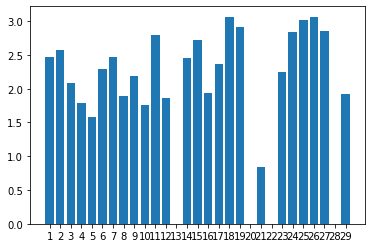

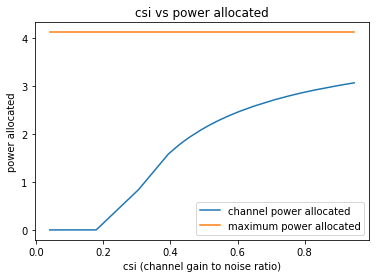

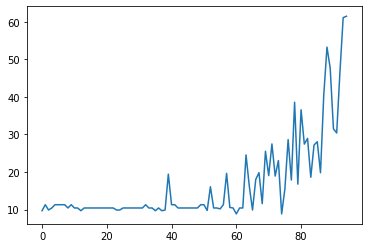

95
Power Allocated= 2.8861870201725535
CSI= 0.7095491564593583
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.888611421197497
CSI= 0.41546852039658366
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1511815820544964
CSI= 0.8738577098095798
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6735665580181935
CSI= 0.616535701565965
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3754287770358244
CSI= 0.5208051585845601
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0707980318263638
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.03077267764429159
CSI= 0.23447978489025467

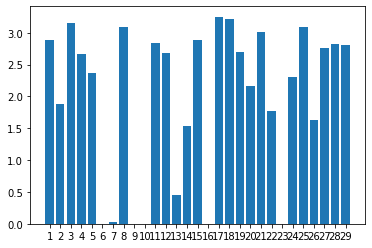

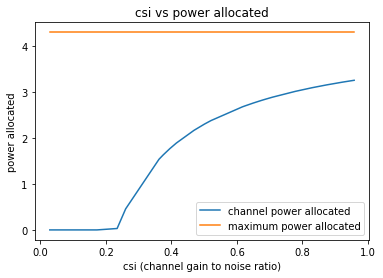

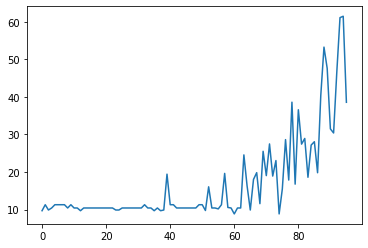

96
Power Allocated= 3.3875808893012884
CSI= 0.80345667212202
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14278850469667814
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.467517452773203
CSI= 0.46196084520092706
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.463026
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.262548

Power Allocated= 0
CSI= 0.16213612626413265
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.069482118294383
CSI= 0.639909508609215
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.556959
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.399597

Power Allocated= 3.5584561974291065
CSI= 0.9313181906827517
SNR= 7.275378717720197
Client: client6
Poor Channel, client not take

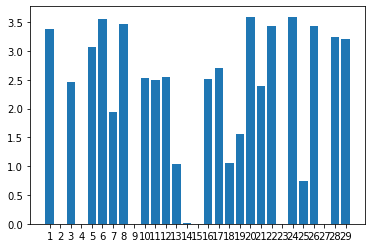

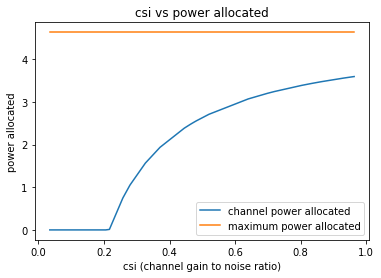

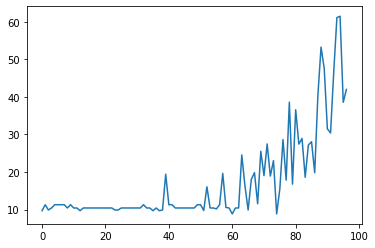

97
Power Allocated= 0
CSI= 0.14066668184321585
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3587382117873124
CSI= 0.9651638898046332
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3593640197512924
CSI= 0.9657472081188316
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020027989186316097
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3525256750401815
CSI= 0.9594111491356819
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.534711066748698
CSI= 0.5375995481044153
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.818894314087631
CSI= 0.6345429856114112
SNR= 7.831999635

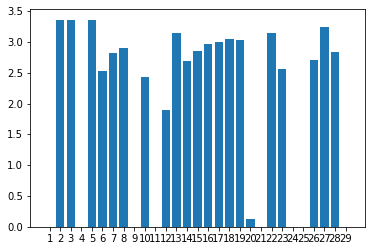

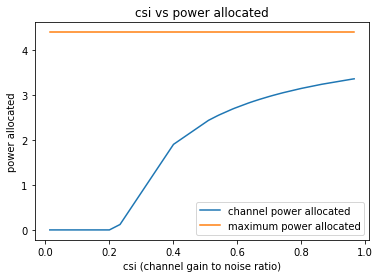

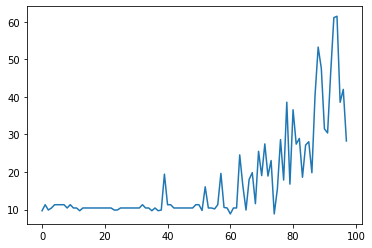

98
Power Allocated= 2.1986098306061064
CSI= 0.5344555566873871
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.737496307228588
CSI= 0.7506512888469586
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0635631331456494
CSI= 0.9939274361698315
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9290531727440654
CSI= 0.4671544575495479
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.238361
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.742274

Power Allocated= 0.7047613759622249
CSI= 0.29718464306647985
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.337330
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.032341

Power Allocated= 0.26956295406180697
CSI= 0.2631502880145028
SNR= 7.275378717720197
Client: 

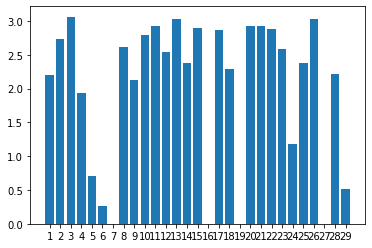

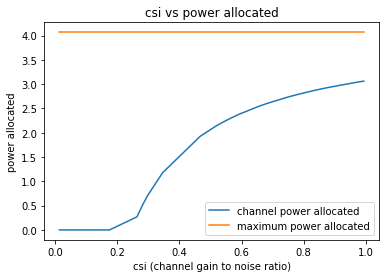

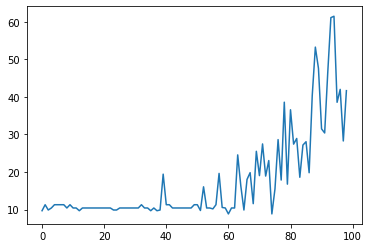

99
Power Allocated= 0
CSI= 0.01205729518434584
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0429721836007033
CSI= 0.837047680349142
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.987525675306365
CSI= 0.7999221944886199
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17836388295462902
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.716835788767242
CSI= 0.6575436995783087
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8534577751428127
CSI= 0.7224444429100285
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.386248
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.296472

Power Allocated= 0
CSI=

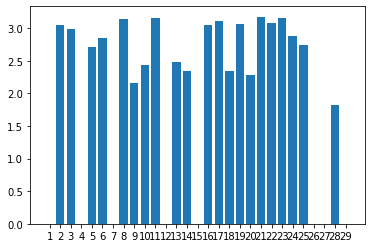

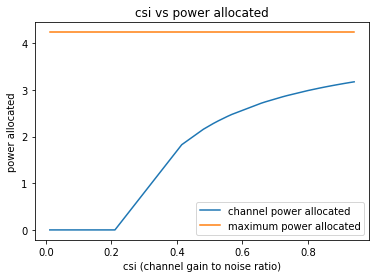

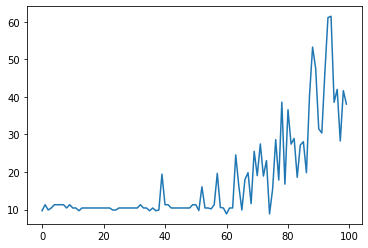

100
Power Allocated= 3.6079335254224425
CSI= 0.9673705462015407
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6301591226572536
CSI= 0.3320599443722053
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8613069632104331
CSI= 0.2645253089656966
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.303212
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.290269

Power Allocated= 1.581983411918523
CSI= 0.3268315469614139
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2024957759517614
CSI= 0.6948460093324527
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8600657917765586
CSI= 0.56129391884878
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.

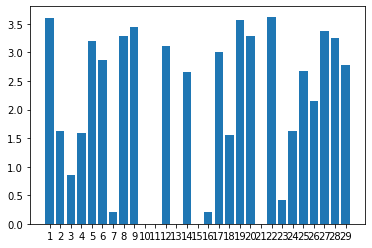

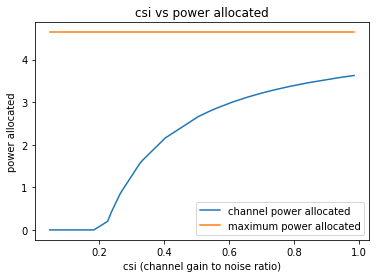

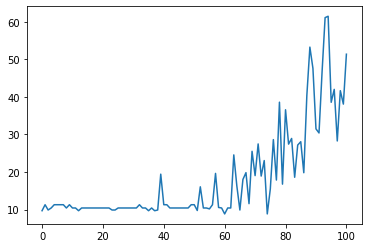

101
Power Allocated= 2.221367660988401
CSI= 0.4075454342553744
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3922174967922887
CSI= 0.438046182811641
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.656840
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.527354

Power Allocated= 1.586529887185414
CSI= 0.32377632745626017
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.208046150201818
CSI= 0.6816466870732113
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.810655
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.056026

Power Allocated= 0
CSI= 0.06971470219490028
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2420457780119012
CSI= 0.29128735892571433
SNR= 7.275378717720197
Client: client6
Poor Chann

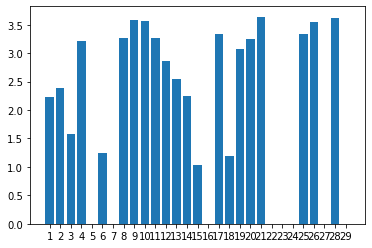

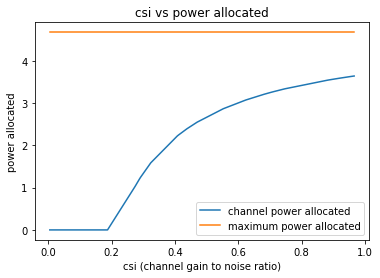

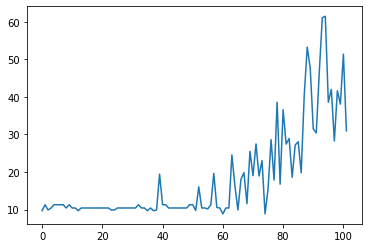

102
Power Allocated= 0.4006613576678175
CSI= 0.25806214655687587
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.070868
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.545988

Power Allocated= 3.26892074483629
CSI= 0.9932694139898125
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.34414820485360886
CSI= 0.254352690942414
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.148008
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.469748

Power Allocated= 0.4124305913058941
CSI= 0.258848319039676
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2617260136769213
CSI= 0.33178820397049624
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4097382551161752
CSI= 0.5359175467552089
SNR= 7.275378717720197
Client: c

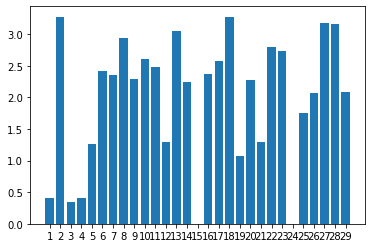

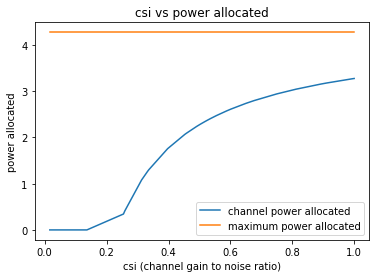

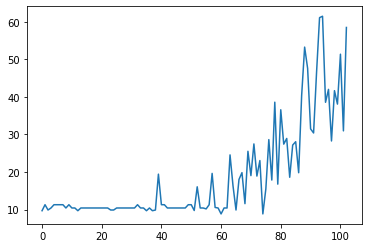

103
Power Allocated= 2.880229574889655
CSI= 0.5854152263856451
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5480775976154844
CSI= 0.49011409645645243
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.887596
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.475684

Power Allocated= 3.5197453064027178
CSI= 0.9357394724430019
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.042048
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.146131

Power Allocated= 3.4657802259259074
CSI= 0.8907586070841336
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.490935884782597
CSI= 0.9111758898522412
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.901335
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.316863

Power Allocated= 0
CSI= 0.13883304438

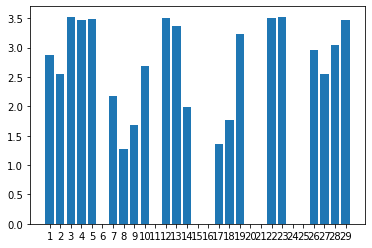

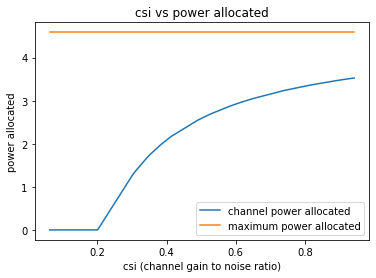

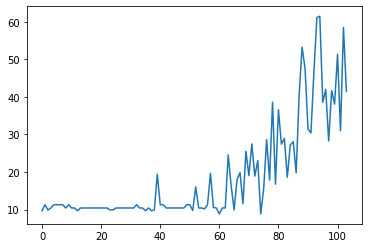

104
Power Allocated= 2.7159968865385586
CSI= 0.6362132411177013
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.956557
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.360864

Power Allocated= 0
CSI= 0.02989757332920784
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2039114238921607
CSI= 0.9226066724042494
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.471090
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.248708

Power Allocated= 3.17483871944785
CSI= 0.8985063325600889
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2724637467474
CSI= 0.9848983728255009
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.117361
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.618580

Power Allocated= 0
CSI= 0.08180411425030942
SNR= 7.275378

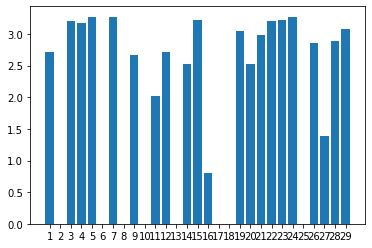

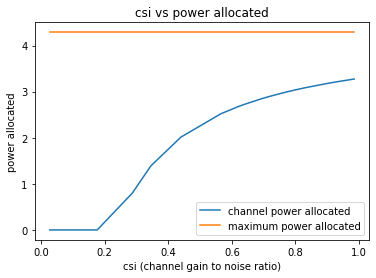

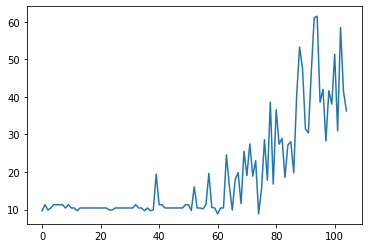

105
Power Allocated= 3.003206830374787
CSI= 0.7464302686270435
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.610785
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.029801

Power Allocated= 1.4126386287679824
CSI= 0.3412645403322415
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7901281082153684
CSI= 0.6440026694233291
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.882635
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.365494

Power Allocated= 2.594738150418614
CSI= 0.5720239495013665
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.502856824440003
CSI= 0.5434605752393872
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7095953846381153
CSI= 0.37974856812231683
SNR= 7.275378717720197
Client: cl

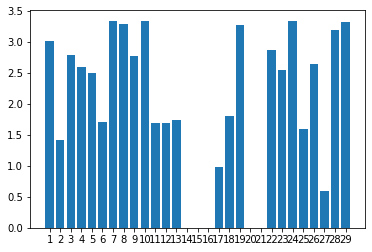

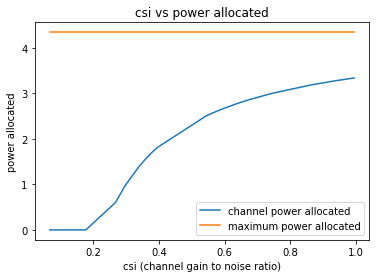

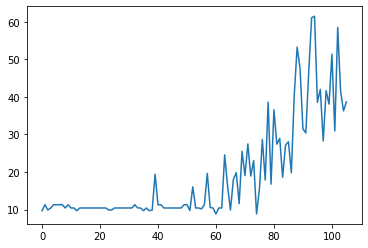

106
Power Allocated= 2.052007499031537
CSI= 0.3939306851871166
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.424709
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.042543

Power Allocated= 2.8178067173103782
CSI= 0.5641053751858405
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5498042386167508
CSI= 0.4900229087884934
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3948137572277601
CSI= 0.3129193707415846
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5407662230317274
CSI= 0.4878622475442629
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.173953
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.278033

Power Allocated= 2.6682550648768477
CSI= 0.5202182589102324
SNR= 7.275378717720197
Client: c

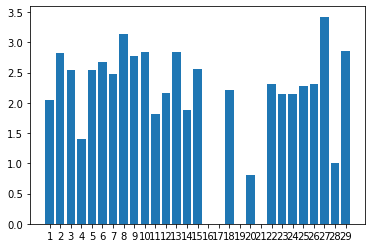

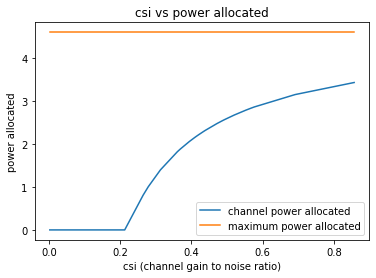

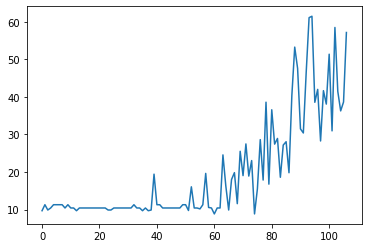

107
Power Allocated= 3.1622542982199926
CSI= 0.5516115087854601
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.501714656111345
CSI= 0.287901537692668
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16329037384742606
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7516162424344435
CSI= 0.8173219048094572
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.840406419601508
CSI= 0.24185446505299024
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.330621
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006141

Power Allocated= 3.7260123092430675
CSI= 0.80056867988419
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power A

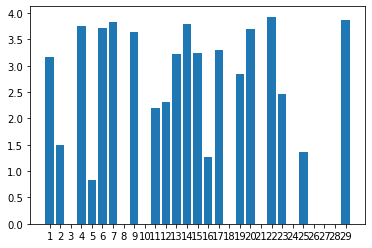

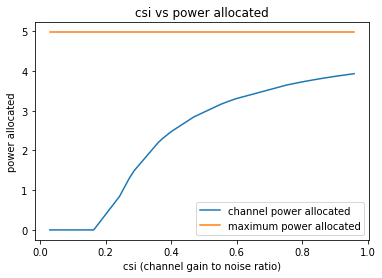

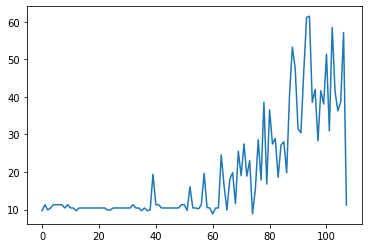

108
Power Allocated= 1.4650498450302551
CSI= 0.33970478541201454
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7327837211859092
CSI= 0.37369227698234786
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.168593
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.212335

Power Allocated= 3.1395006794660474
CSI= 0.7878472265641487
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.174343602186477
CSI= 0.8100847829574894
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2543037258477803
CSI= 0.8661919132150383
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8161796586027
CSI= 0.627903017090557
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.

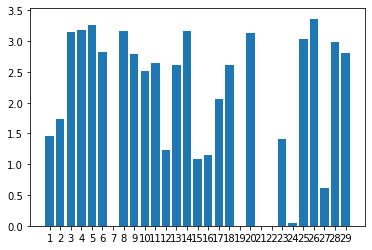

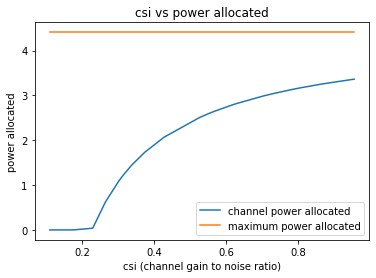

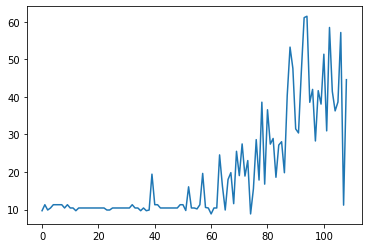

109
Power Allocated= 1.452183056538857
CSI= 0.30193324602220883
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.011015926295636858
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.515173232177486
CSI= 0.8006403946310507
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9932978494150633
CSI= 0.26519040004515415
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18196876394127992
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.494361495120093
CSI= 0.7875182014166509
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.615774451337162
CSI= 0.31762175354889466
SNR= 7.8319996

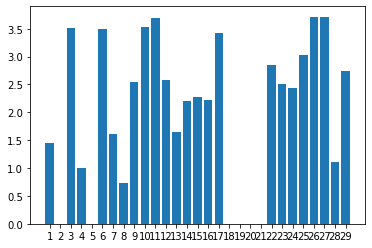

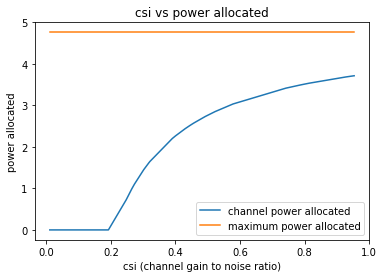

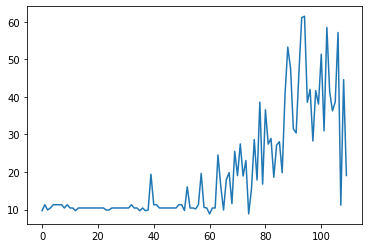

110
Power Allocated= 3.200169013777822
CSI= 0.7801990853089027
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.060619385400714
CSI= 0.7035942150867593
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8840418386277715
CSI= 0.6258404595215493
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.000146670912021
CSI= 0.287212180877388
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 4.157876
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.209259

Power Allocated= 3.00598425503396
CSI= 0.6775485954999163
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19209785193511353
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

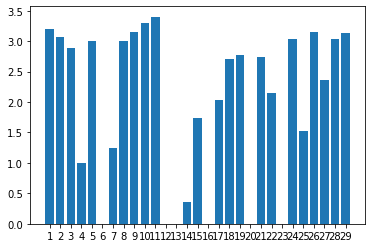

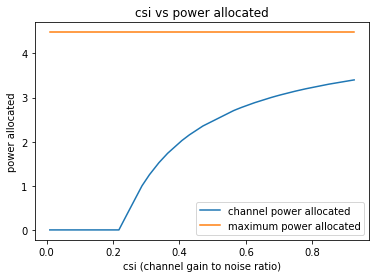

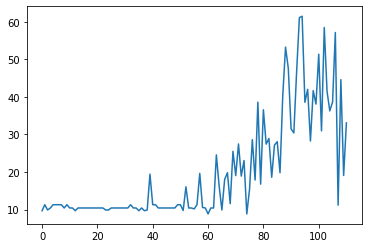

111
Power Allocated= 2.911216267671721
CSI= 0.5816419178113245
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8782134589988639
CSI= 0.26650508156221586
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.92386754583383
CSI= 0.5859536658851887
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.678544
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.112403

Power Allocated= 0
CSI= 0.14512895908628098
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.009125292312799904
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4410188049225905
CSI= 0.8407117543463025
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
C

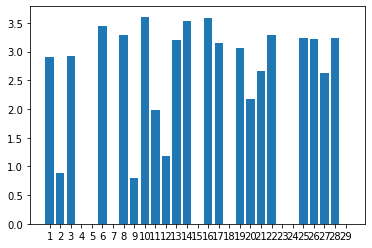

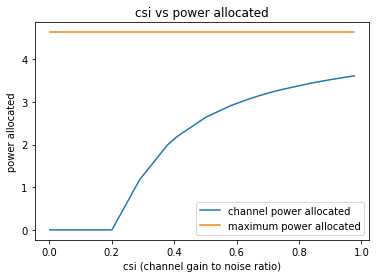

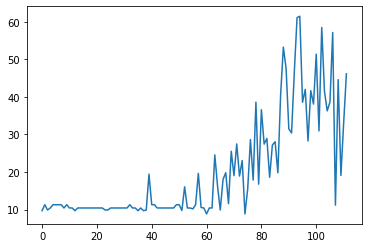

112
Power Allocated= 3.1257058216987827
CSI= 0.5405657738806267
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8208801044832352
CSI= 0.8659962884424566
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2489396967744275
CSI= 0.2683353715087612
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.459083
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.260103

Power Allocated= 0
CSI= 0.12586773108870664
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2803022810162856
CSI= 0.5898601215568233
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.074944
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.524279

Power Allocated= 3.691040142946183
CSI= 0.7784649675772186
SNR= 7.275378717720197
Client: client6
Model cli

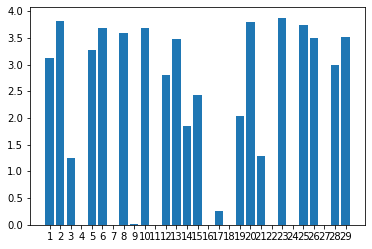

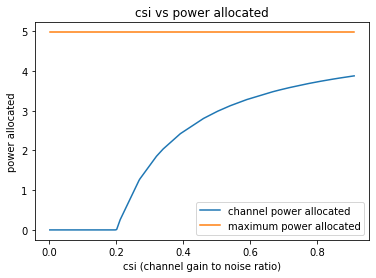

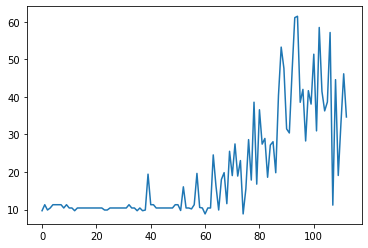

113
Power Allocated= 3.0032108338674632
CSI= 0.7272341817891097
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.307096
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.026347

Power Allocated= 2.830976066351333
CSI= 0.6462838869211661
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06221834420126493
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6736473299237002
CSI= 0.2699320248071526
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.095571555550896
CSI= 0.4380753818789248
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9495583123429507
CSI= 0.4117386015800658
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power

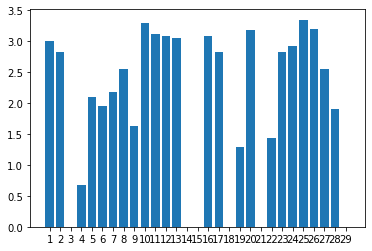

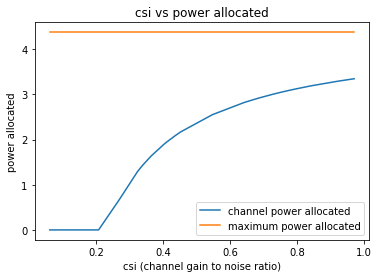

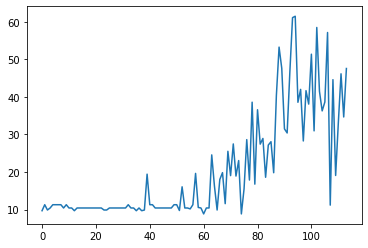

114
Power Allocated= 3.4744436493346793
CSI= 0.9486481026209886
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7455204467422427
CSI= 0.5608352387185619
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0894185847712112
CSI= 0.4099777556610297
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.234792
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.047503

Power Allocated= 2.106431388130703
CSI= 0.4128573826209526
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4912086048265825
CSI= 0.9639792706018184
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.495093544812244
CSI= 0.9676029451929966
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in t

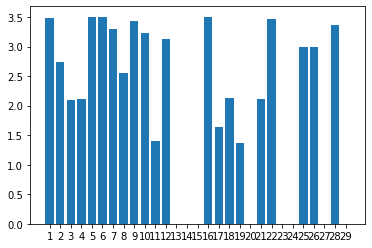

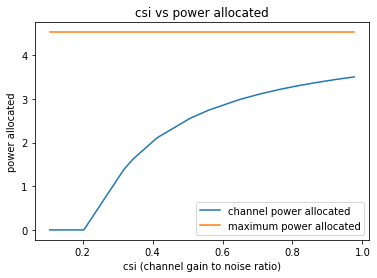

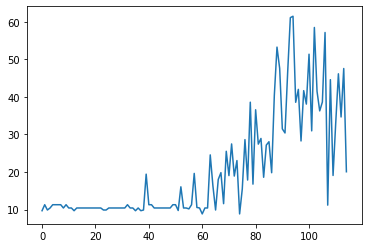

115
Power Allocated= 0
CSI= 0.020297976895531367
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.473017110814641
CSI= 0.8131622095493998
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.362564
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.195460

Power Allocated= 3.4135981853024857
CSI= 0.7756833431185062
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6484850095637111
CSI= 0.3274073649516035
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7279538077451395
CSI= 0.5063726387902153
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.282705856288989
CSI= 0.7041865762931462
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.067786
Model c

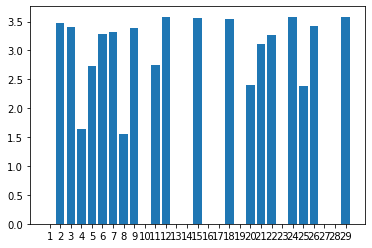

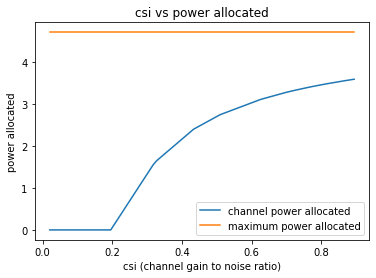

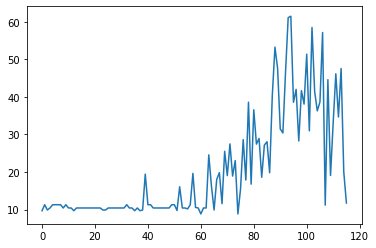

116
Power Allocated= 0
CSI= 0.021527228947933352
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9340458360064283
CSI= 0.3207719338389622
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6598802225654348
CSI= 0.7185738870266816
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.415030736446157
CSI= 0.3792914709307561
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.49337242601122355
CSI= 0.21938710053100885
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.058507
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.526720

Power Allocated= 3.953358170598235
CSI= 0.9106079901803336
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Po

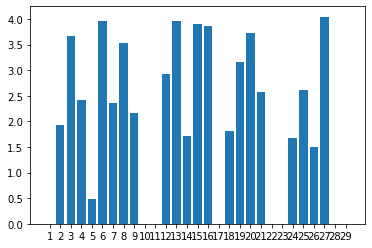

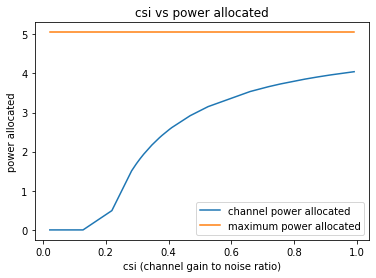

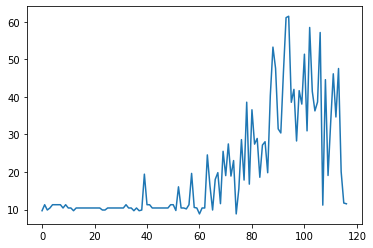

117
Power Allocated= 0
CSI= 0.17687753543157747
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2386779104271057
CSI= 0.9308650633084994
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.424220
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.780138

Power Allocated= 0
CSI= 0.023215131266382083
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.490090790105034
CSI= 0.5485894815329491
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.564616230954041
CSI= 0.5719739936225621
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.208215791581467
CSI= 0.9051971814279165
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.983238
Model client6 Train Epoc

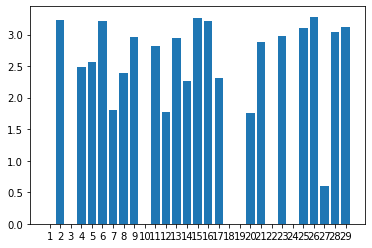

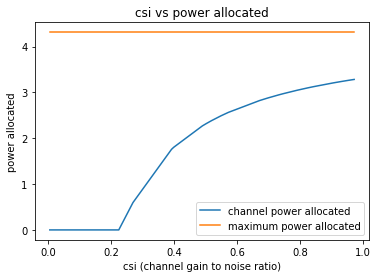

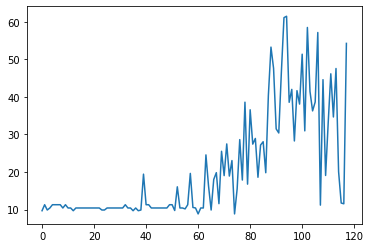

118
Power Allocated= 0
CSI= 0.19756218454141117
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4823058445569517
CSI= 0.973254582957338
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4605699179561453
CSI= 0.9530923058247995
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4938992168255307
CSI= 0.9843614309412987
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.037738537550568996
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6132281122751881
CSI= 0.34523733246139954
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9531083115872807
CSI= 0.6423936411200486
SNR= 7.831999

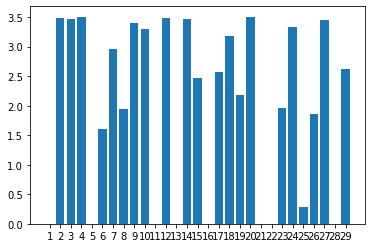

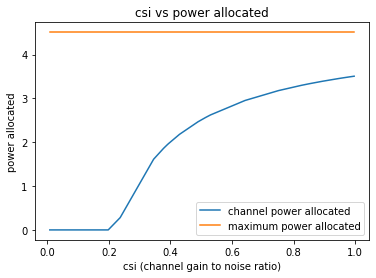

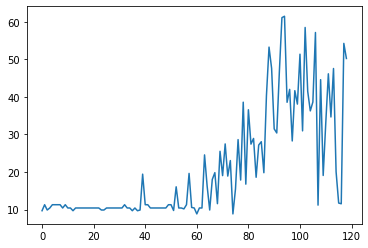

119
Power Allocated= 1.5027242875488098
CSI= 0.3081509403373298
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09721593500383552
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3489993074787692
CSI= 0.2942138824535656
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.580170087555655
CSI= 0.8563718024981002
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8936824145395237
CSI= 0.5393147580711064
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1080233460397597
CSI= 0.37880741547026275
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.004841
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.041385

Pow

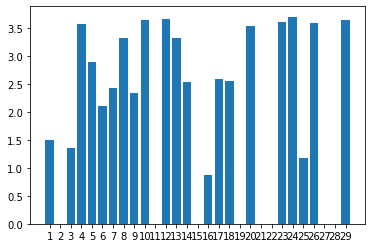

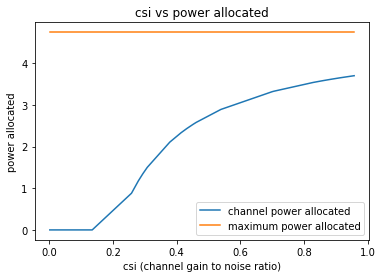

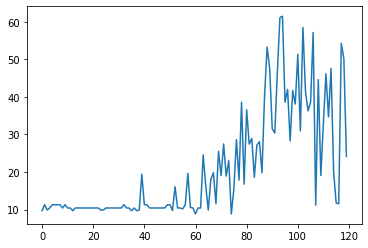

120
Power Allocated= 1.9216271224409596
CSI= 0.48144202585653073
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.33989799924045
CSI= 0.6028372861576823
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.271220735345765
CSI= 0.5788713103562639
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.291632
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.248842

Power Allocated= 2.8063490061559224
CSI= 0.8386648633312199
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.210922940262849
CSI= 0.5593474748813589
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.689058096337787
CSI= 0.7635556051153338
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in thi

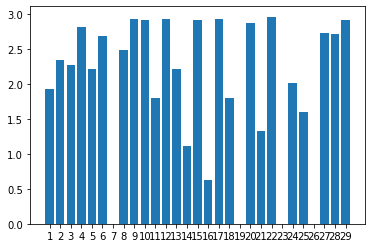

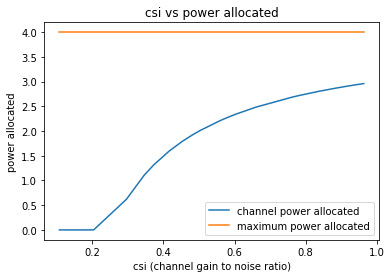

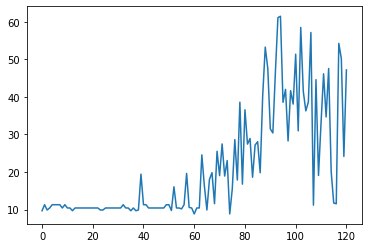

121
Power Allocated= 3.1233849043372572
CSI= 0.6967032331752977
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.433075
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.105885

Power Allocated= 0.015014813905912305
CSI= 0.22008488248037517
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.648963
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.502850

Power Allocated= 3.41935446925387
CSI= 0.8776843345938864
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1475575480636215
CSI= 0.4147383549529342
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.069822
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.137189

Power Allocated= 2.5994221718473582
CSI= 0.5103879010504869
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.490502
Model client5 Train Epoch: 2 [0/320 (0

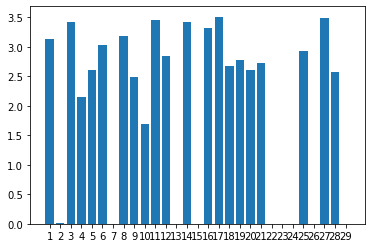

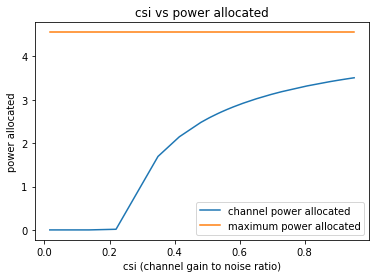

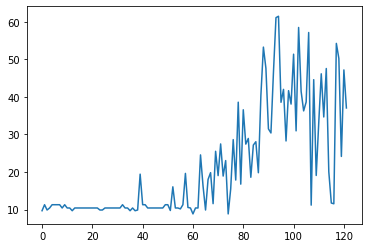

122
Power Allocated= 0
CSI= 0.024824436449795706
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3284736886253077
CSI= 0.24538307582860786
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6673656124287963
CSI= 0.5759145328520493
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3975313392295257
CSI= 0.9938352128305372
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0182052187899533
CSI= 0.295374801485462
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.000383499110257
CSI= 0.29382806501389136
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.35616538816035
CSI= 0.9545910774797766

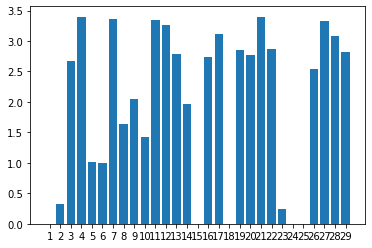

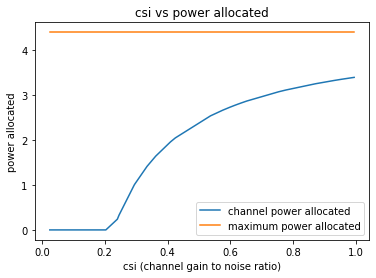

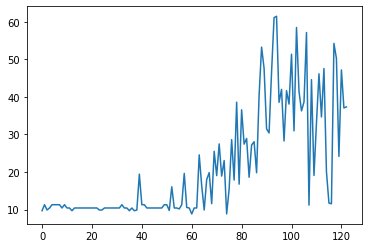

123
Power Allocated= 2.21329103656933
CSI= 0.4029032376973364
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.121382
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.004284

Power Allocated= 2.7494600363938533
CSI= 0.5139230714139524
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6474395572031639
CSI= 0.247045521185137
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 3.592073
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.252090

Power Allocated= 2.748887284391789
CSI= 0.513771842431657
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1495691099580625
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7975761043481806
CSI= 0.5269535565259702
SNR= 7.275378717720197
Client: client6
Poor Channel, 

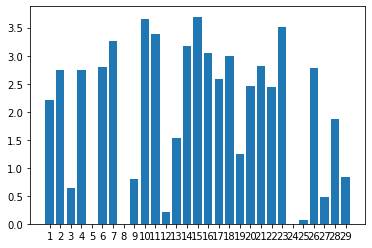

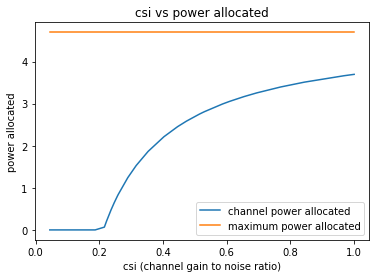

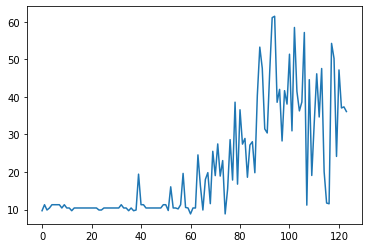

124
Power Allocated= 1.5914741909504806
CSI= 0.33142811805453165
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4481578198773395
CSI= 0.861651600949849
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.962798
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.121842

Power Allocated= 2.321001401603283
CSI= 0.43711675590478893
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4973598725707538
CSI= 0.8997985867557972
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1555514825291463
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.005154097748876207
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0


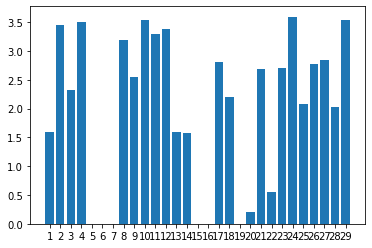

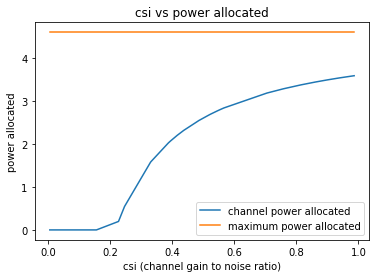

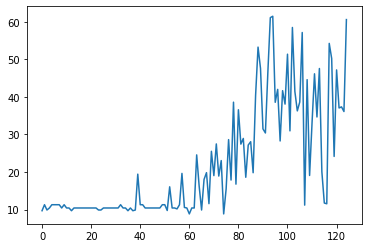

125
Power Allocated= 2.197014354849586
CSI= 0.4112975839484777
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.499173
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.006846

Power Allocated= 1.1298330603882931
CSI= 0.28583589515639907
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4162355418301233
CSI= 0.8250086953662943
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13918457353764635
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1159945929261188
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08132192293817775
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.967554329769266
C

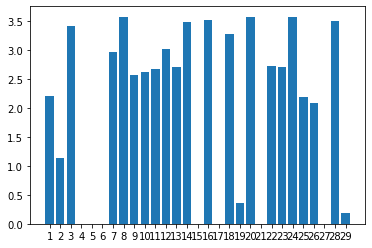

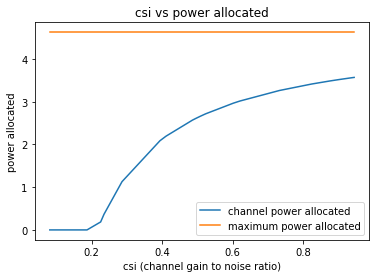

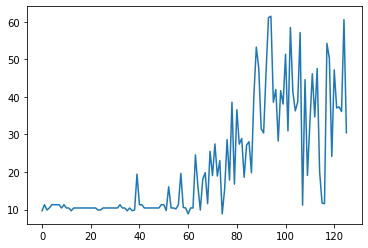

126
Power Allocated= 2.9712483632829585
CSI= 0.7490564095285579
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.11605095800422482
CSI= 0.23865150372959243
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.666853
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.265503

Power Allocated= 3.293191894103006
CSI= 0.9870991960605097
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.258241
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.192867

Power Allocated= 3.231359925740982
CSI= 0.9303179066333238
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15216307112171257
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2535624498997024
CSI= 0.3275789875826354
SNR= 7.275378717720197
Client: client6
Poor Cha

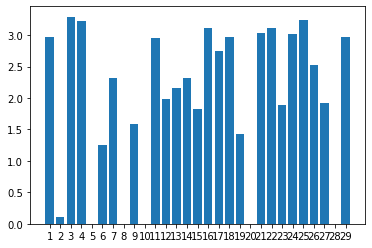

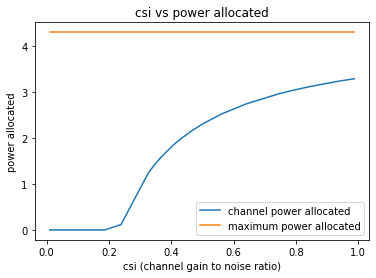

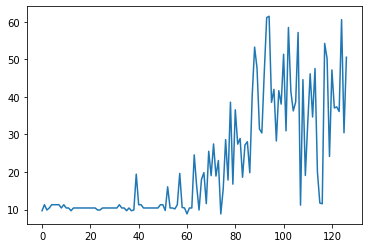

127
Power Allocated= 3.7857030887419207
CSI= 0.9095086532190075
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8332218991964213
CSI= 0.950592072706822
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.758520960239796
CSI= 0.24232573244515243
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7748634319705086
CSI= 0.32150883648984596
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7487284387903683
CSI= 0.4680619317613268
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.848990835997607
CSI= 0.9650581264086766
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13418838149665935

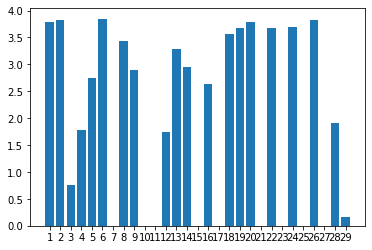

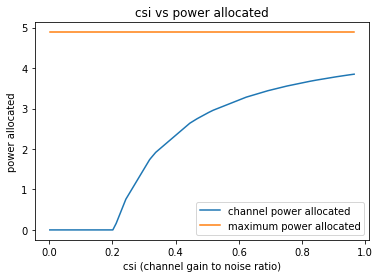

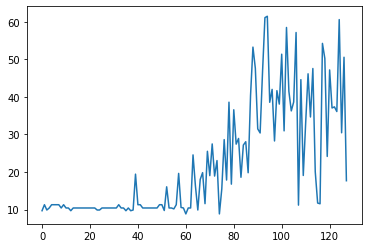

128
Power Allocated= 0
CSI= 0.20168006556361762
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.017246223782644177
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.217533862193426
CSI= 0.9203837459833607
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9500398480639336
CSI= 0.7385538887935471
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.159069739424144
CSI= 0.8733872759618704
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.289134730021379
CSI= 0.9853163653712541
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.249533621162541
CSI= 0.9483135311334676
SNR= 7.8319996355

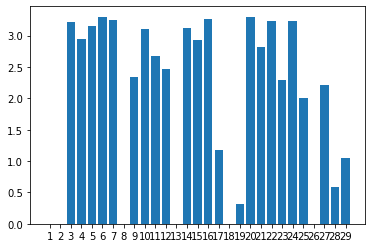

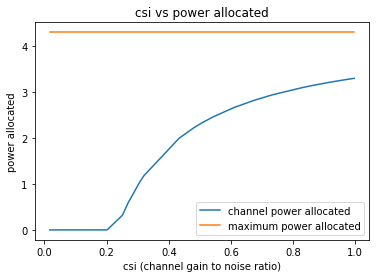

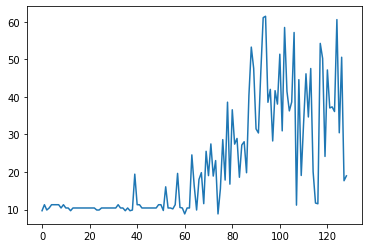

129
Power Allocated= 3.107152469512509
CSI= 0.7960325580663627
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.380644
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.010940

Power Allocated= 2.2405404078241586
CSI= 0.4710665981517643
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.31246317057726
CSI= 0.9515478282753056
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.344235978797217
CSI= 0.9812131866959574
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1797740127211025
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.584157276775195
CSI= 0.5620423936538121
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.380047
Model client

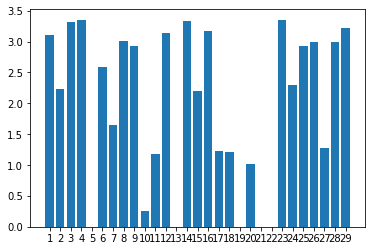

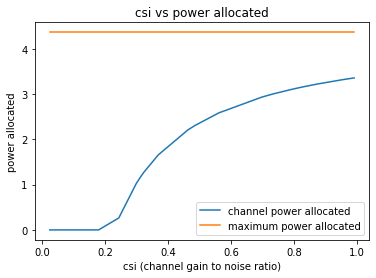

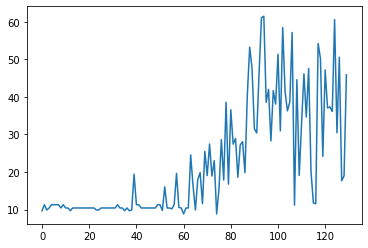

130
Power Allocated= 0.19746386705435715
CSI= 0.24487449575754017
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.240586
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001212

Power Allocated= 3.091954213461399
CSI= 0.8408772322716882
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15378646425395082
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1122880313836054
CSI= 0.8555048636317512
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.08979301335038
CSI= 0.8393518747793227
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.243198
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.154425

Power Allocated= 1.3131478080592136
CSI= 0.33692260921296024
SNR= 7.275378717720197
Client: client6
Model cl

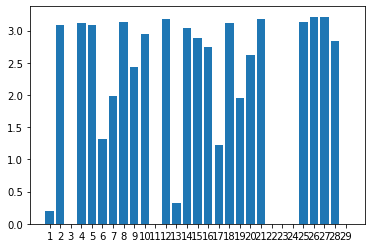

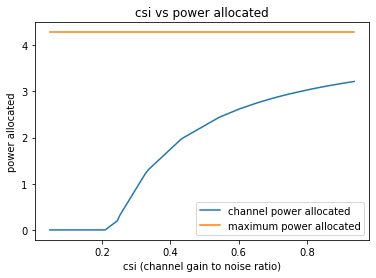

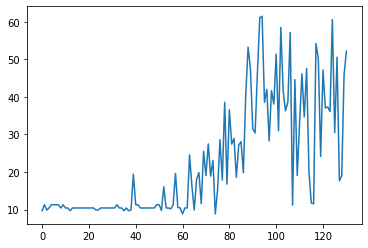

131
Power Allocated= 0.3380663803617887
CSI= 0.23798063311677953
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.595628
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.242301

Power Allocated= 2.6052496428162577
CSI= 0.5168387771599499
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3493175241338458
CSI= 0.8397917083496236
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8953578725830864
CSI= 0.6080021177916711
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9941719091596934
CSI= 0.28201449114628774
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.245796
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.198613

Power Allocated= 3.067152789418693
CSI= 0.6789160334944991
SNR= 7.275378717720197
Client:

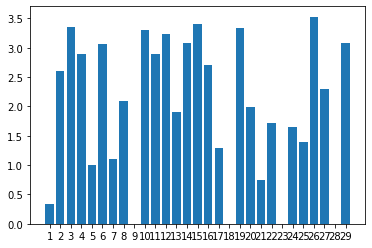

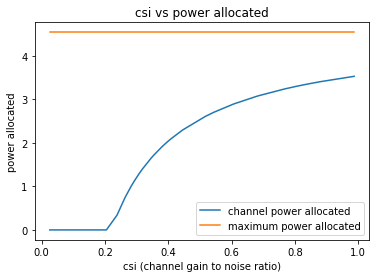

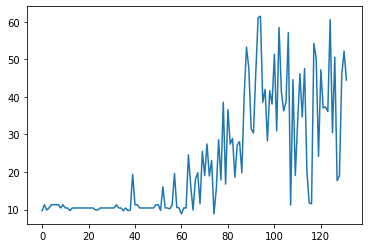

132
Power Allocated= 3.0683098483488385
CSI= 0.6470342811610502
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.397145399570466
CSI= 0.8219104127059205
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.152853300559812
CSI= 0.2889363626006318
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0014292220671097144
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2401291615450285
CSI= 0.2964110093589406
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3102351412630346
CSI= 0.7671136109087503
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.470768
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.441143

Pow

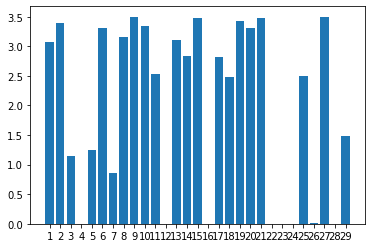

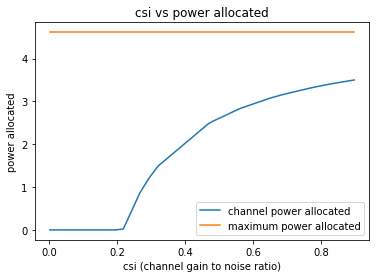

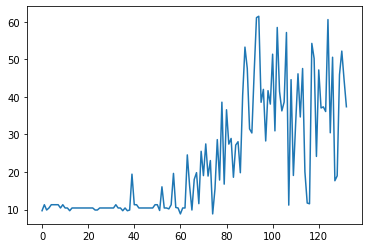

133
Power Allocated= 0
CSI= 0.16803007427576133
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2018716010318196
CSI= 0.7989275976300791
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4553407492788097
CSI= 0.3335324822813892
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.032939
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.305710

Power Allocated= 3.298190809439353
CSI= 0.8655320866172488
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.05306452384915694
CSI= 0.2272476807003343
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 3.355115
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.784796

Power Allocated= 3.1262147584779454
CSI= 0.7533894688263477
SNR= 7.275378717720197
Client: client6
Model cl

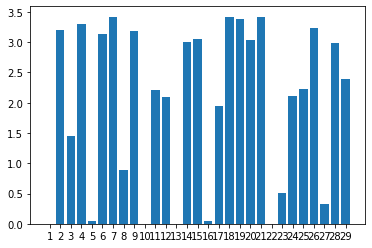

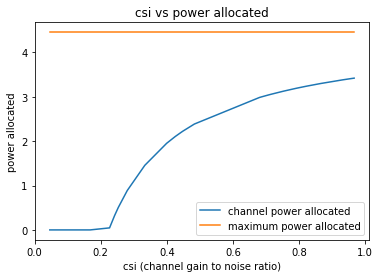

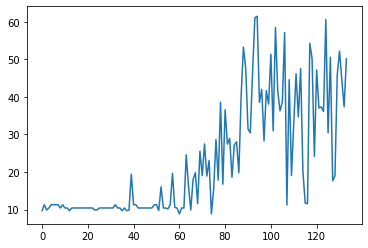

134
Power Allocated= 2.5034817315945657
CSI= 0.5929160372332904
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9365442781480553
CSI= 0.7977555010197704
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8624492355925564
CSI= 0.3005158108099719
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2265248192019431
CSI= 0.337434699621428
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.645544
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.320589

Power Allocated= 1.6338794752164123
CSI= 0.3912084966910928
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20821820062912233
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Powe

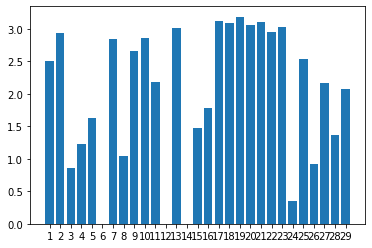

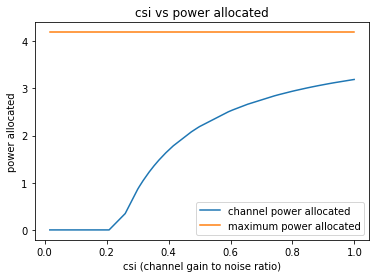

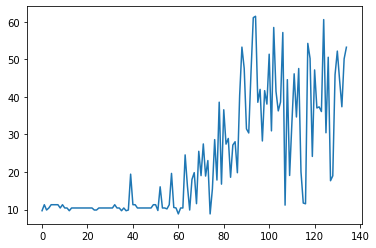

135
Power Allocated= 2.62451270761046
CSI= 0.8344392893269903
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.757696151766331
CSI= 0.9387678441148388
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.178023
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.182849

Power Allocated= 1.0456453828164953
CSI= 0.36006493078969815
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.625722575397152
CSI= 0.8352825582022418
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.986369
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.054931

Power Allocated= 2.276922257782325
CSI= 0.6468305371038251
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6441930871646795
CSI= 0.8483713125274515
SNR= 7.275378717720197
Client: clie

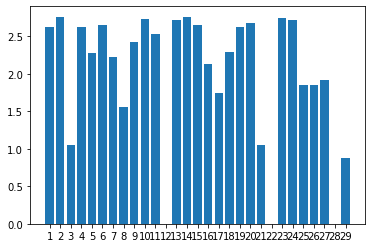

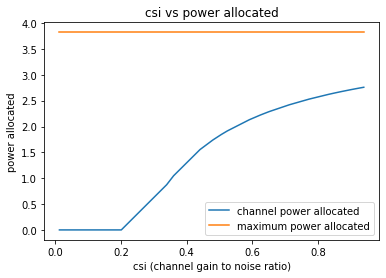

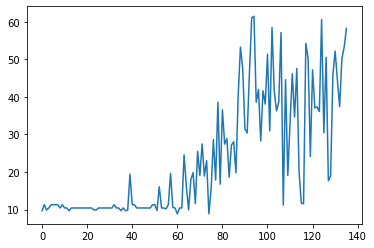

136
Power Allocated= 2.4928580391448283
CSI= 0.6537365819707351
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7227528590349057
CSI= 0.7693649421057736
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7675640807278459
CSI= 0.4434664401739544
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.664529
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.331122

Power Allocated= 2.8477596338532063
CSI= 0.8512329805985777
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6261241768384265
CSI= 0.716126174112554
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.779257236814689
CSI= 0.804331220923967
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in th

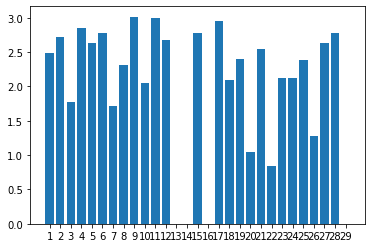

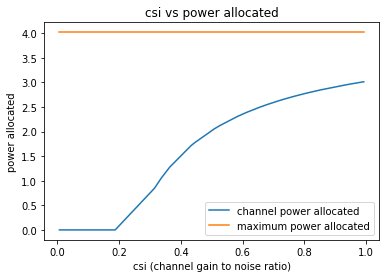

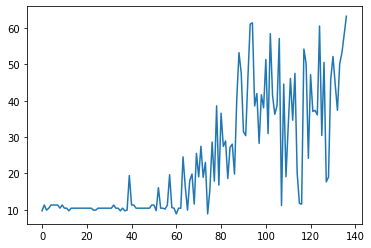

137
Power Allocated= 2.979757275277948
CSI= 0.4501396828089237
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05693357716626457
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08259124318437905
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9706698495966473
CSI= 0.23637196991981646
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.836525
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.057384

Power Allocated= 0
CSI= 0.19218453729573515
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.063025565393881
CSI= 0.8785305417330554
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2037340469542146


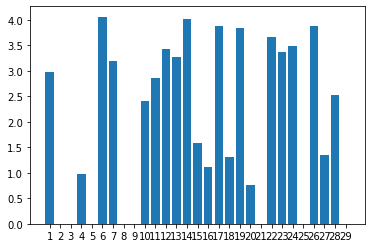

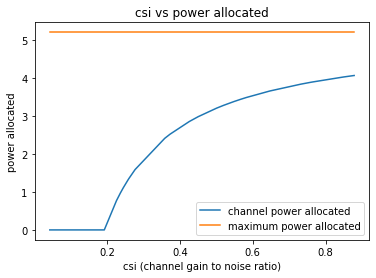

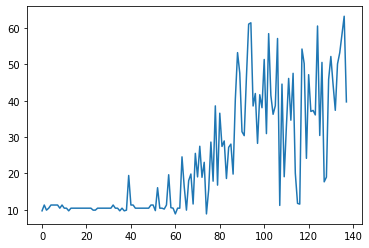

138
Power Allocated= 0
CSI= 0.1527485109585891
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.878124431562055
CSI= 0.5078242226083833
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8225709436722166
CSI= 0.9758584339397789
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5054730459595635
CSI= 0.7452471691498457
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.946896
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.020062

Power Allocated= 2.015860899437044
CSI= 0.353176078826428
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.259442
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.193534

Power Allocated= 3.322538811039383
CSI= 0.6558362170855575
SNR= 7.275378717720197
Client: client6
Model client6

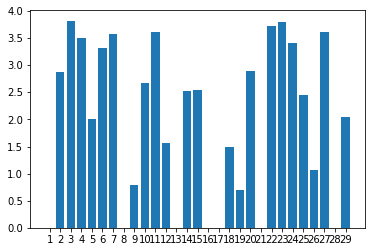

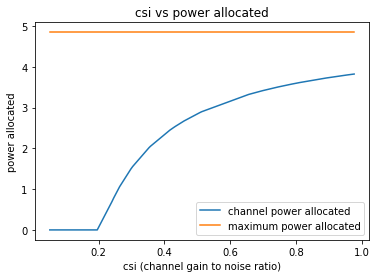

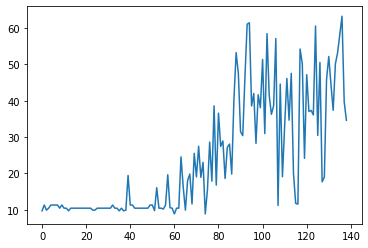

139
Power Allocated= 2.955115875879172
CSI= 0.7659064177509515
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.783661509949904
CSI= 0.6770036526257734
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2224203763188846
CSI= 0.9630774976440332
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.875304819441238
CSI= 0.7217852717744108
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.473863
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.010730

Power Allocated= 0
CSI= 0.16311896202033127
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.727000668848269
CSI= 0.65199344714649
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

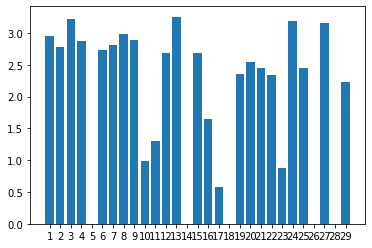

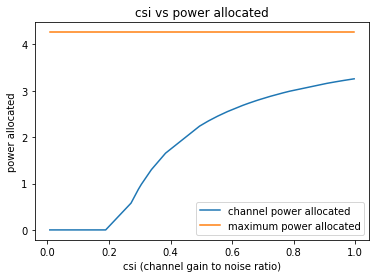

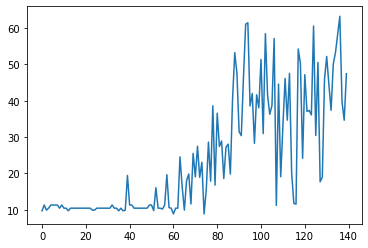

140
Power Allocated= 3.0714868413304797
CSI= 0.7092175448889527
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6453540220413534
CSI= 0.352592224038192
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.715672
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.197199

Power Allocated= 3.3034862143039563
CSI= 0.848892668630169
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1482629087230283
CSI= 0.7500589555928271
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1723914788809924
CSI= 0.7638836066242869
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.389144421870181
CSI= 0.32337897203109744
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in t

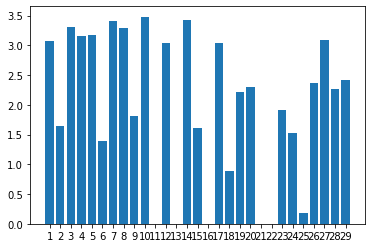

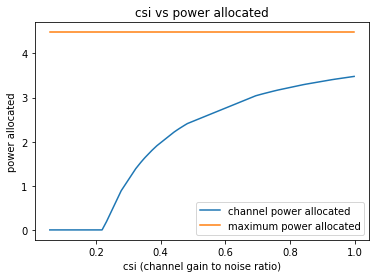

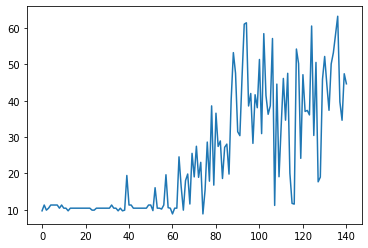

141
Power Allocated= 0.6674574061839236
CSI= 0.23137090559760443
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.021999
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.001836

Power Allocated= 0
CSI= 0.09996784803341552
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06522999633244175
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.325576532094212
CSI= 0.6009812322632603
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.776805913457321
CSI= 0.8245953096274681
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.002670
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.297515

Power Allocated= 3.7719737360468875
CSI= 0.8213226748305662
SNR= 7.275378717720197
Client: client6
Poor Channel, client not 

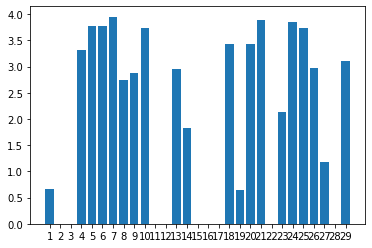

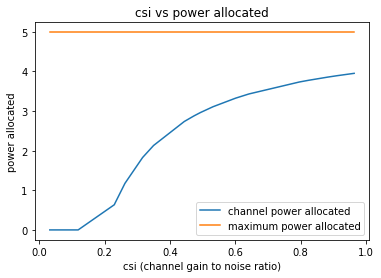

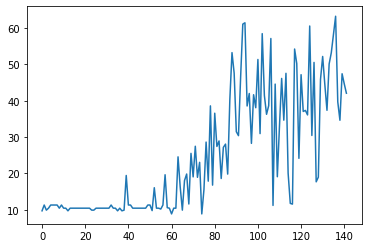

142
Power Allocated= 2.976664889110207
CSI= 0.9867385772723318
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.899018
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.014885

Power Allocated= 1.1498756068270026
CSI= 0.3520842943538678
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7473704712241513
CSI= 0.8046773839475033
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3863647101263528
CSI= 0.623542535336116
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.883795842245588
CSI= 0.903906840253009
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.063508
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.214300

Power Allocated= 0
CSI= 0.20302245435751398
SNR= 7.275378717720197
Client: client6
Poor Channel

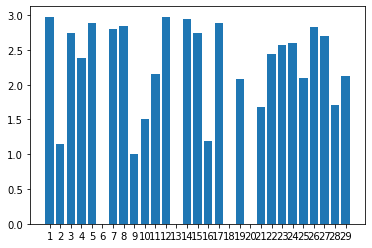

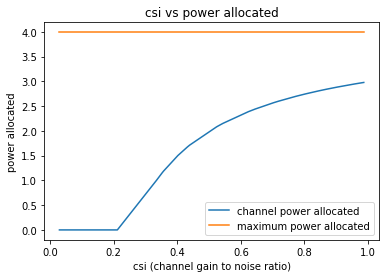

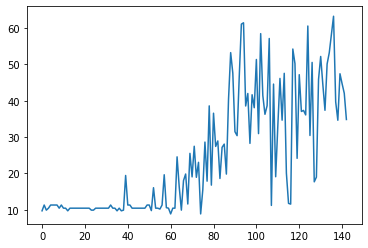

143
Power Allocated= 0
CSI= 0.16542500685146655
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17481620984260016
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12184848778866364
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.54348433249047
CSI= 0.9805762171266799
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.444237923753004
CSI= 0.8936111684633092
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3030679296523706
CSI= 0.7935091318129975
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.273128610711526
CSI= 0.7750951021501585
SNR= 7.831999635556276
Client: cli

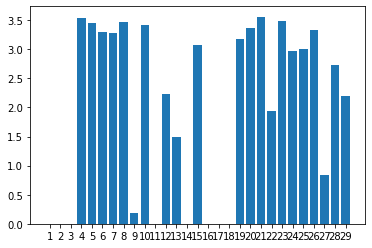

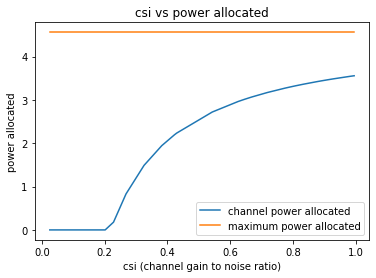

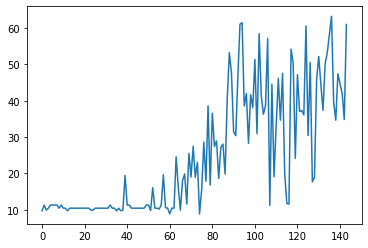

144
Power Allocated= 1.212511441095479
CSI= 0.30343043324055763
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.116309
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002654

Power Allocated= 1.9689292425285378
CSI= 0.3938200921511803
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.12579122120567732
CSI= 0.2281871068241479
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.130165
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 1.985846

Power Allocated= 3.0811429929685574
CSI= 0.7007626095700463
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3529312570713703
CSI= 0.8656296044601961
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.505544
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.139351

Power Allocated= 0.7473541503348939

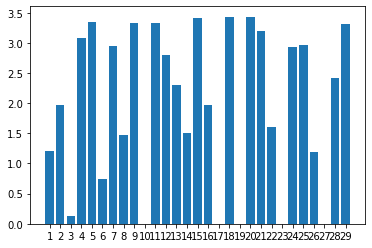

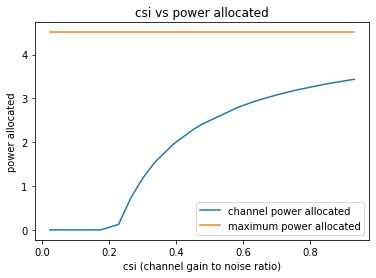

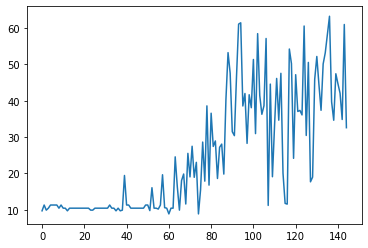

145
Power Allocated= 2.992936225455236
CSI= 0.6949743135737482
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.717329
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000004

Power Allocated= 2.9046561790212477
CSI= 0.6548007397977124
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2240952377060474
CSI= 0.45295125372986667
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3716412784401713
CSI= 0.9432208869039207
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.042717
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.239269

Power Allocated= 0.8660849505354129
CSI= 0.28044564347324086
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0710680115164855
CSI= 0.7348778768619719
SNR= 7.275378717720197
Client:

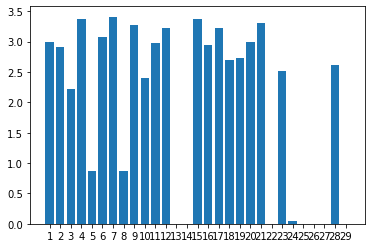

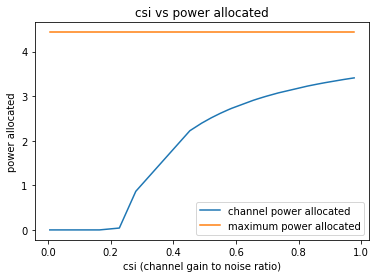

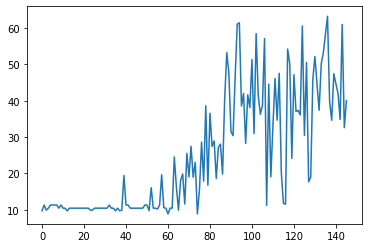

146
Power Allocated= 3.213006628634636
CSI= 0.9842147185086892
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.198528440743562
CSI= 0.4924854984531738
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8412096369096487
CSI= 0.41878932747012376
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.018735
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.172598

Power Allocated= 3.2264587100544655
CSI= 0.9974203004948936
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.470625
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.079307

Power Allocated= 3.0814361521973144
CSI= 0.8713769772619041
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.566488
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.149504

Power Allocated= 2.3718878529298384
C

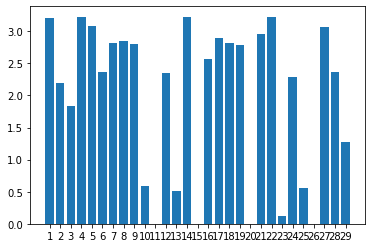

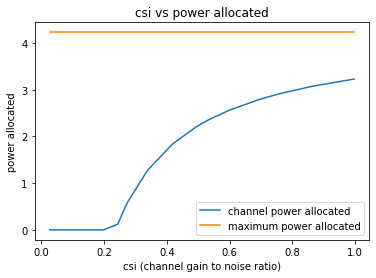

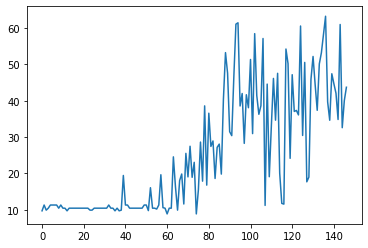

147
Power Allocated= 0.3966818734791575
CSI= 0.22208023072550798
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 3.771555
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.373614

Power Allocated= 3.7775878459327537
CSI= 0.8912884801027028
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6946089924766268
CSI= 0.31201734356842625
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7090867313503715
CSI= 0.8400027392467952
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.631771
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.046921

Power Allocated= 2.4137363228672872
CSI= 0.40228130237681514
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7531729364424677
CSI= 0.46589940108561934
SNR= 7.275378717720197
Clie

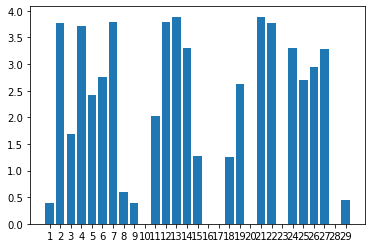

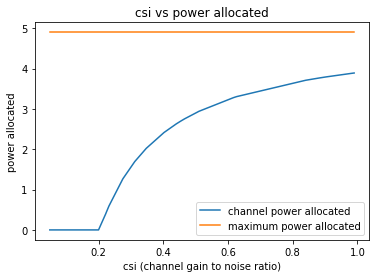

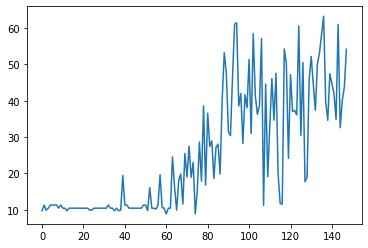

148
Power Allocated= 3.269294133112023
CSI= 0.876988511194045
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1307342044983404
CSI= 0.7819673808941346
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.359043796785378
CSI= 0.9519130380453501
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.336393395302098
CSI= 0.9318218295760683
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0733530612533283
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8204777841953357
CSI= 0.6292940898038143
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1286939228915562
CSI= 0.7807217910661808
SNR

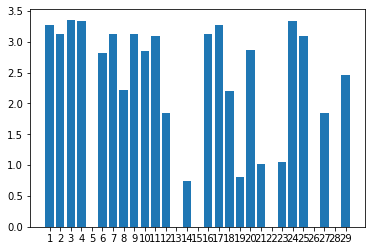

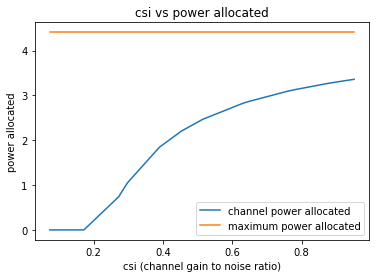

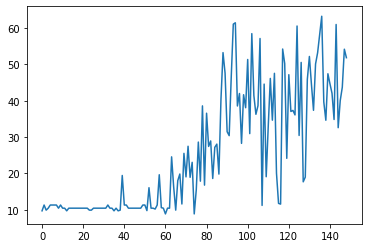

149
Power Allocated= 3.42364199415304
CSI= 0.720349814521176
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.25253246972801
CSI= 0.6413035620609633
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.222507
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.054130

Power Allocated= 1.634562226431476
CSI= 0.3147332103675198
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.713532
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.177259

Power Allocated= 2.8930237023403436
CSI= 0.5211501731322222
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.502135
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.182129

Power Allocated= 1.6219038179475764
CSI= 0.3134842822345577
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.832794
Model client5 Train Epoch: 2 [0/320 (0%)]	Los

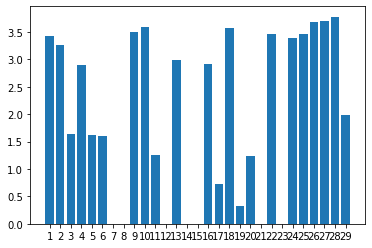

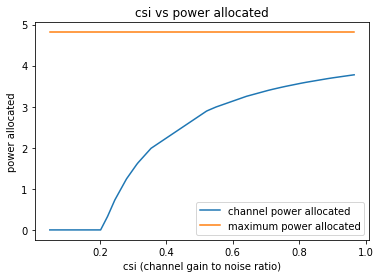

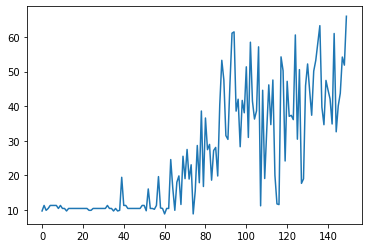

150
Power Allocated= 3.3849475587769264
CSI= 0.8075842185559048
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2329600838793
CSI= 0.7192959068194348
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.864183712266705
CSI= 0.5684968188978152
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08816433324723516
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.046574304179255
CSI= 0.634262531155694
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.05049467319079
CSI= 0.6358435836773507
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.619416576913408
CSI= 0.9962223946237461
SNR= 7.

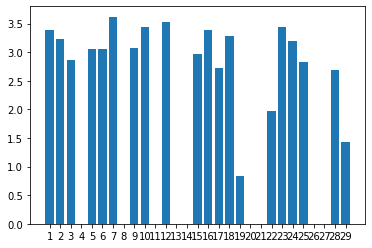

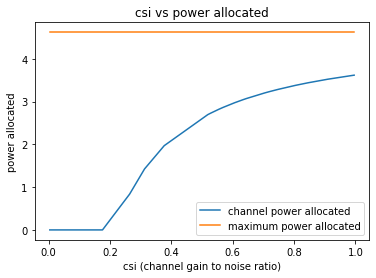

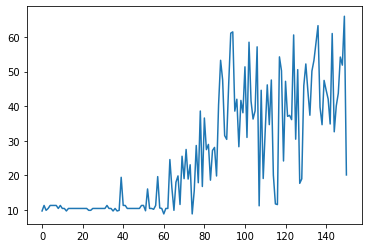

151
Power Allocated= 2.9377887107953087
CSI= 0.6528758460257366
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9482297995887254
CSI= 0.6573568734215521
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3236319051749703
CSI= 0.8727209834129671
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8208613114214907
CSI= 0.6065707929011641
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9776382433355568
CSI= 0.28638235415903013
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3231856970776557
CSI= 0.8723812649148257
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7270339268613486
CSI= 

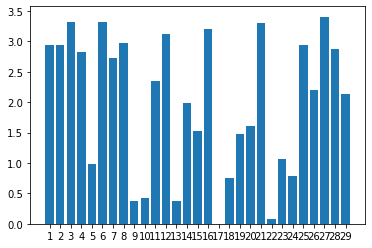

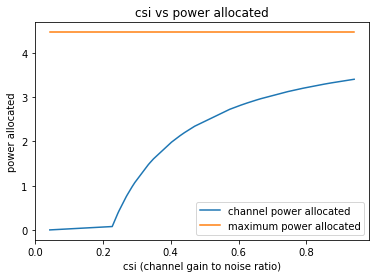

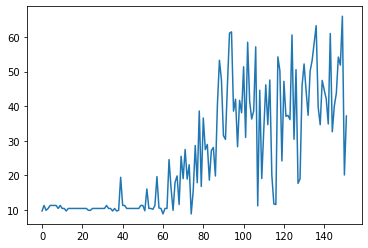

152
Power Allocated= 2.4361656867832755
CSI= 0.5831126988872385
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1243613339219873
CSI= 0.9739576316819162
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19139917884291202
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1434529688093527
CSI= 0.992410961229107
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.174806434669874
CSI= 0.5059976900892511
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11686338187787393
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9556078210021095
CSI= 0.8364755394007799
SNR= 7.831999635

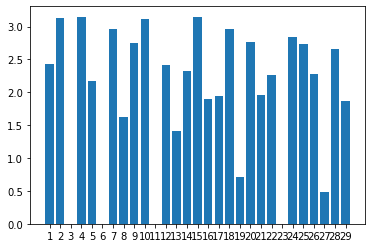

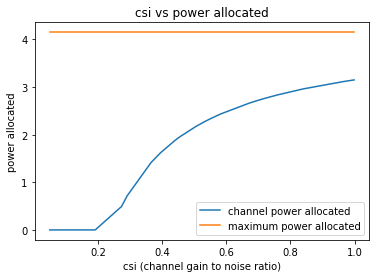

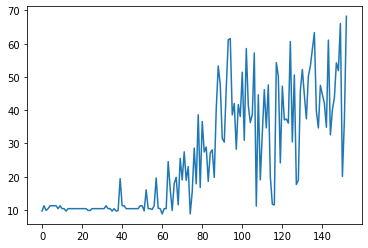

153
Power Allocated= 2.9664200470798425
CSI= 0.7922251854689538
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.182099647131942
CSI= 0.9554860378593298
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.667546
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.425297

Power Allocated= 2.855042545604779
CSI= 0.7279901974442908
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.135565144921784
CSI= 0.323297921176831
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03130637578285267
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.041294816145986
CSI= 0.8421814323297672
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

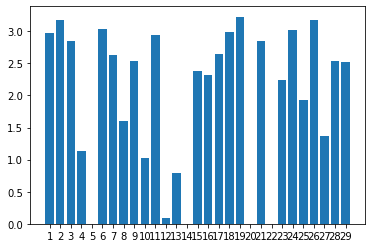

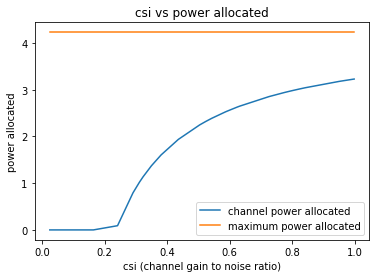

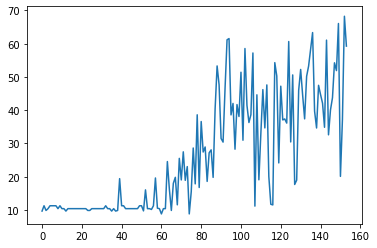

154
Power Allocated= 2.381805580828087
CSI= 0.49552697126925505
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.319055079849925
CSI= 0.48058343798474734
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5086296899297693
CSI= 0.25698818233520093
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.435909
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.514164

Power Allocated= 2.4807436691613876
CSI= 0.5210733703015415
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08694161618453244
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06348352373605193
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0

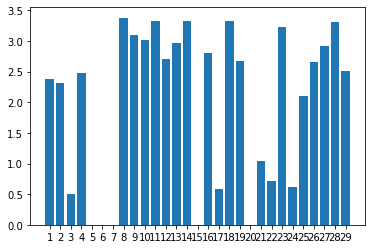

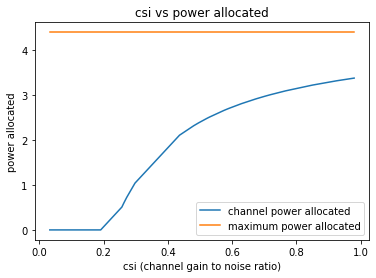

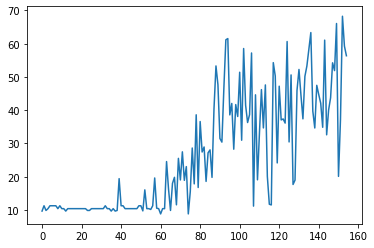

155
Power Allocated= 0.8112768202412086
CSI= 0.30630691675120647
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.462129868353906
CSI= 0.619637683392689
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9654136319615807
CSI= 0.4738073236477133
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3823069186418424
CSI= 0.37124082317543317
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8595311046534966
CSI= 0.8220675202420205
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.949773655372931
CSI= 0.8879397476561103
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.909358
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss

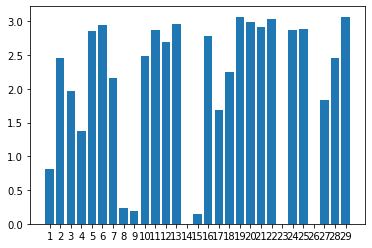

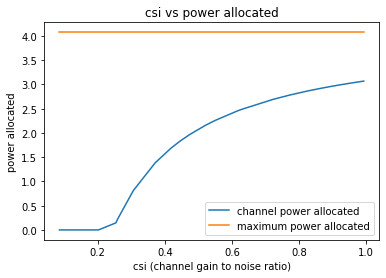

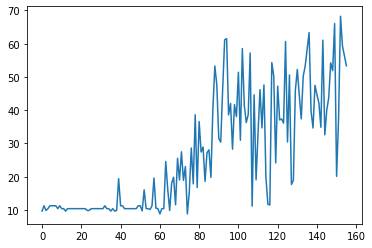

156
Power Allocated= 2.9876469399719845
CSI= 0.5443033754660309
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.68823615893509
CSI= 0.4680286126326979
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9379572594163608
CSI= 0.5299696773292
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.273227
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.237799

Power Allocated= 0
CSI= 0.023425518164601034
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.004628640363114
CSI= 0.3545811317668657
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.415137374112869
CSI= 0.7093605768881918
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power All

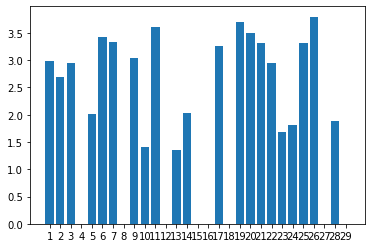

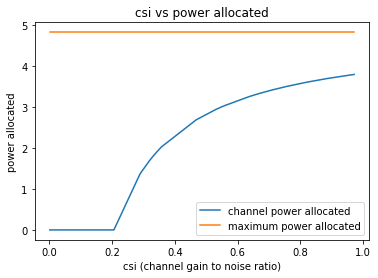

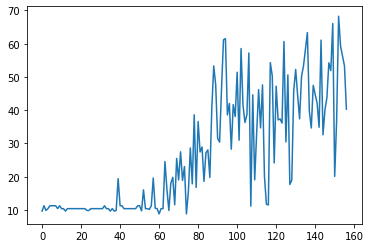

157
Power Allocated= 3.251776085628231
CSI= 0.8354091223487643
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8831410036480491
CSI= 0.38976426453156454
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.20782393148453
CSI= 0.8058209636143053
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.277432899425217
CSI= 0.8537074330852822
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.731935163309063
CSI= 0.5824589414124142
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.197750797236358
CSI= 0.44423840085204724
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3646930337258834
CSI= 0.922

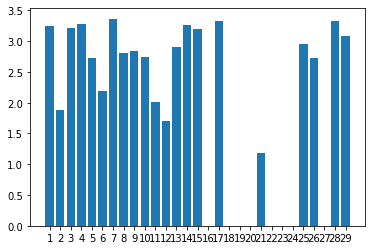

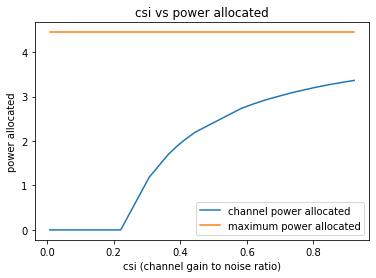

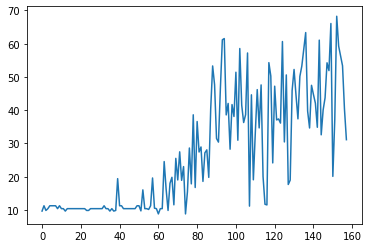

158
Power Allocated= 2.6611740699193183
CSI= 0.5943546291680432
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.413640054280501
CSI= 0.5181263346201938
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2653695409836097
CSI= 0.9273842118598397
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6266419295998777
CSI= 0.2690320436465664
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.146842
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.160650

Power Allocated= 0.6747879952171427
CSI= 0.2725625005875648
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8638676669626606
CSI= 0.6757653497394195
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in 

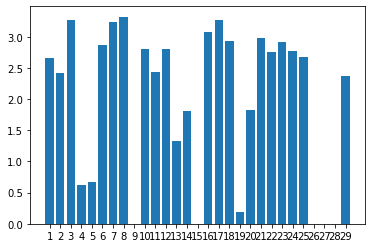

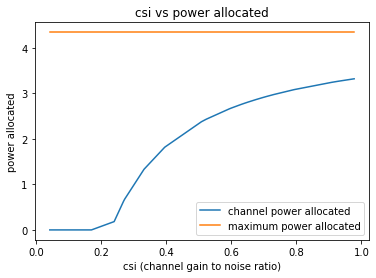

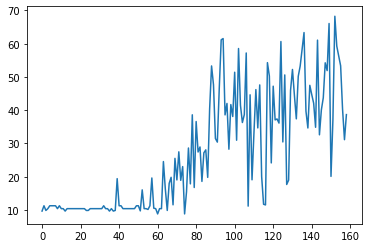

159
Power Allocated= 2.962088864811089
CSI= 0.9611015534234398
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5416363796342942
CSI= 0.6844977135423956
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4569051261822707
CSI= 0.6469742736606041
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9954102631656525
CSI= 0.9928994027586312
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.086421
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.011811

Power Allocated= 2.019663172559873
CSI= 0.5043122563751236
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.028530
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.066398

Power Allocated= 1.845024983580147
CSI= 0.46349154591626296
SNR= 7.275378717720197
Client: cl

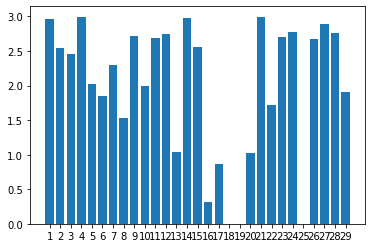

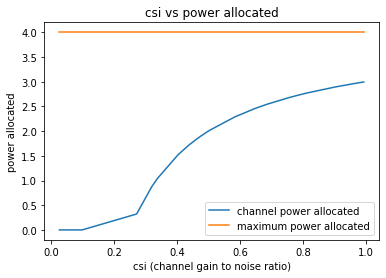

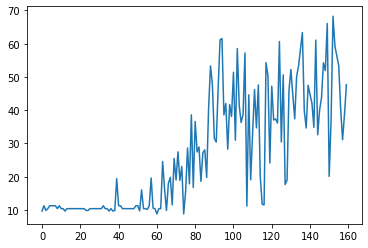

160
Power Allocated= 1.2231472353893578
CSI= 0.29838114673368143
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3106191948121393
CSI= 0.7911729019879109
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.258399891571806
CSI= 0.4317480721173702
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.711496191751963
CSI= 0.53674870843846
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4801607493755116
CSI= 0.9137387935517087
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.043574246336013256
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2944691612489927
CSI= 0.4385779757284155


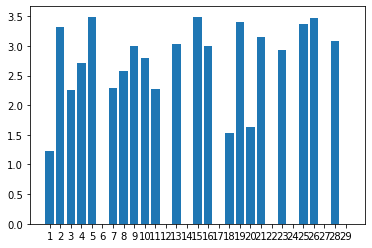

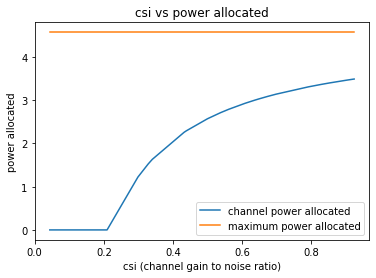

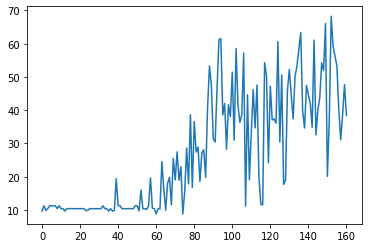

161
Power Allocated= 3.3423929605555234
CSI= 0.8701986354320796
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004047869740274046
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.015250229708347995
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14002893712017428
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2478045593745075
CSI= 0.44568218993603925
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9580031939691613
CSI= 0.6520806310721823
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2669916792622606
CSI= 0.8166170491649068
SNR= 7.831999635556276
Clie

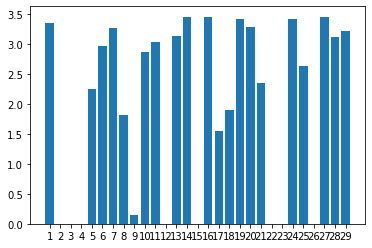

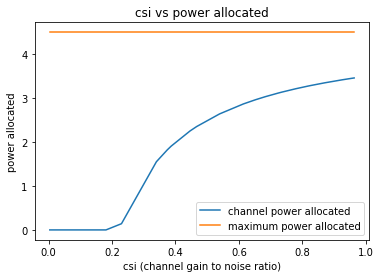

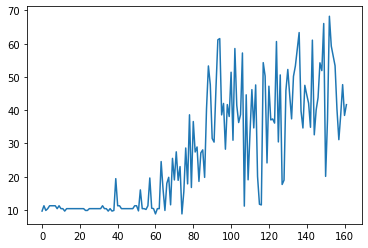

162
Power Allocated= 1.8935921235663788
CSI= 0.40103832128751016
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.306545
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.533084

Power Allocated= 2.5435020064966825
CSI= 0.542411887678437
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.68408453584604
CSI= 0.5871870334756973
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.470212298986845
CSI= 0.5216736848640475
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09318909990927127
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1598183945091599
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2744

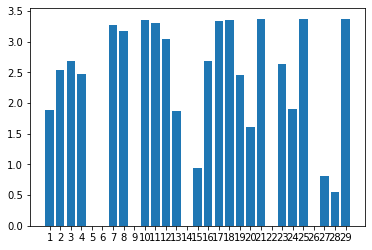

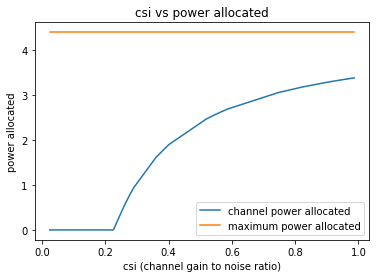

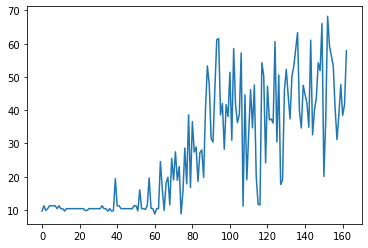

163
Power Allocated= 2.140881194048783
CSI= 0.40493398222685195
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9600064806959283
CSI= 0.27394160099514986
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.618642
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.297413

Power Allocated= 2.6642289688874055
CSI= 0.5138242937975077
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1809167293217095
CSI= 0.6995439161142707
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.476192
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.210280

Power Allocated= 0
CSI= 0.0332513329279277
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.277898517606245
CSI= 0.4287206789961231
SNR= 7.275378717720197
Client: client6
Poor Chan

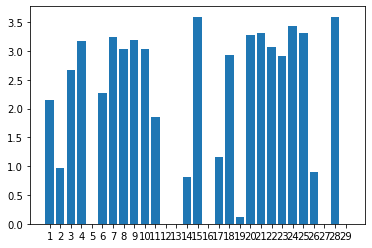

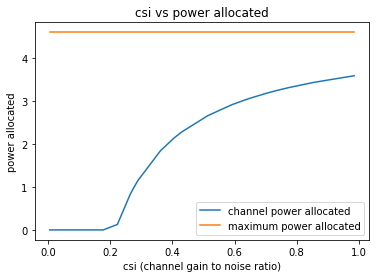

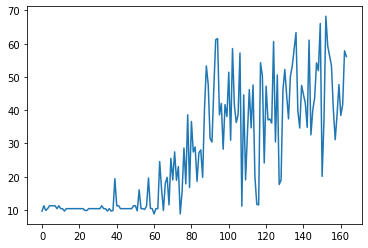

164
Power Allocated= 2.64934246955348
CSI= 0.427044980446295
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.006674
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.156969

Power Allocated= 3.5890831179716365
CSI= 0.7133008226865188
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.885194
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.873310

Power Allocated= 3.632387362945515
CSI= 0.7360362110317418
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.157234940063208
CSI= 0.3528853918293803
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.15642959391364197
CSI= 0.20684291905366303
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.215380
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.065720

Power Allocated= 3.9193737365591246
CSI

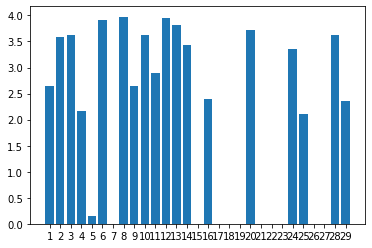

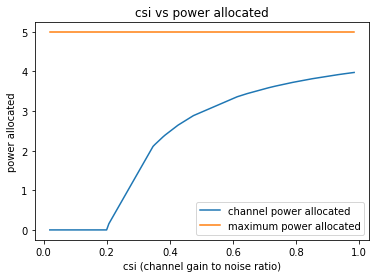

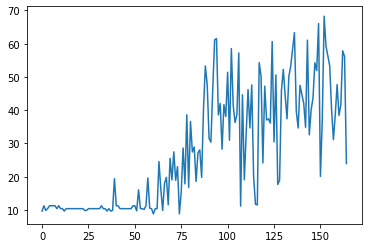

165
Power Allocated= 2.0003896738499383
CSI= 0.4620656356421725
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.230522
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.055662

Power Allocated= 0
CSI= 0.14197956792980793
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7758388841313493
CSI= 0.7200743454792603
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3348102051978472
CSI= 0.26111200185661787
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.359235
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.047871

Power Allocated= 2.925859066241088
CSI= 0.807281479880138
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09583509977414706
SNR= 7.275378717720197
Client: client6
Poor Channel, client not 

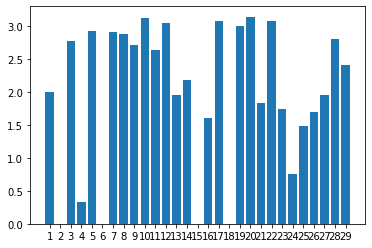

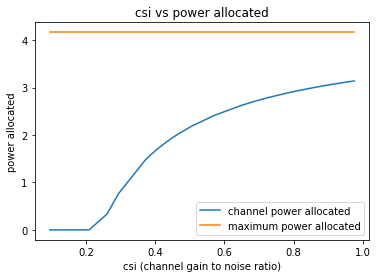

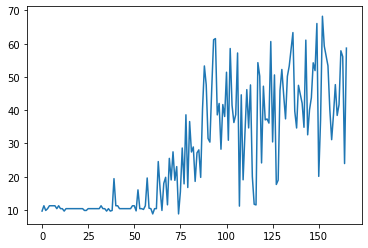

166
Power Allocated= 2.536252463947797
CSI= 0.48509575185869225
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9144895219741569
CSI= 0.27150218373195156
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6820738012679346
CSI= 0.34297935935875346
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06744793292217699
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.17472502654641
CSI= 0.41271558170027944
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.551878
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.074527

Power Allocated= 1.5395970148303175
CSI= 0.32699998299185484
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

P

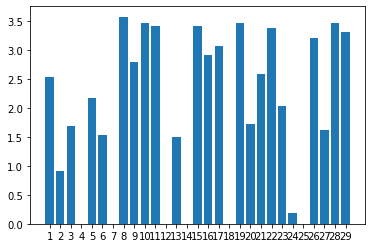

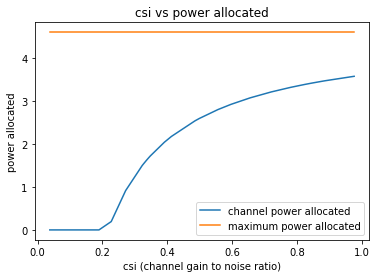

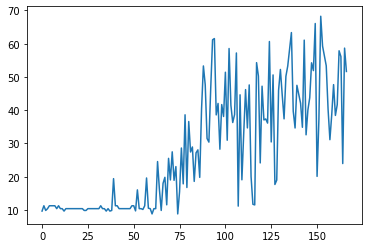

167
Power Allocated= 0
CSI= 0.05854654135324444
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8207756457693494
CSI= 0.9147212108706991
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.795355
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.021835

Power Allocated= 3.643570200434332
CSI= 0.7871321440747182
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7560530540415717
CSI= 0.8635937594429846
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0055438155621589935
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.515056266926856
CSI= 0.714822521962085
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.019183
Model client6 Train Epo

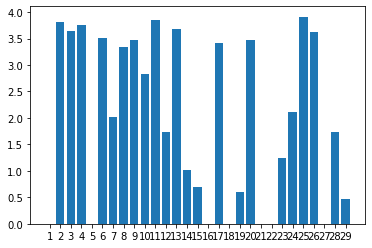

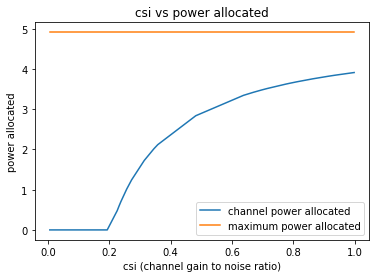

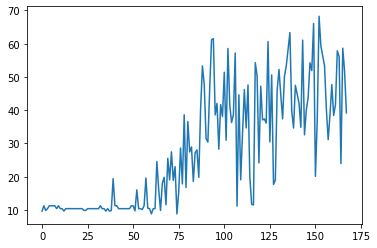

168
Power Allocated= 3.225618916640859
CSI= 0.7473336259025468
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2454855700761804
CSI= 0.7585965222339256
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3716318907585094
CSI= 0.8388716392343629
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.305635
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.154386

Power Allocated= 3.5121439857187817
CSI= 0.9509632045690548
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1410139302697978
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8287352950855
CSI= 0.5763774842364352
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

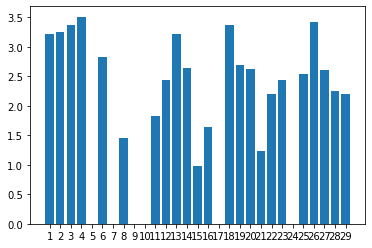

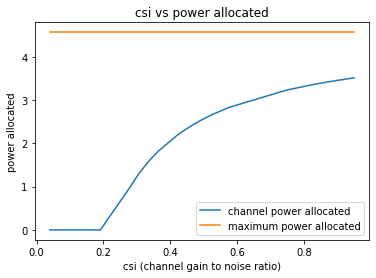

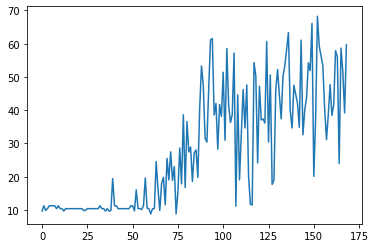

169
Power Allocated= 0
CSI= 0.1953694703409974
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2429257368740796
CSI= 0.9204260138959072
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01626847134327014
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.058933359564721344
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2693176041364955
CSI= 0.9433414388428865
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.448440
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.086821

Power Allocated= 2.9509890442058335
CSI= 0.7254840146073077
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.305588929960182


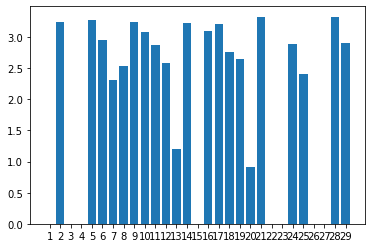

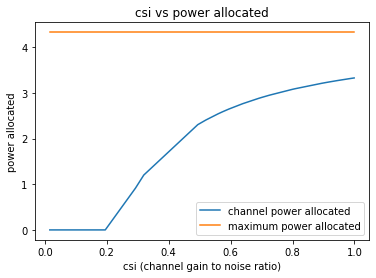

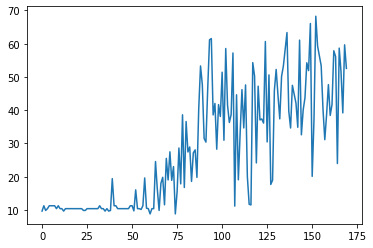

170
Power Allocated= 0.522958952265419
CSI= 0.28031971823948487
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6291213676168321
CSI= 0.2889177422009611
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 2.662433
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.464137

Power Allocated= 2.024648686629071
CSI= 0.4841054974528798
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6568817150530544
CSI= 0.6976261910215444
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.092770
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.217844

Power Allocated= 2.915037503530015
CSI= 0.8508635092923281
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20618296590322516
SNR= 7.275378717720197
Client: client6
Poor Chann

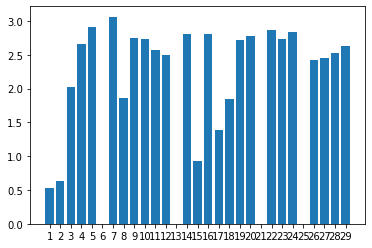

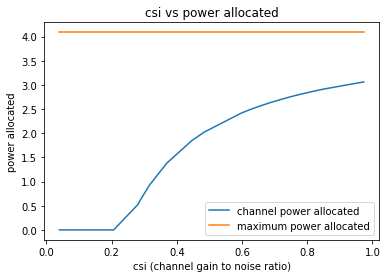

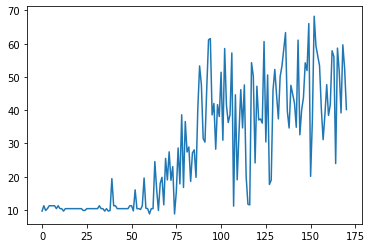

171
Power Allocated= 2.976375634134132
CSI= 0.8833237135153654
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.285539
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.022523

Power Allocated= 1.078018278242237
CSI= 0.32998452319026117
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.577099
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.031727

Power Allocated= 2.7559039236358824
CSI= 0.7393390027112906
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4485937060710095
CSI= 0.375958261882435
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.803568
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.307706

Power Allocated= 3.073127933090852
CSI= 0.9658704820505486
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 2.104897
Model client5 Train Epoch: 2 [0/320 (0%)]	

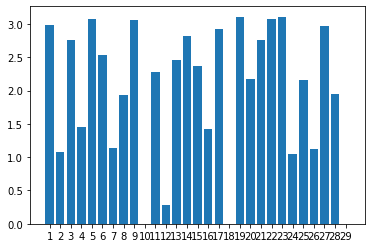

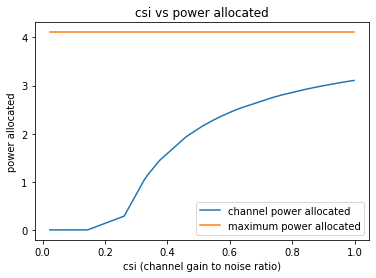

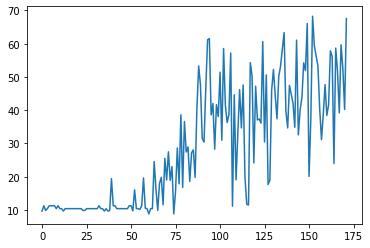

172
Power Allocated= 0
CSI= 0.1723521073939729
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3366524407083586
CSI= 0.9993870290243316
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11410555743260675
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.318653644350263
CSI= 0.49538986640909854
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.17817778830329
CSI= 0.8627472638535094
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0272198324361486
CSI= 0.7633320006994441
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1962279569515357
CSI= 0.3183661114257581
SNR= 7.8319996355

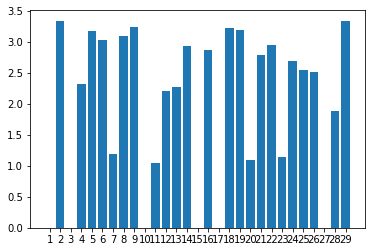

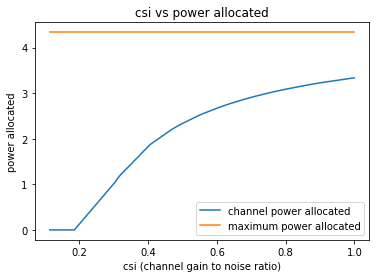

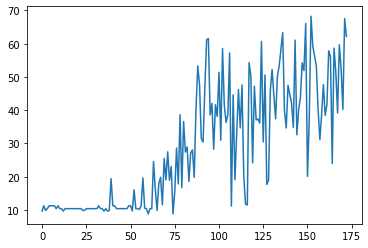

173
Power Allocated= 3.2795157658535006
CSI= 0.9440592997112639
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2666747880211155
CSI= 0.4826030127134122
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.663041601745797
CSI= 0.5967549688497984
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7522101578777747
CSI= 0.6302940357451271
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.160435992130539
CSI= 0.8486549009310398
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.21487721349014
CSI= 0.8897635885905307
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.25604738983507
CSI= 0.92359

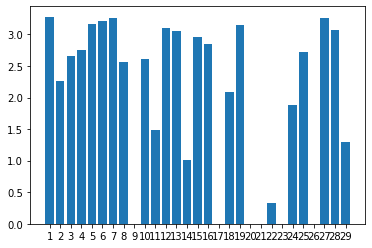

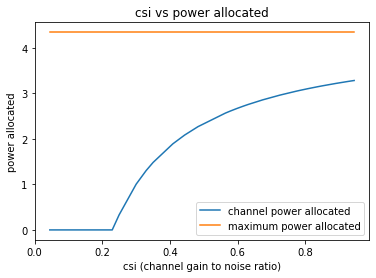

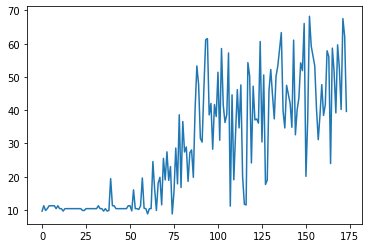

174
Power Allocated= 3.089384461423379
CSI= 0.7068565167692841
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.104343
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.144967

Power Allocated= 3.5038481129996812
CSI= 0.9997494459481898
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9568487014186733
CSI= 0.2819085184259641
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3122799666143177
CSI= 0.8390537478111649
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08053935606656992
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2288219280745665
CSI= 0.7841434883878333
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.335938
Model c

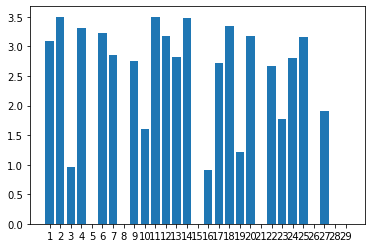

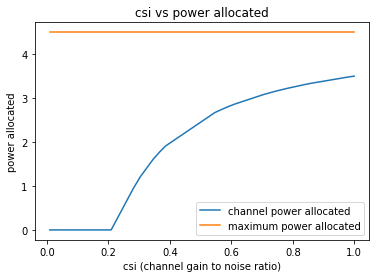

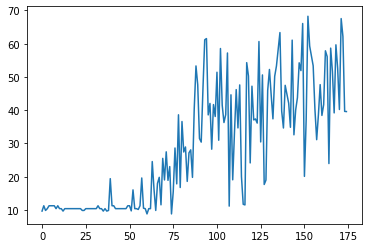

175
Power Allocated= 0
CSI= 0.18660053077179595
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06289662688836817
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9349497886855542
CSI= 0.9500453036557812
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04801614325358161
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7410164142935338
CSI= 0.3080226256802435
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7304489628587714
CSI= 0.7954929221593046
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.364246
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.183901

Power Allocated= 3.1379419803435677

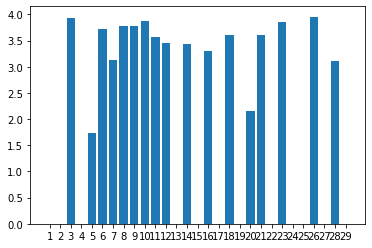

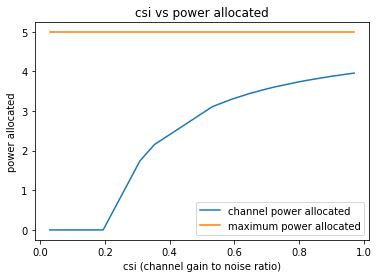

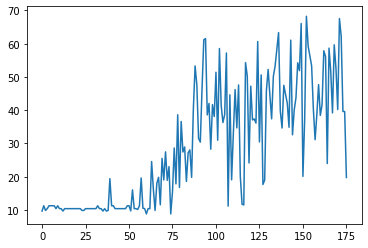

176
Power Allocated= 2.4485059661032276
CSI= 0.5504747095334663
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1062446128290514
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.483570077798992
CSI= 0.3595118124584503
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 1.672333
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.311471

Power Allocated= 2.024379565771223
CSI= 0.44628108268379263
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1034976095084534
CSI= 0.4626155214953577
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0950140050438897
CSI= 0.3154468806247106
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.319381
Model cl

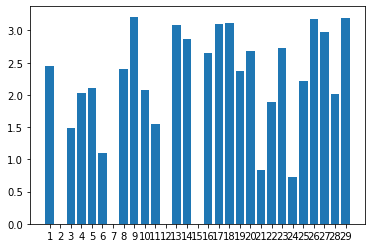

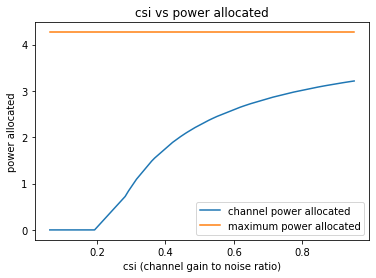

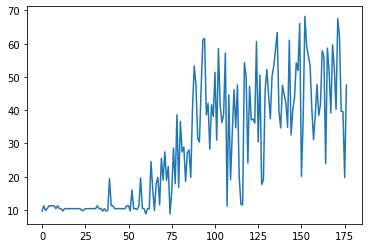

177
Power Allocated= 3.5703117689981516
CSI= 0.9218728595936507
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4183436821250344
CSI= 0.3089550909805461
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.329762
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.289359

Power Allocated= 3.5833646852631293
CSI= 0.933100984335142
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.437036418034811
CSI= 0.8210021329067217
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.677566
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.381044

Power Allocated= 3.0624363828814563
CSI= 0.6278947252093589
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.924080
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.485197

Power Allocated= 0
CSI= 0.004489798572

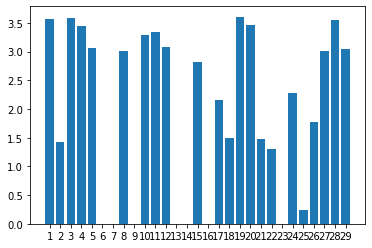

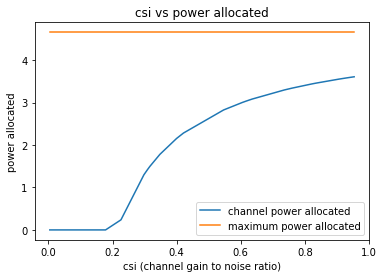

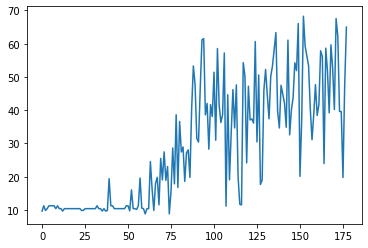

178
Power Allocated= 3.364361384990331
CSI= 0.9960388539514438
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.765758
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000275

Power Allocated= 2.8943566972732127
CSI= 0.6784345265405809
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8092990005965848
CSI= 0.3907716487354048
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0776071088865754
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8835885495997786
CSI= 0.6735141800345616
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.922338304903881
CSI= 0.6915629421682805
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power 

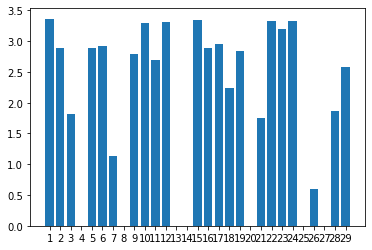

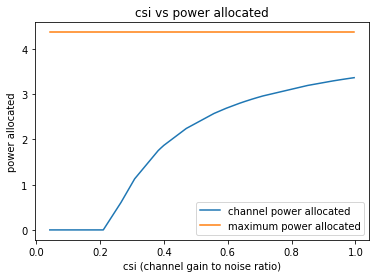

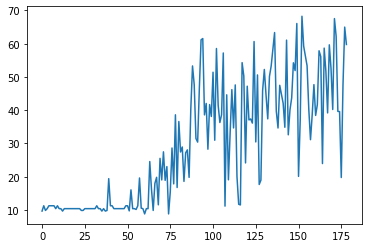

179
Power Allocated= 2.6441487236288577
CSI= 0.7263430073023447
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11341986034116847
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7424128851421132
CSI= 0.7821691463774035
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.939978
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.256059

Power Allocated= 1.7132668902923789
CSI= 0.4333428111755978
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.864561723166915
CSI= 0.8647923141519775
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.735320077578249
CSI= 0.7778537883916545
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power

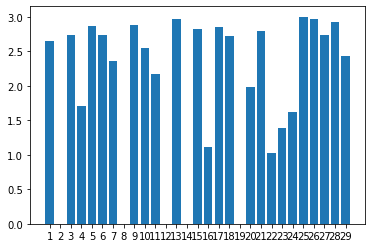

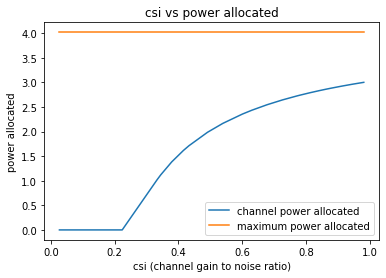

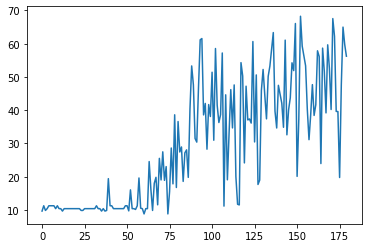

180
Power Allocated= 0.851923685391756
CSI= 0.24401663496400083
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05489865995623966
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7922898084661
CSI= 0.46345320600877815
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5253018840700148
CSI= 0.7019006443588743
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 3.053162
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.008106

Power Allocated= 0.9121274131411905
CSI= 0.24765486096852574
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8210240281202905
CSI= 0.8857545602545662
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Powe

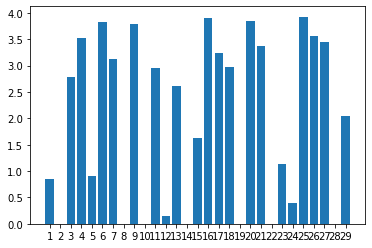

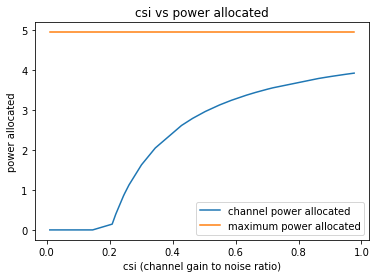

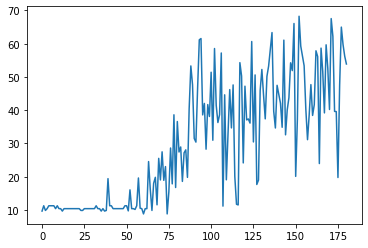

181
Power Allocated= 3.114613701138932
CSI= 0.8844945473548573
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5673081327007248
CSI= 0.5959849253673211
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01052898800000146
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0988662386849547
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20527803370802666
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9866111317613573
CSI= 0.7945387923142604
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.765011
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0.634458

Power Allocated= 0
CSI= 0.15065968082

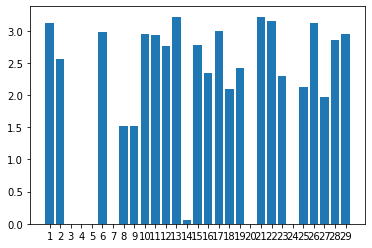

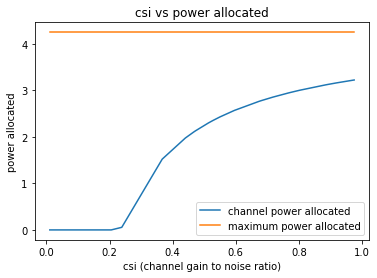

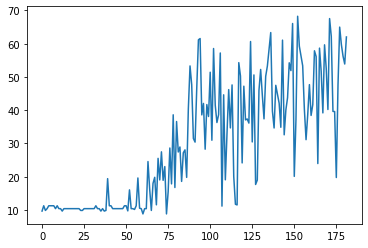

182
Power Allocated= 0.19643633652931802
CSI= 0.2510816633852635
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.887448
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000079

Power Allocated= 0
CSI= 0.015698769273835178
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.013932949802092032
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9838582655883203
CSI= 0.8365778513979016
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4829170033555248
CSI= 0.3708803616163058
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7787573330156063
CSI= 0.714057753138251
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 

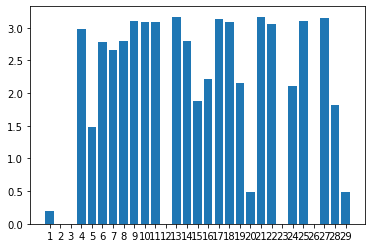

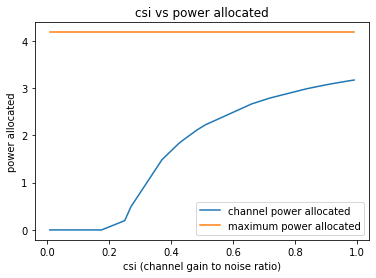

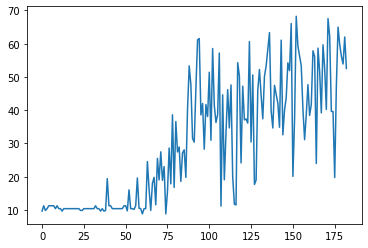

183
Power Allocated= 3.3919920151358216
CSI= 0.8610836522240516
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.643322672603416
CSI= 0.5235611147688218
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11369190557838393
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.277187344609067
CSI= 0.7836179801489856
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.332893280020178
CSI= 0.4503640110307423
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.266517
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.182406

Power Allocated= 2.052189733851966
CSI= 0.39981933987702567
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.325740
Model cli

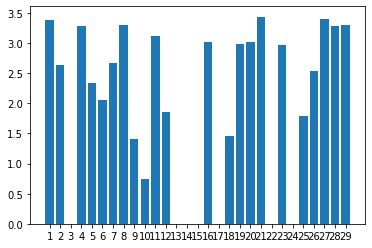

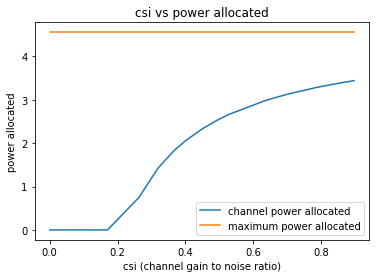

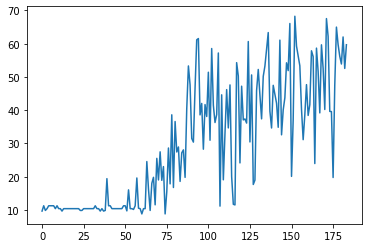

184
Power Allocated= 3.2543041931717456
CSI= 0.822930597122529
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004747345849261175
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1670436723455664
CSI= 0.7677956860484114
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4316527700025383
CSI= 0.9635575537548994
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6608646702929146
CSI= 0.5529111578876449
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8066887243604017
CSI= 0.37554668730352414
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4468757974140782
CSI= 0.97790167273088

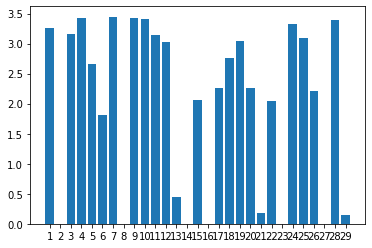

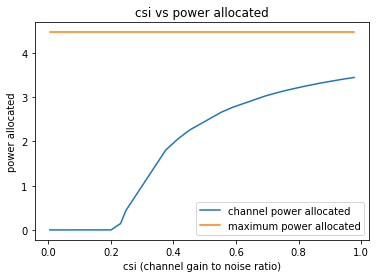

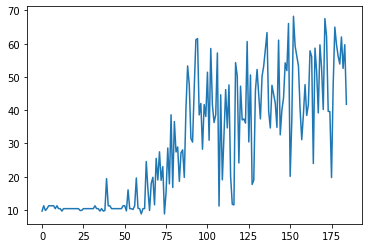

185
Power Allocated= 1.1440152045301986
CSI= 0.27013263668738263
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.005967881615618
CSI= 0.3521210467828625
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.946386
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.126874

Power Allocated= 0
CSI= 0.1649850598011262
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6098305785359184
CSI= 0.8090158082416732
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.430134157510026
CSI= 0.706331308366206
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.503288
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.212538

Power Allocated= 0.08005084926487704
CSI= 0.20982618020319233
SNR= 7.275378717720197
Client: client6
Model cli

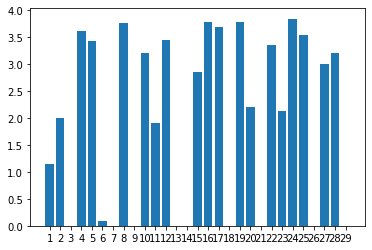

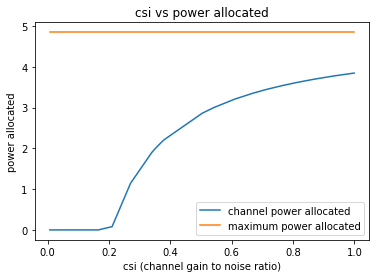

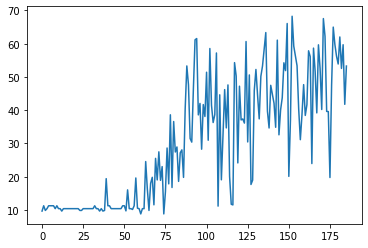

186
Power Allocated= 2.1987457085644797
CSI= 0.4999719510525048
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7088203904552213
CSI= 0.6711240397960654
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1954368419607935
CSI= 0.996590595120311
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0969055167737625
CSI= 0.9074802192529527
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12415802777725404
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.578947376673349
CSI= 0.6173180425871461
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.000030963756008
CSI= 0.4547879501900495
S

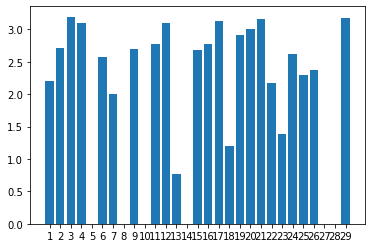

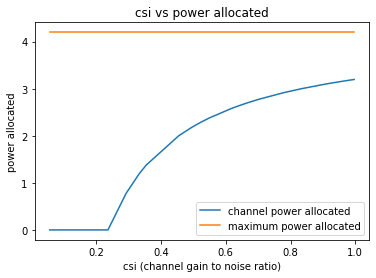

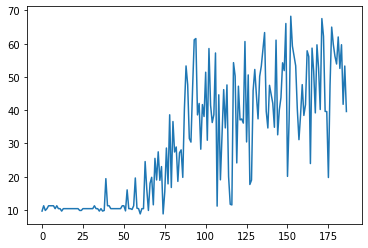

187
Power Allocated= 2.847653440399627
CSI= 0.6310829514642802
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5275290645388813
CSI= 0.5250164785157638
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5174602740662255
CSI= 0.3430801357964074
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1675150717814002
CSI= 0.7906912779924354
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3514442443732633
CSI= 0.9252517422670377
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.408602181279174
CSI= 0.976916437684126
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3218785790029157
CSI= 0.90

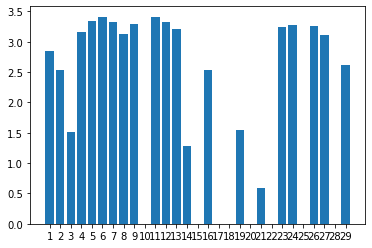

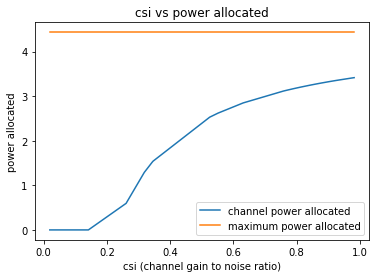

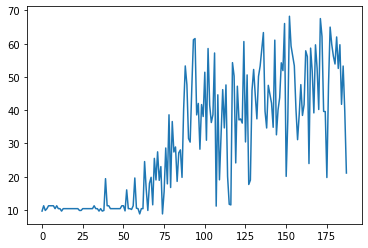

188
Power Allocated= 3.3596186083816475
CSI= 0.7871290358036267
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.196381248622388
CSI= 0.6975071352511784
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.708868438314407
CSI= 0.520510752102563
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6173107216195595
CSI= 0.9874128391906927
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3275369667395522
CSI= 0.4343065007614557
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.018969411941418
CSI= 0.6206982019235556
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 2.243015
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss: 0

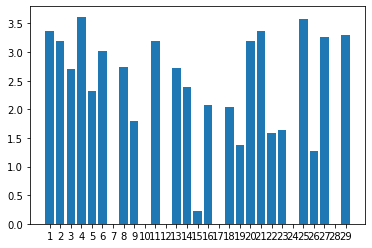

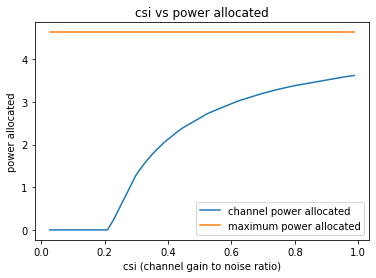

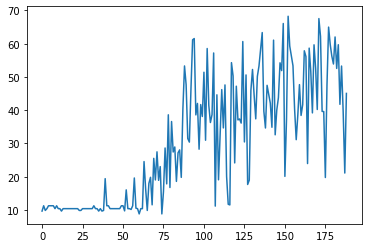

189
Power Allocated= 0
CSI= 0.05395050284545966
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9682516608871055
CSI= 0.24877001449250224
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1486945743277186
CSI= 0.5436750012756311
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.273435033648326
CSI= 0.5832285523490978
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.050025
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.004238

Power Allocated= 3.6991849829917745
CSI= 0.7758892429822323
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4879535931964285
CSI= 0.2857081521439736
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Pow

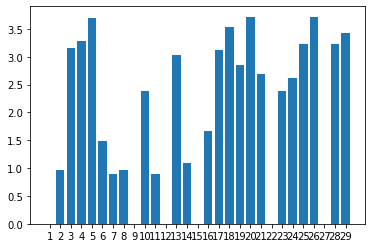

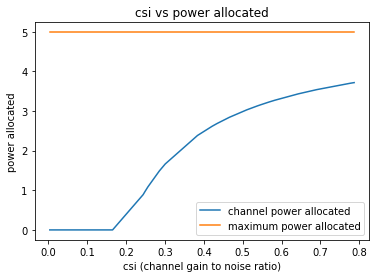

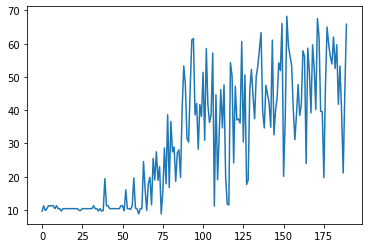

190
Power Allocated= 3.153014325809689
CSI= 0.7600746380880193
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7814867118228634
CSI= 0.5927022190430596
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0079306368396668
CSI= 0.6845826724608578
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7933662376952357
CSI= 0.5969050401722892
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18325573275709195
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0358109127297297
CSI= 0.6979030978897803
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12120484965468359
SNR= 7.83199963

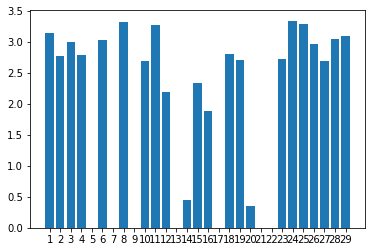

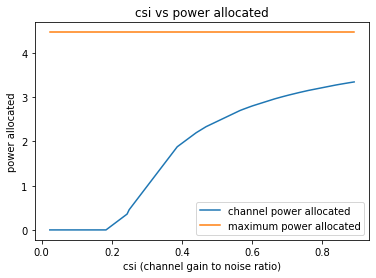

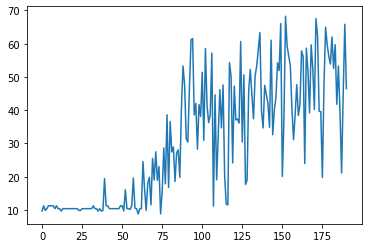

191
Power Allocated= 0
CSI= 0.05857092077521564
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1502914846257015
CSI= 0.5958432521218242
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.745413869174443
CSI= 0.9232149604548695
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 2.041659
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.068249

Power Allocated= 0
CSI= 0.05169727356846687
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7006399574456807
CSI= 0.8865678408185172
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4370052171274508
CSI= 0.2948478283919327
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.0

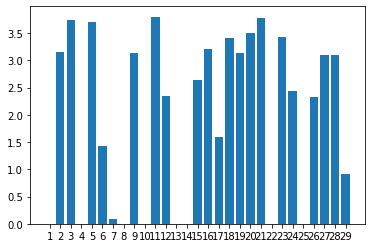

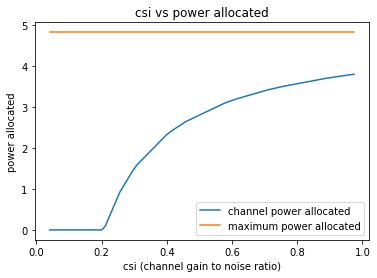

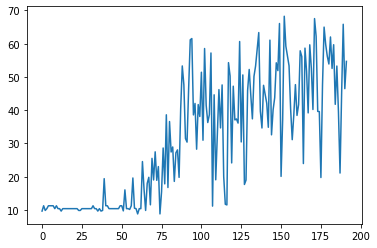

192
Power Allocated= 2.632967330398496
CSI= 0.7808713706873759
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9001497417520974
CSI= 0.9867399558921741
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.351803574159466
CSI= 0.6402932427087223
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5255672055379912
CSI= 0.41875682647263346
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7104948800152315
CSI= 0.8311908713676862
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6892820043651033
CSI= 0.8167892846864581
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 1.706250
Model client6 Train Epoch: 2 [0/320 (0%)]	Loss

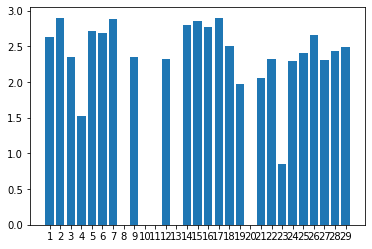

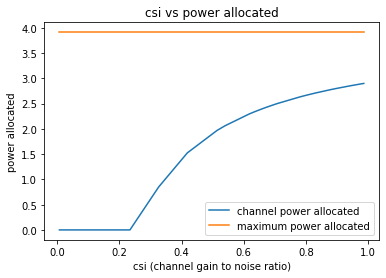

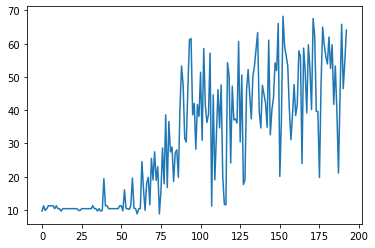

193
Power Allocated= 2.8444387410438052
CSI= 0.5655765078597103
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 1.378821
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000000

Power Allocated= 2.6932243311059736
CSI= 0.5210173733976246
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.234102121203904
CSI= 0.7254556564584475
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.278783142698256
CSI= 0.7497584000480632
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5131666187507933
CSI= 0.47633121920234944
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8349257056872963
CSI= 0.5625497934631895
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in 

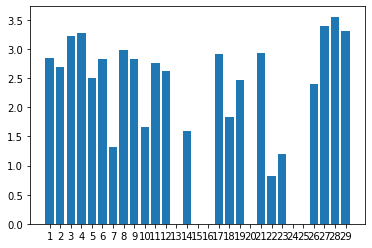

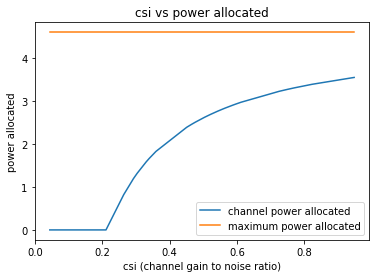

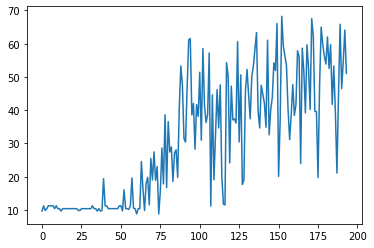

194
Power Allocated= 2.2684240153027497
CSI= 0.62615163487026
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0548092496815213
CSI= 0.5522811411949045
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.417453
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.423132

Power Allocated= 2.7722039792457327
CSI= 0.9146810461905847
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8299247978317004
CSI= 0.965664397699287
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 2.058518
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.046286

Power Allocated= 1.0469934915494084
CSI= 0.3548001924593931
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.816898
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.391198

Power Allocated= 2.7176637678832067
CSI

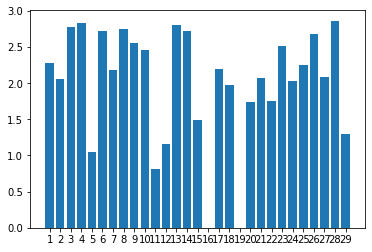

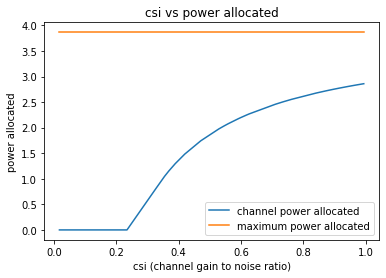

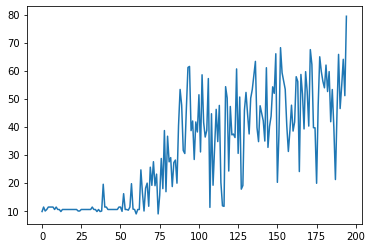

195
Power Allocated= 2.0135303679377192
CSI= 0.41647736771425603
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.380213588266416
CSI= 0.49154357351910705
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 1.056011
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.057670

Power Allocated= 3.398088922957998
CSI= 0.9837365694135428
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4939740239050021
CSI= 0.342389864634845
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.375476043597729
CSI= 0.49040157065593615
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.094212
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.702681

Power Allocated= 2.082473516464017
CSI= 0.42878930700906315
SNR= 7.275378717720197
Client: c

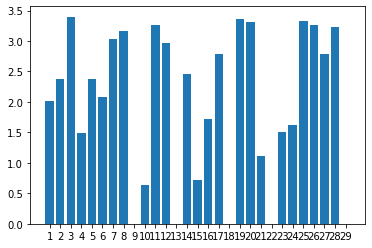

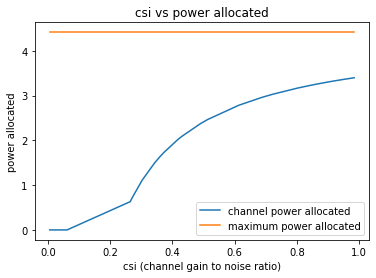

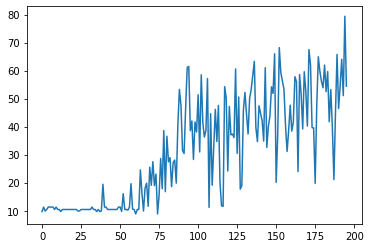

196
Power Allocated= 0.6284800828760648
CSI= 0.2608910810901266
SNR= 6.317984667002558
Client: client1
Model client1 Train Epoch: 1 [0/320 (0%)]	Loss: 2.947941
Model client1 Train Epoch: 2 [0/320 (0%)]	Loss: 0.002518

Power Allocated= 2.5678187557427234
CSI= 0.5280727367339976
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.261696234605541
CSI= 0.45458656489930094
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0435647832188244
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5779551157138352
CSI= 0.3467956920866573
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.373955
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 1.251871

Power Allocated= 2.2307260890640754
CSI= 0.4482754684753921
SNR= 7.275378717720197
Client: client6
Model cli

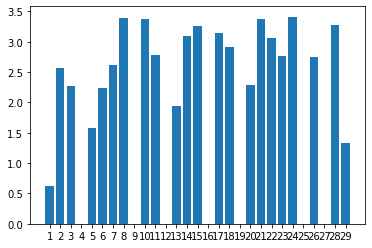

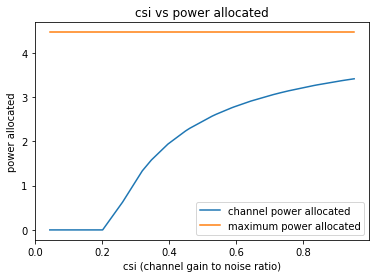

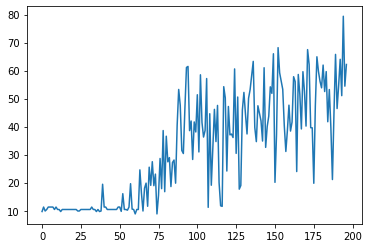

197
Power Allocated= 2.775809462498179
CSI= 0.6418185217153506
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3440178919779866
CSI= 0.33446332886326946
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.047729631457051
CSI= 0.43741610845385426
SNR= 6.847301661198481
Client: client3
Model client3 Train Epoch: 1 [0/320 (0%)]	Loss: 0.493814
Model client3 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000200

Power Allocated= 2.992008621594854
CSI= 0.7452266351413503
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19359721410590058
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6752001268032486
CSI= 0.37612619258581026
SNR= 7.275378717720197
Client: client6
Model client6 Train Epoch: 1 [0/320 (0%)]	Loss: 0.739067
Model 

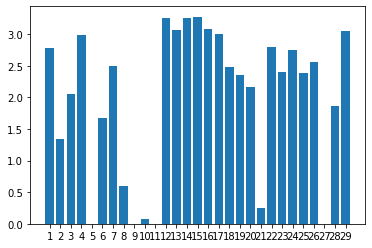

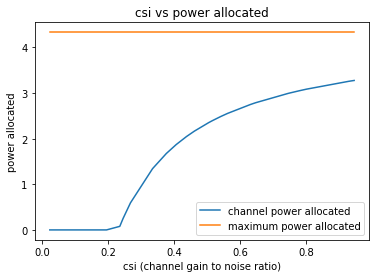

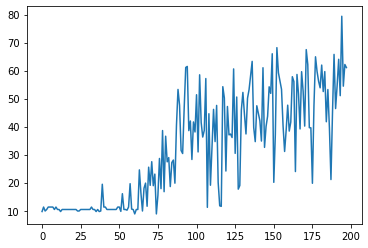

198
Power Allocated= 2.461417299062257
CSI= 0.4577582337853864
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5131823259848196
CSI= 0.31920385366918447
SNR= 6.715411813088494
Client: client2
Model client2 Train Epoch: 1 [0/320 (0%)]	Loss: 0.655454
Model client2 Train Epoch: 2 [0/320 (0%)]	Loss: 0.000769

Power Allocated= 3.6241418673151786
CSI= 0.9786318505324473
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3259090761716785
CSI= 0.7575370152351082
SNR= 6.950971410077244
Client: client4
Model client4 Train Epoch: 1 [0/320 (0%)]	Loss: 1.202485
Model client4 Train Epoch: 2 [0/320 (0%)]	Loss: 0.112235

Power Allocated= 2.430851031812212
CSI= 0.45144167963150783
SNR= 7.176047369880534
Client: client5
Model client5 Train Epoch: 1 [0/320 (0%)]	Loss: 1.514700
Model client5 Train Epoch: 2 [0/320 (0%)]	Loss: 0.353306

Power Allocated= 0
CSI= 0.1980391907

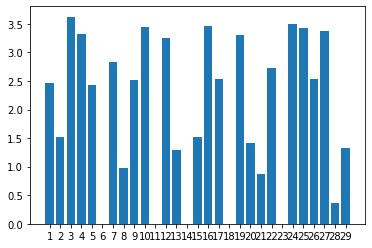

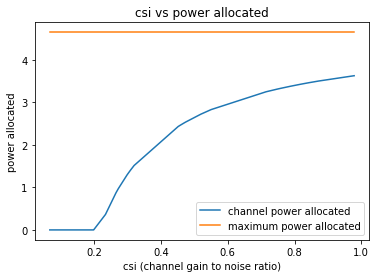

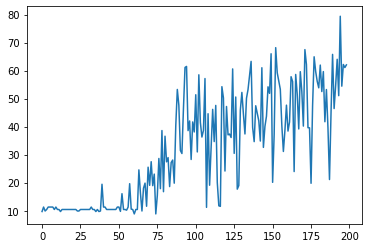

199
Power Allocated= 2.0384771778285597
CSI= 0.4266160894198169
SNR= 6.317984667002558
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.569822235805435
CSI= 0.35553244701141773
SNR= 6.715411813088494
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.032063373294817
CSI= 0.4254519540798991
SNR= 6.847301661198481
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9379249427154934
CSI= 0.6922426814283299
SNR= 6.950971410077244
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.968308675965516
CSI= 0.7071153805198207
SNR= 7.176047369880534
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0771404267952445
CSI= 0.7660694873870741
SNR= 7.275378717720197
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.694703290167344
CSI= 0.59

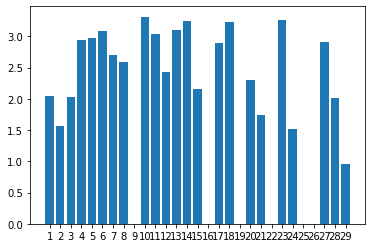

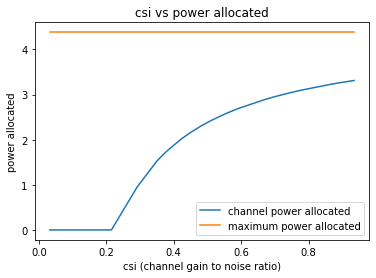

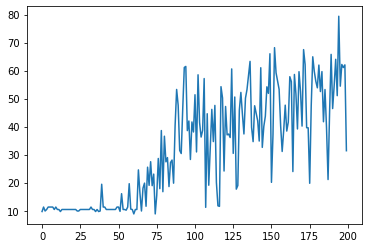

200


In [10]:
for fed_round in range(args.rounds):
    
    client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round

    # Training 
    #even slot
    
    snr=[] #snr of the channel
    csi=[] #csi of the channel
    for ii in range (int(args.clients)-1):
        #snr.append(random.uniform(args.snr_low, args.snr_high))
        csi.append(random.uniform(args.csi_low,args.csi_high))
    
    # if(fed_round==0):
    #     snr,cluster_head=get_cluster()
    if(fed_round==0): #fed_round==0 or True                                        %%%static or moving
        snr,cluster_head=get_cluster()
        temp=copy.deepcopy(cluster_head)
        temp1=copy.deepcopy(snr)
    else:
        #print(temp)
        cluster_head=copy.deepcopy(temp)
        snr=copy.deepcopy(temp1)
    #print(cluster_head)
    smallmu1=0
    gsmall1=3.402823466E+38 
    
    #water filling algorithm
    mu=1e-15
    while(mu<=1):
        #print("yay")
        #pn=max(1/mu-1/csi,0)
        g1=0
        pn1=0
        for jj in csi:
            pn=max(1/mu-1/jj,0)
            g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
            pn1+=pn
        g=g1-mu*(pn1-P*(int(args.clients)-1))
        if(g<gsmall1):
            smallmu1=mu
            gsmall1=g
        mu+=0.00002

    #print(smallmu1)
    # poptim=max(1/smallmu1-1/csi1,0)
    # print(poptim)
    index=0
    members=[]
    for i in clients:
        if(i['hook'].id!=cluster_head):
            members.append(i)
        else:
            head=i
    for client in members:
        goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
        if(goodchannel):
            client_good_channel.append(client)
        index+=1
        
    po=[]    
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    
    plt.bar([str(i) for i in range (1,len(po)+1)],po,)
    csi.sort()
    po=[]
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    fig,ax=plt.subplots()
    line1=ax.plot(csi,po,label="channel power allocated")
    line2=ax.plot(csi,[1/smallmu1]*len(csi),label="maximum power allocated")
    ax.set_title("csi vs power allocated")
    ax.set_xlabel("csi (channel gain to noise ratio)")
    ax.set_ylabel("power allocated")
    ax.legend()
    #plt.show()
    

#     # Testing 
#     for client in active_clients:
#         test(args, client['model'], device, client['testset'], client['hook'].id)
    
    
    
    print()
    print("Clients having a good channel and considered for training")
    for no in range (len(client_good_channel)):
        print(client_good_channel[no]['hook'].id)
        
        
        
    # Averaging 
        #odd slot

    head['model'] = averageModels(head['model'],client_good_channel)
    # Testing the average model
    #test(args, global_model, device, global_test_loader, 'Global')
    ac=test(args, head['model'], device, global_test_loader, 'Final')
    accuracy.append(ac)
    
    print("Power in training Round=",sum(po))
    #print("Power cap=",P*len(active_clients))
    
    #print("Total Power =",power_odd+power_even)
    print()
            
    # Share the global model with the clients
    index=0
    for client in members:
        client['model'].load_state_dict(head['model'].state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1) #CHANGE:Commented
        index+=1
        #client['model']=torch.quantization.quantize_dynamic(client['model'],{torch.nn.Conv2d},dtype=torch.qint8)
        #print(client['model'].conv1.weight.data)
    fig1,ax1=plt.subplots()
    ax1.plot([i for i in range(len(accuracy))],accuracy)
    plt.show()
    print(rc)
    rc+=1

In [11]:
print(accuracy)

[9.69, 11.29, 9.88, 10.42, 11.29, 11.29, 11.29, 11.29, 10.42, 11.29, 10.42, 10.42, 9.69, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 9.88, 9.88, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 11.29, 10.42, 10.42, 9.69, 10.42, 9.69, 9.88, 19.43, 11.29, 11.29, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 10.42, 11.29, 11.29, 9.75, 16.06, 10.42, 10.42, 10.18, 11.29, 19.63, 10.56, 10.42, 8.84, 10.42, 10.42, 24.56, 16.3, 9.88, 18.02, 19.83, 11.57, 25.52, 19.04, 27.48, 18.92, 23.05, 8.84, 15.5, 28.63, 17.86, 38.6, 16.77, 36.58, 27.43, 28.94, 18.6, 27.18, 28.07, 19.81, 40.38, 53.27, 47.62, 31.49, 30.4, 46.59, 61.12, 61.49, 38.57, 42.01, 28.27, 41.67, 38.09, 51.38, 30.96, 58.5, 41.47, 36.28, 38.65, 57.16, 11.18, 44.6, 19.08, 33.09, 46.16, 34.66, 47.57, 20.07, 11.74, 11.54, 54.26, 50.24, 24.15, 47.19, 37.06, 37.35, 36.11, 60.6, 30.45, 50.57, 17.68, 18.98, 45.91, 52.21, 44.5, 37.38, 50.15, 53.24, 58.25, 63.29, 39.7, 34.64, 47.45, 44.68, 42.08, 34.85, 61.02, 32.59, 40.07,